# Processing EEG


In [1]:
# atletas = ['c2ltb25l', 'YXJpYWRuYQ', 'bWFyaWxpYQ', 'bWFpcmE', 'bGV0aWNpYQ', 'b3JuZWxh', 'amFxdWVsaW5l']
# condicoes = ['cMOzcy1zaGFt', 'cMOzc2NhdG9kaWNh', 'cHLDqS1zaGFt', 'cHLDqWNhdG9kaWNh']

# atletas = ['athlete_1', 'athlete_2', 'athlete_3', 'athlete_4', 'athlete_5', 'athlete_6', 'athlete_7']
# condicoes = ['pre_sham', 'post_sham', 'pre_cathodic', 'post_cathodic']

# RUIDOSO: athlete == "b3JuZWxh" and condition_code == "cMOzc2NhdG9kaWNh"
# mais estabilidade (menos variabilidade) -> amFxdWVsaW5l, bWFpcmE, YXJpYWRuYQ, bGV0aWNpYQ
# menos estabilidade (mais variabilidade) -> c2ltb25l, bWFyaWxpYQ, b3JuZWxh

atleta = 'athlete_1' # ATLETA
condicao = 'pre_sham' # CONDIÇÃO

## Importando módulos e dados

In [25]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
import pandas as pd
import io
from googleapiclient.discovery import build
from googleapiclient.http import MediaIoBaseDownload


credentials = GoogleCredentials.get_application_default()
service = build('drive', 'v3', credentials=credentials)
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [26]:
!pip install mne --quiet

In [27]:
import pandas as pd
import mne
import traceback
import os


def download_file(file_id):
    request = service.files().get_media(fileId=file_id)
    metadata = service.files().get(fileId=file_id).execute()
    file_name = metadata.get('name')
    fh = io.BytesIO()
    downloader = MediaIoBaseDownload(fh, request)
    done = False
    while done is False:
        status, done = downloader.next_chunk()
        print('Download Progress: {0:.2%}'.format(status.progress()))
    fh.seek(0)
    with open(file_name, 'wb') as f:
        f.write(fh.read())
    return file_name

In [28]:
baseline_info_folder = '1Iz_96tpJM5soo30DEvs-bkZebHbI61ar' # ID da pasta 'baseline_info', contendo .xlsx com dado de tempo do início e fim do baseline das quatro condições da atleta correspondente
dados_arremessos_folder = '1JjCZi76TCJVHdqWxuP251rey8HTIzG_Q' # ID da pasta 'dados_arremessos', contendo .xlsx com timepoint de cada arremesso no EMG e FR, delta, se acertou ou não, codificação
eeg_raw_data_folder = '1ACnU1f8afWfSbjYFxP30mR7WAJbgg4D6' # ID da pasta "eeg_raw_data", contendo dados RAW de EEG (e um canal de FR) exportados do software da BrainVision
fc_raw_data_folder = '1UlkZuaHkquLLmVcE5M4pfSXnIdoNYKxF' # ID da pasta "fc_raw_data", contendo dados .CSV brutos de FC
fr_raw_data_folder = '15Qc4O9_pJ2_OfvSAFO3eW47UEtLu5kW0' # ID da pasta "fr_raw_data", contendo dados .CSV brutos de FR
trigger_data_folder = '1nf-0VKT4eBLMeQxA_g_iFoDGNLxYhKuV' # ID da pasta "trigger_data", contendo .CSV de tempo de cada arremesso no EMG e EEG, e classificação (binária e tipo de arremesso)

In [29]:
# baseline info
query = f"'{baseline_info_folder}' in parents and trashed=false" # pegando dados dos arquivos do folder
folder_files = drive.ListFile({'q': query}).GetList()

# printando os arquivos só com o nome da atleta e a condição especificados na célula acima
print('Arquivos na pasta baseline...')
for file in folder_files:
  if atleta in file["title"] and 'ecg' in file["title"]:
    print(f'Adicionando esse arquivo à variável baseline_ecg_info_df: {file["title"]}, File id: {file["id"]}')
    read_file = service.files().get_media(fileId=file["id"]).execute()
    baseline_ecg_info_df = pd.read_excel(io.BytesIO(read_file))
    match = baseline_ecg_info_df[baseline_ecg_info_df['condition'] == condicao]
    if len(match) > 0:
      try:
        baseline_ecg_start = match['start'].iloc[0]
      except:
        baseline_ecg_start = match['start '].iloc[0]
      try:
        baseline_ecg_end = match['end'].iloc[0]
      except:
        baseline_ecg_end = match['end '].iloc[0]

  elif atleta in file["title"] and 'fr' in file["title"]:
    print(f'Adicionando esse arquivo à variável baseline_fr_info_df: {file["title"]}, File id: {file["id"]}')
    read_file = service.files().get_media(fileId=file["id"]).execute()
    baseline_fr_info_df = pd.read_excel(io.BytesIO(read_file))
    match = baseline_fr_info_df[baseline_fr_info_df['condition'] == condicao]
    if len(match) > 0:
      try:
        baseline_fr_start = match['start'].iloc[0]
      except:
        baseline_fr_start = match['start '].iloc[0]
      try:
        baseline_fr_end = match['end'].iloc[0]
      except:
        baseline_fr_end = match['end '].iloc[0]


# # eeg_raw_data_folder
# query = f"'{eeg_raw_data_folder}' in parents and trashed=false" # pegando dados dos arquivos do folder
# folder_files = drive.ListFile({'q': query}).GetList()

# # printando os arquivos só com o nome da atleta e a condição especificados na célula acima
# print('Arquivos na pasta eeg_raw_data_folder...')
# for file in folder_files:
#    # Download dos arquivos .vhdr, .vmrk e .eeg para o ambiente do Google Colab para que sejam lidos pelo MNE
#   if atleta in file["title"] and condicao in file["title"] and '.vhdr' in file["title"]:
#     print(f'Fazendo download do arquivo: {file["title"]}, File id: {file["id"]}')
#     vhdr_file_name = download_file(file_id=file["id"])
#   elif atleta in file["title"] and condicao in file["title"] and '.vmrk' in file["title"]:
#     print(f'Fazendo download do arquivo: {file["title"]}, File id: {file["id"]}')
#     vmrk_file_name = download_file(file_id=file["id"])
#   elif atleta in file["title"] and condicao in file["title"] and '.eeg' in file["title"]:
#     print(f'Fazendo download do arquivo: {file["title"]}, File id: {file["id"]}')
#     eeg_file_name = download_file(file_id=file["id"])

# # print('Carregando os arquivos para o MNE-Python')
# try:
#     raw = mne.io.read_raw_brainvision(vhdr_fname=vhdr_file_name, preload=True)
# except Exception as e:
#     error_message = traceback.format_exc()
#     expected_filename = error_message.split('/')[-1][0:-7]
#     title = vhdr_file_name[0:-5]
#     # Renaming to the expected name
#     os.rename((title + '.vhdr'), (expected_filename + '.vhdr'))
#     os.rename((title + '.vmrk'), (expected_filename + '.vmrk'))
#     os.rename((title + '.eeg'), (expected_filename + '.eeg'))
#     raw = mne.io.read_raw_brainvision(vhdr_fname=(expected_filename + '.vhdr'), preload=True)
#     # Renaming to the original name (codified)
#     os.rename((expected_filename + '.vhdr'), (title + '.vhdr'))
#     os.rename((expected_filename + '.vmrk'), (title + '.vmrk'))
#     os.rename((expected_filename + '.eeg'), (title + '.eeg'))


# eeg_raw_data_folder
query = f"'{eeg_raw_data_folder}' in parents and trashed=false"  # pegando dados dos arquivos do folder
folder_files = drive.ListFile({'q': query}).GetList()

set_file_found = False
fdt_file_found = False
set_file_name = ''
fdt_file_name = ''

print('Verificando arquivos na pasta eeg_raw_data_folder...')
for file in folder_files:
    if atleta in file["title"] and '.set' in file["title"]:
        print(f'Encontrado arquivo .set: {file["title"]}, File id: {file["id"]}')
        set_file_name = download_file(file_id=file["id"])
        set_file_found = True
    elif atleta in file["title"] and '.fdt' in file["title"]:
        print(f'Encontrado arquivo .fdt: {file["title"]}, File id: {file["id"]}')
        fdt_file_name = download_file(file_id=file["id"])
        fdt_file_found = True

# Se os arquivos .set e .fdt foram encontrados, carregue-os no MNE
if set_file_found and fdt_file_found:
    raw = mne.io.read_raw_eeglab(set_file_name, preload=True)
else:
    # Processo para arquivos .vhdr, .vmrk e .eeg
    print("Arquivos .set e .fdt não encontrados. Procurando por arquivos .vhdr, .vmrk e .eeg...")
    for file in folder_files:
        if atleta in file["title"] and condicao in file["title"]:
            if '.vhdr' in file["title"]:
                print(f'Fazendo download do arquivo: {file["title"]}, File id: {file["id"]}')
                vhdr_file_name = download_file(file_id=file["id"])
            elif '.vmrk' in file["title"]:
                print(f'Fazendo download do arquivo: {file["title"]}, File id: {file["id"]}')
                vmrk_file_name = download_file(file_id=file["id"])
            elif '.eeg' in file["title"]:
                print(f'Fazendo download do arquivo: {file["title"]}, File id: {file["id"]}')
                eeg_file_name = download_file(file_id=file["id"])

    # Carregando os arquivos .vhdr, .vmrk e .eeg no MNE-Python
    try:
        raw = mne.io.read_raw_brainvision(vhdr_file_name, preload=True)
    except Exception as e:
        # Tratamento de erro para garantir que os nomes dos arquivos estão corretos
        error_message = traceback.format_exc()
        expected_filename = error_message.split('/')[-1][0:-7]
        title = vhdr_file_name[0:-5]
        os.rename((title + '.vhdr'), (expected_filename + '.vhdr'))
        os.rename((title + '.vmrk'), (expected_filename + '.vmrk'))
        os.rename((title + '.eeg'), (expected_filename + '.eeg'))
        raw = mne.io.read_raw_brainvision((expected_filename + '.vhdr'), preload=True)
        os.rename((expected_filename + '.vhdr'), (title + '.vhdr'))
        os.rename((expected_filename + '.vmrk'), (title + '.vmrk'))
        os.rename((expected_filename + '.eeg'), (title + '.eeg'))


# fc_raw_data_folder
query = f"'{fc_raw_data_folder}' in parents and trashed=false" # pegando dados dos arquivos do folder
folder_files = drive.ListFile({'q': query}).GetList()

# printando os arquivos só com o nome da atleta e a condição especificados na célula acima
print('Arquivos na pasta fc_raw_data_folder...')
for file in folder_files:
  if atleta in file["title"] and condicao in file["title"]:
    print(f'Carregando arquivo para a variável fc_raw_df: {file["title"]}, File id: {file["id"]}')
    file_read = service.files().get_media(fileId=file["id"]).execute()
    fc_raw_df = pd.read_csv(io.BytesIO(file_read))



# # fr_raw_data_folder
# query = f"'{fr_raw_data_folder}' in parents and trashed=false" # pegando dados dos arquivos do folder
# folder_files = drive.ListFile({'q': query}).GetList()

# # printando os arquivos só com o nome da atleta e a condição especificados na célula acima
# print('Arquivos na pasta fr_raw_data_folder...')
# for file in folder_files:
#   if atleta in file["title"] and condicao in file["title"]:
#     print(f'Carregando arquivo para a variável fr_raw_df: {file["title"]}, File id: {file["id"]}')
#     file_read = service.files().get_media(fileId=file["id"]).execute()
#     fr_raw_df = pd.read_csv(io.BytesIO(file_read))



# trigger_data_folder
query = f"'{trigger_data_folder}' in parents and trashed=false" # pegando dados dos arquivos do folder
folder_files = drive.ListFile({'q': query}).GetList()

# printando os arquivos só com o nome da atleta e a condição especificados na célula acima
print('Arquivos na pasta trigger_data_folder...')
for file in folder_files:
  if atleta in file["title"] and condicao in file["title"]:
    print(f'Carregando arquivo para a variável trigger_data: {file["title"]}, File id: {file["id"]}')
    file_read = service.files().get_media(fileId=file["id"]).execute()
    if '.csv' in file["title"]:
      trigger_data = pd.read_csv(io.BytesIO(file_read), sep=';')
    elif '.xlsx' in file["title"]:
      trigger_data = pd.read_excel(io.BytesIO(file_read))

Arquivos na pasta baseline...
Adicionando esse arquivo à variável baseline_ecg_info_df: athlete_1_baseline_ecg_5min.xlsx, File id: 1QHWPvNt15PMOs83akYIXFH_LeerzqbW9
Adicionando esse arquivo à variável baseline_fr_info_df: athlete_1_baseline_fr_5min.xlsx, File id: 1HQtPk-mM3rJdhtwoo0z0gqHP9y4tcpZe
Verificando arquivos na pasta eeg_raw_data_folder...
Arquivos .set e .fdt não encontrados. Procurando por arquivos .vhdr, .vmrk e .eeg...
Fazendo download do arquivo: athlete_1_pre_sham.vmrk, File id: 1LTloW9p7xvVvT-QK-7oLEiIsoAcUnS8C
Download Progress: 100.00%
Fazendo download do arquivo: athlete_1_pre_sham.vhdr, File id: 1zKL6_OUchMj2EGRpqGExHoXkLf57OKGf
Download Progress: 100.00%
Fazendo download do arquivo: athlete_1_pre_sham.eeg, File id: 1zLSrykCcE6snw8qWvQguypSJpzqUqSEz
Download Progress: 39.32%
Download Progress: 78.63%
Download Progress: 100.00%
Extracting parameters from athlete_1_pre_sham.vhdr...
Extracting parameters from Simone_S1_M1 28012020.vhdr...
Setting channel info structure

In [30]:
print(baseline_ecg_start, baseline_ecg_end)
print(baseline_fr_start,baseline_fr_end)

89.385 389.385
90 390


In [31]:
raw

<RawBrainVision | Simone_S1_M1 28012020.eeg, 65 x 1025780 (1025.8 s), ~508.8 MiB, data loaded>

In [32]:
fc_raw_df

,Unnamed: 0,X [s].50,L PECTORALIS MAJOR: EMG 6 (IM) [V],X [s].51,L PECTORALIS MAJOR: Acc 6.X (IM) [V],X [s].52,L PECTORALIS MAJOR: Acc 6.Y (IM) [g],X [s].53,L PECTORALIS MAJOR: Acc 6.Z (IM) [g],X [s].54,...,X [s].55,L PECTORALIS MAJOR: Gyro 6.Y (IM) [degrees/s],X [s].56,L PECTORALIS MAJOR: Gyro 6.Z (IM) [degrees/s],X [s].57,L PECTORALIS MAJOR: Mag 6.X (IM) [uT],X [s].58,L PECTORALIS MAJOR: Mag 6.Y (IM) [uT],X [s].59,L PECTORALIS MAJOR: Mag 6.Z (IM) [uT]
0,0,0.0000,-0.011,0.00000,0.0,0.00000,0.0,0.00000,0.0,0.00000,...,0.00000,0.0,0.00000,0.0,0.0000,0.0,0.0000,0.0,0.0000,0.0
1,1,0.0009,-0.011,0.00675,0.0,0.00675,0.0,0.00675,0.0,0.00675,...,0.00675,0.0,0.00675,0.0,0.0135,0.0,0.0135,0.0,0.0135,0.0
2,2,0.0018,-0.011,0.01350,0.0,0.01350,0.0,0.01350,0.0,0.01350,...,0.01350,0.0,0.01350,0.0,0.0270,0.0,0.0270,0.0,0.0270,0.0
3,3,0.0027,-0.011,0.02025,0.0,0.02025,0.0,0.02025,0.0,0.02025,...,0.02025,0.0,0.02025,0.0,0.0405,0.0,0.0405,0.0,0.0405,0.0
4,4,0.0036,-0.011,0.02700,0.0,0.02700,0.0,0.02700,0.0,0.02700,...,0.02700,0.0,0.02700,0.0,0.0540,0.0,0.0540,0.0,0.0540,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1141075,1141075,1026.9700,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1141076,1141076,1026.9700,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1141077,1141077,1026.9700,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1141078,1141078,1026.9700,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
trigger_data

,"tempoEMG,tempoEEG,codificacao,codificacao_certo"
0,"439.45875,437.9171,5.0,1"
1,"445.3785,443.83684999999997,1.0,1"
2,"450.79875,449.2571,1.0,1"
3,"456.057,454.51535,1.0,1"
4,"461.39625,459.8546,1.0,1"
...,...
92,"955.7055,954.16385,1.0,1"
93,"960.70725,959.1656,5.0,0"
94,"965.52,963.97835,5.0,1"
95,"970.6972499999999,969.1555999999999,2.0,1"


## Checando dados do objeto MNE RAW, realizando montagem e checagem de qualidade de canais

In [34]:
# annotations = mne.Annotations(onset = trigger_data['tempoEEG'],  # onset column in csv file
#                               duration = [0] * len(trigger_data),   # set duration to zero for all events
#                               description = trigger_data['codificacao_acerto'])   # description column in csv file
# annotations

new_names = ['Fp1', 'Fz', 'F3', 'FFT7h', 'FT9', 'FC5', 'FC1', 'C3', 'TTP7h', 'TP9', 'CP5', 'CP1', 'Pz', 'P3', 'P7', 'O1',
             'Oz', 'O2', 'P4', 'TPP8h', 'TP10', 'CP6', 'CP2', 'Cz', 'C4', 'FTT8h', 'FT10', 'FC6', 'FC2', 'F4', 'F8', 'Fp2',
             'AF7', 'AF3', 'AFz', 'F1', 'F5', 'FTT7h', 'FC3', 'FCz', 'C1', 'C5', 'TPP7h', 'CP3', 'P1', 'P5', 'PO7', 'PO3',
             'POz', 'PO4', 'PO8', 'P6', 'P2', 'CPz', 'CP4', 'TTP8h', 'C6', 'C2', 'FC4', 'FFT8h', 'F6', 'F2', 'AF4', 'AF8', 'AUXILIAR']

old_names = raw.ch_names
print(old_names)

names_mapping = dict(zip(old_names, new_names))
print(names_mapping)

raw.rename_channels(names_mapping)

['2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66']
{'2': 'Fp1', '3': 'Fz', '4': 'F3', '5': 'FFT7h', '6': 'FT9', '7': 'FC5', '8': 'FC1', '9': 'C3', '10': 'TTP7h', '11': 'TP9', '12': 'CP5', '13': 'CP1', '14': 'Pz', '15': 'P3', '16': 'P7', '17': 'O1', '18': 'Oz', '19': 'O2', '20': 'P4', '21': 'TPP8h', '22': 'TP10', '23': 'CP6', '24': 'CP2', '25': 'Cz', '26': 'C4', '27': 'FTT8h', '28': 'FT10', '29': 'FC6', '30': 'FC2', '31': 'F4', '32': 'F8', '33': 'Fp2', '34': 'AF7', '35': 'AF3', '36': 'AFz', '37': 'F1', '38': 'F5', '39': 'FTT7h', '40': 'FC3', '41': 'FCz', '42': 'C1', '43': 'C5', '44': 'TPP7h', '45': 'CP3', '46': 'P1', '47': 'P5', '48': 'PO7', '49': 'PO3', '50': 

<RawBrainVision | Simone_S1_M1 28012020.eeg, 65 x 1025780 (1025.8 s), ~508.8 MiB, data loaded>

In [35]:
raw.drop_channels(['AUXILIAR', 'AF8', 'TTP7h', 'Oz'])

<RawBrainVision | Simone_S1_M1 28012020.eeg, 61 x 1025780 (1025.8 s), ~477.4 MiB, data loaded>

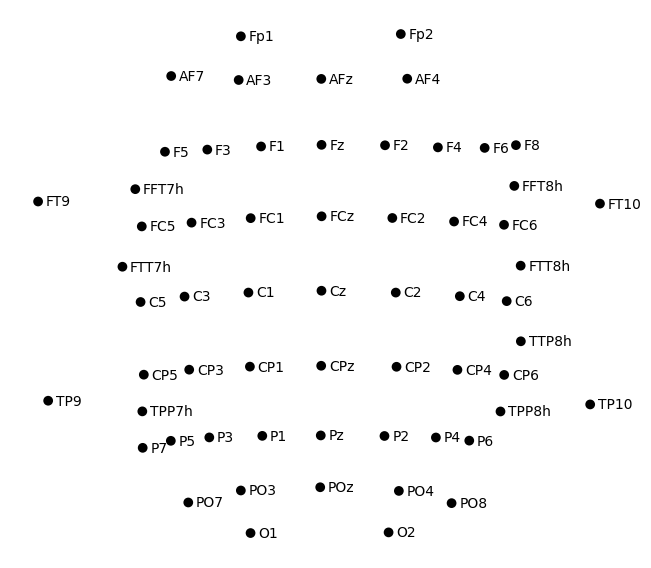

In [52]:
montage = mne.channels.make_standard_montage('standard_1005')
raw.set_montage(montage)
montage = raw.get_montage()
raw.plot_sensors(show_names=True, sphere=(0, 0, 0, 0));

In [ ]:
print(baseline_fr_start)
print(baseline_fr_end)

90
390


In [ ]:
# Defining the start and end times, excluding the first and last 15 seconds to avoid noisy data (can prejudice the ICA)
baseline_start_adjusted = baseline_fr_start + 15
baseline_end_adjusted = baseline_fr_end - 15

# Creating a copy of raw data and cropping to the adjusted baseline time window
processed_data = raw.copy().crop(tmin=baseline_start_adjusted, tmax=baseline_end_adjusted)

In [ ]:
# Processing it
processed_data.filter(0.5, 60)  # Bandpass filter the data between 0.5 and 60 Hz
processed_data.resample(500) # Resample the data to 500 Hz (optional)
processed_data.notch_filter(60) # Apply notch filter at 60 Hz to remove line noise

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 60.00 Hz
- Upper transition bandwidth: 15.00 Hz (-6 dB cutoff frequency: 67.50 Hz)
- Filter length: 6601 samples (6.601 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge: 60.65 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 60.90 Hz)
- Filter length: 3301 samples (6.602 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


<RawBrainVision | Simone_S1_M1 28012020.eeg, 61 x 135000 (270.0 s), ~62.9 MiB, data loaded>

Using matplotlib as 2D backend.


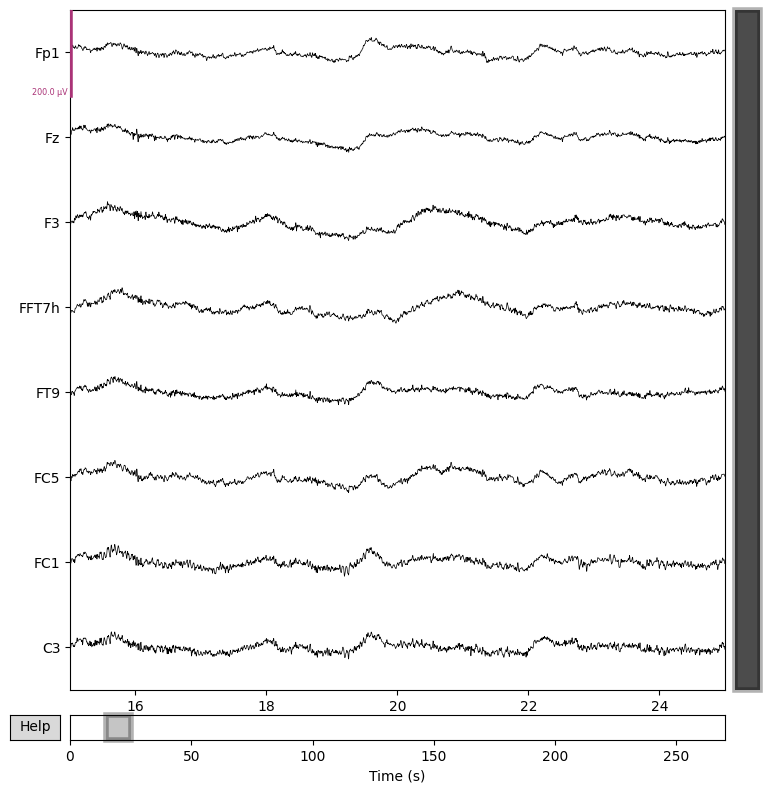

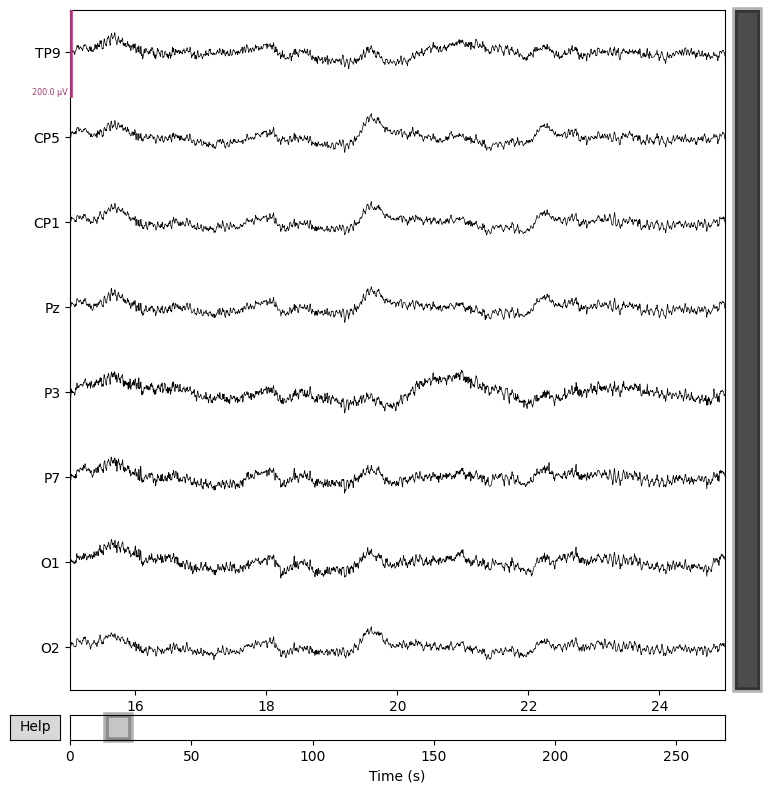

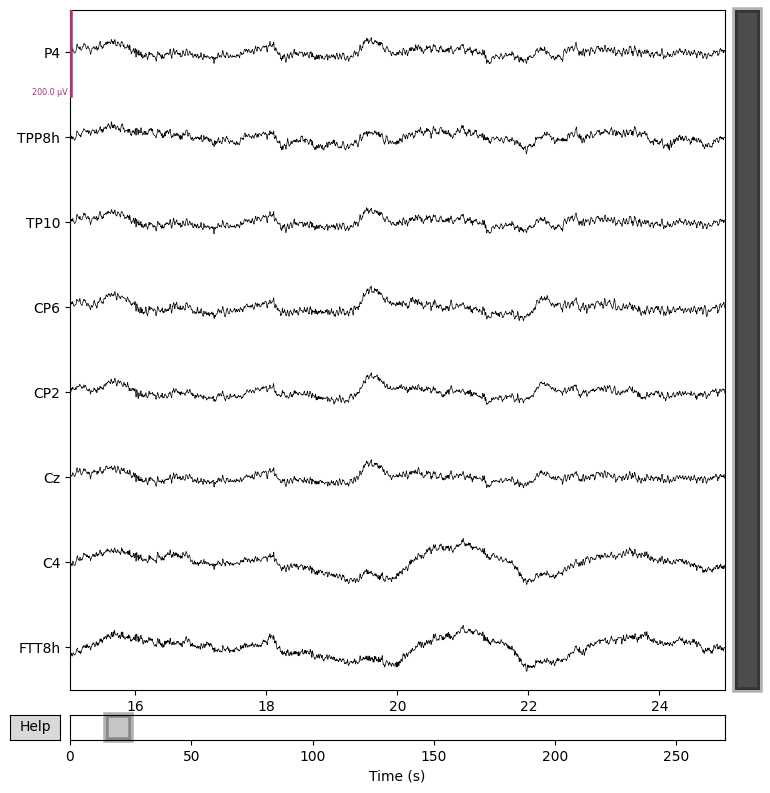

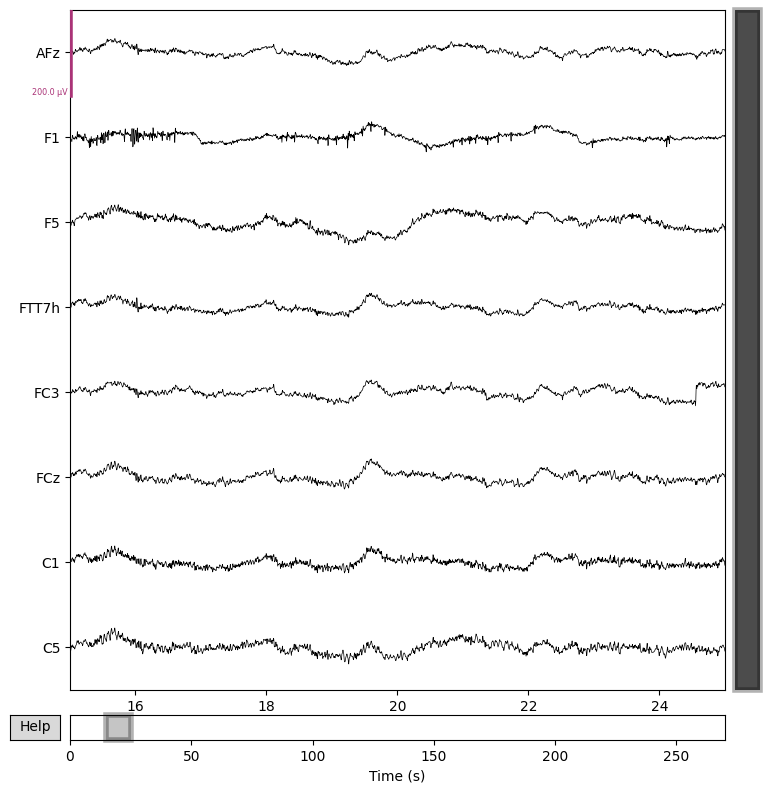

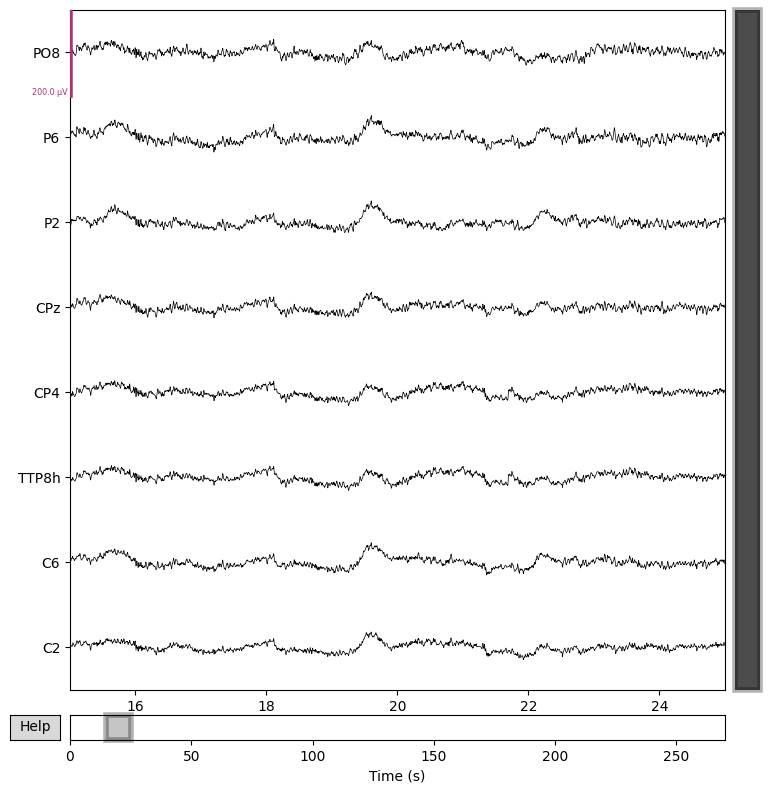

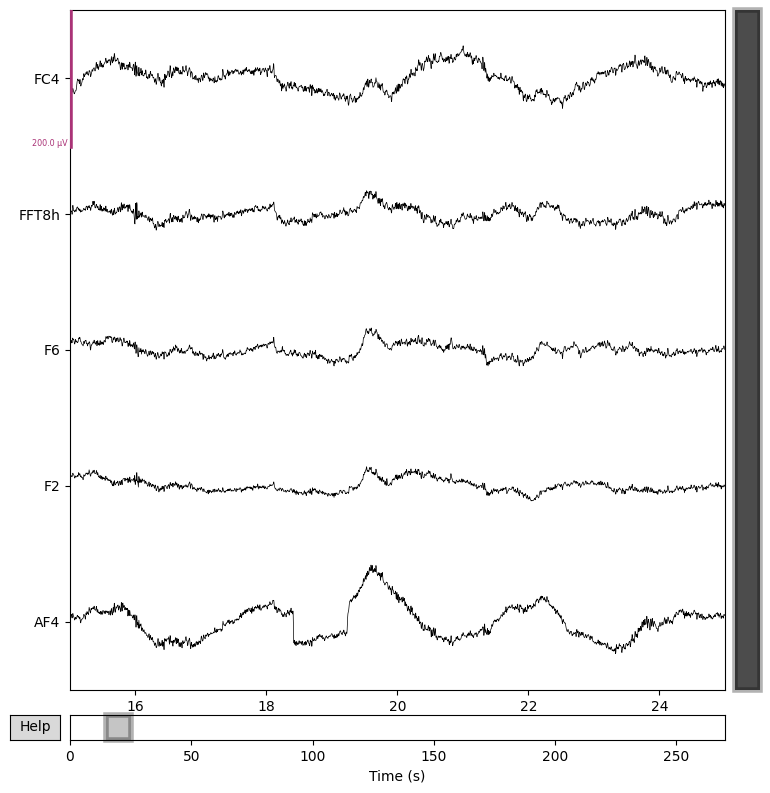

In [ ]:
# Lets view all the signals to look for bad channels.
eeg_picks = mne.pick_types(processed_data.info, meg=False, eeg=True)
start_time = 15  # Starting at 50 seconds
duration = 10    # 10-second window
scalings = {'eeg': 1e-4}

processed_data.plot(n_channels=10, order=eeg_picks[0:8], start=start_time, duration=duration, scalings=scalings);
processed_data.plot(n_channels=10, order=eeg_picks[8:16], start=start_time, duration=duration, scalings=scalings);
processed_data.plot(n_channels=10, order=eeg_picks[16:24], start=start_time, duration=duration, scalings=scalings);
processed_data.plot(n_channels=10, order=eeg_picks[32:40], start=start_time, duration=duration, scalings=scalings);
processed_data.plot(n_channels=10, order=eeg_picks[48:56], start=start_time, duration=duration, scalings=scalings);
processed_data.plot(n_channels=10, order=eeg_picks[56:70], start=start_time, duration=duration, scalings=scalings);

In [ ]:
# Removing bad channels:

# Get the current list of bad channels
current_bad_channels = processed_data.info['bads']

# Define additional bad channels you want to add
new_bad_channels = []  # Replace with the actual names of the new bad channels

# Combine the current and new bad channels, making sure to avoid duplicates
all_bad_channels = list(set(current_bad_channels + new_bad_channels))

# Update the bad channels in the processed_data object
processed_data.info['bads'] = all_bad_channels
print(processed_data.info['bads'])

[]


## Detecting Artifacts using ICA

In [ ]:
duration_sec = processed_data.n_times / processed_data.info['sfreq']
print("Duration of the data in seconds:", duration_sec)

duration_min = duration_sec / 60
print("Duration of the data in minutes:", duration_min)

duration_hours = duration_min / 60
print("Duration of the data in hours:", duration_hours)

Duration of the data in seconds: 270.0
Duration of the data in minutes: 4.5
Duration of the data in hours: 0.075


In the case of detecting phase synchronicity between channels and frequency bands, it is generally more important to preserve the full information content of the data rather than applying dimensionality reduction. This is because the phase relationships between channels are critical to accurately estimate synchronicity, and dimensionality reduction might distort or eliminate some of these relationships.

In this scenario, it is recommended to set the number of ICA components equal to the number of available channels. This choice ensures that you retain all the information in the data, which is important for accurately estimating phase synchronicity between channels and frequency bands. However, you should still perform artifact removal (e.g., using ICA) to minimize the impact of noise and artifacts on the synchronicity analysis.

This can be done as follows:

In [ ]:
# Get the number of good channels (excluding bad channels)
n_channels = len(processed_data.ch_names) - len(processed_data.info['bads'])

# Running ICA on the processed_data
ica = mne.preprocessing.ICA(random_state=42, method='fastica', n_components=n_channels) # Create an ICA object
ica.fit(processed_data) # Fit the ICA object to the raw data
ica.plot_components() # Plot the ICA components

Output hidden; open in https://colab.research.google.com to view.

## Execute this session to detect (some) artifacts automatically

In [ ]:
!pip install autoreject --quiet # https://autoreject.github.io/stable/index.html

If your data doesn't have events, you can still estimate the rejection threshold using the autoreject library by creating epochs with equal-length segments of your continuous data:

In [ ]:
# Define parameters for creating epochs from continuous data
tmin, tmax = 0, 2  # Define the time window for epoching (in seconds)
duration = tmax - tmin
overlap = 0  # No overlap between consecutive epochs

# Create equally spaced events
sfreq = processed_data.info['sfreq']  # Sampling frequency
events = mne.make_fixed_length_events(processed_data, start=0, stop=None, duration=duration, overlap=overlap)

# Create epochs using the equally spaced events
epochs = mne.Epochs(processed_data, events, event_id=None, tmin=tmin, tmax=tmax, baseline=None, preload=True)

Not setting metadata
135 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 135 events and 1001 original time points ...
1 bad epochs dropped


In [ ]:
from autoreject import get_rejection_threshold

# Get the rejection parameters using the epochs
reject = get_rejection_threshold(epochs)
print('Reject parameters:', reject)

# Create epochs using the equally spaced events and the computed rejection parameters
epochs_clean = mne.Epochs(processed_data, events, event_id=None, tmin=tmin, tmax=tmax, baseline=None, reject=reject, preload=True)

# Find EOG-related components using Fp1 and Fp2 channels
eog_indices, _ = ica.find_bads_eog(epochs_clean, ch_name=['Fp1', 'Fp2'])

# Find ECG-related components
try:
    ecg_indices, _ = ica.find_bads_ecg(epochs_clean)
except ValueError:
    ecg_indices = []  # If no ECG channel is found or an artificial ECG channel cannot be generated

Estimating rejection dictionary for eeg
Reject parameters: {'eeg': 0.000504191723827873}
Not setting metadata
135 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 135 events and 1001 original time points ...
1 bad epochs dropped
Using EOG channels: Fp1, Fp2


Kurtosis is a measure of the "tailedness" of a distribution. Components with high kurtosis values might be related to artifacts, as they often exhibit non-Gaussian distributions.

In [ ]:
import numpy as np
from scipy.stats import kurtosis

# Detect high-amplitude artifacts
kurtosis_threshold = 10
high_amplitude_indices = []

# Loop through ICA components
for idx in range(ica.n_components_):
    component = ica.get_sources(processed_data).get_data(picks=idx).flatten()

    # Calculate the kurtosis of the component
    component_kurtosis = kurtosis(component)

    if component_kurtosis > kurtosis_threshold:
        high_amplitude_indices.append(idx)

In [ ]:
# Combine the indices and exclude the identified components
ica.exclude += eog_indices + ecg_indices + high_amplitude_indices
print('eog_indices (to exclude):', eog_indices, '\necg_indices (to exclude):', ecg_indices)


# Get the full set of component indices
n_components = len(raw.ch_names)
component_indices = np.arange(n_components)

# Exclude the high-amplitude indices to obtain the "important indices"
important_indices = np.setdiff1d(component_indices, high_amplitude_indices)
print('high_amplitude_indices (to think about excluding or not):', high_amplitude_indices)
print('important indices (to not exclude):', list(important_indices))

eog_indices (to exclude): [0, 2, 3, 5, 1] 
ecg_indices (to exclude): []
high_amplitude_indices (to think about excluding or not): [6, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 23, 24, 26, 27, 28, 30, 31, 33, 34, 35, 37, 39, 40, 41, 44, 46, 47, 48, 49, 53, 55]
important indices (to not exclude): [0, 1, 2, 3, 4, 5, 7, 8, 19, 20, 21, 22, 25, 29, 32, 36, 38, 42, 43, 45, 50, 51, 52, 54, 56, 57, 58, 59, 60]


## Execute this session to analyse the ICAs manually and then define which components to eliminate (artifacts).

In [ ]:
# Saving the ICA property plots
# turn off interactive display for this code block only
%matplotlib agg

# save the plotted properties
figs = ica.plot_properties(processed_data, picks=[x for x in range(0, n_channels)], dB=True, figsize=[9, 9], verbose=False, show=False);

# create components folder
if not os.path.exists('components'):
  os.makedirs('components')

# save each figure to a file
for i, fig in enumerate(figs):
  fig.savefig(f'components/ICA_{i}.png')

# turn on interactive display
%matplotlib inline

/usr/local/lib/python3.11/dist-packages/mne/viz/ica.py:181: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


Now you can click on the folder icon below and go to "components" folder, selecting the ICA image you want to inspect, or select individually by running the cell below:

In [ ]:
print('eog_indices (to exclude):', eog_indices, '\necg_indices (to exclude):', ecg_indices)
print('high_amplitude_indices (to think about excluding or not):', high_amplitude_indices)
print('important indices (to not exclude):', list(important_indices))

eog_indices (to exclude): [0, 2, 3, 5, 1] 
ecg_indices (to exclude): []
high_amplitude_indices (to think about excluding or not): [6, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 23, 24, 26, 27, 28, 30, 31, 33, 34, 35, 37, 39, 40, 41, 44, 46, 47, 48, 49, 53, 55]
important indices (to not exclude): [0, 1, 2, 3, 4, 5, 7, 8, 19, 20, 21, 22, 25, 29, 32, 36, 38, 42, 43, 45, 50, 51, 52, 54, 56, 57, 58, 59, 60]


In [ ]:
import ipywidgets as widgets
from IPython.display import display, Image, clear_output

# Define a function to display the image for the clicked button
def on_button_click(button):
    ICA_number = int(button.description)
    image_filename = f"components/ICA_{ICA_number}.png"
    with output:
        clear_output(wait=True)
        display(Image(filename=image_filename))

# Create a horizontal box to hold the buttons
button_box = widgets.HBox()

# Create a button for each number from 0 to 61 and add it to the box
for i in range(n_channels):
    button = widgets.Button(description=str(i))
    button.layout.width, button.layout.height, button.layout.flex = '60px', '60px', '0 0 auto'
    button.on_click(on_button_click)
    button_box.children += (button,)

# Create an output area to display the images
output = widgets.Output()
display(widgets.VBox([button_box, output]))


# og_indices (to exclude):

In [ ]:
from PIL import Image as PILImage
from IPython.display import display, Image

# Create a list to hold the images
image_list = []

# Loop through each channel to append image to the list
for i in range(n_channels):
    image_filename = f"components/ICA_{i}.png"
    img = PILImage.open(image_filename)
    image_list.append(img)

# Save the images as a GIF
image_list[0].save('animated_ica.gif',
                   save_all=True, append_images=image_list[1:], loop=0, duration=2000)

# Display the GIF in the notebook
display(Image(filename="animated_ica.gif")) # 0

Output hidden; open in https://colab.research.google.com to view.

## Analisando sinal com e sem componentes

In [ ]:
from PIL import ImageOps
from PIL import Image as PILImage, ImageDraw, ImageFont
import IPython.display
import io
from matplotlib import pyplot as plt
import mne
import numpy as np


!apt install -y fonts-freefont-ttf

# The font should be available at this path now
font_path = "/usr/share/fonts/truetype/freefont/FreeMono.ttf"

# Now you can load the font in your PIL code
try:
    font = ImageFont.truetype(font_path, 60)
    print("Custom font loaded.")
except IOError:
    font = ImageFont.load_default()
    print("Default font used.")

def create_title_image(text, img_width, img_height, font_path="/usr/share/fonts/truetype/freefont/FreeMono.ttf"):
    title_img = PILImage.new('RGB', (img_width, img_height), 'white')
    draw = ImageDraw.Draw(title_img)
    try:
        font = ImageFont.truetype(font_path, 60)  # 30 is the font size
    except IOError:
        font = ImageFont.load_default()
        print("Default font used.")

    bbox = draw.textbbox((0, 0), text, font=font)
    text_width = bbox[2] - bbox[0]
    text_height = bbox[3] - bbox[1]

    position = ((title_img.width - text_width) // 2, (title_img.height - text_height) // 2)
    draw.text(position, text, font=font, fill="black")
    return title_img

def plot_components_to_gif(data_copy, ica, bad_components, font_path="/usr/share/fonts/truetype/freefont/FreeMono.ttf"):
    def get_image():
        buf = io.BytesIO()
        plt.savefig(buf, format='png', bbox_inches='tight', pad_inches=0, dpi=300)
        buf.seek(0)
        return PILImage.open(buf)

    ica.exclude = bad_components
    data_with_all_bad_components = ica.apply(data_copy.copy(), verbose=False)
    ica.exclude = bad_components[:-1]
    data_without_last_bad_component = ica.apply(data_copy.copy(), verbose=False)

    # Títulos em português
    titles = [
        f"Sem os componentes: {bad_components[:-1]}",
        f"Sem os componentes: {bad_components}"
    ]

    combined_images = []

    for data, title in zip([data_without_last_bad_component, data_with_all_bad_components], titles):
        data.plot(n_channels=10, scalings={'eeg': 1e-4}, show=False)
        plot_image = get_image()
        title_image = create_title_image(title, plot_image.width, 50, font_path)
        plt.close()

        # Combina a imagem do título com a do plot
        combined_img = PILImage.new('RGB', (plot_image.width, plot_image.height + title_image.height))
        combined_img.paste(title_image, (0, 0))
        combined_img.paste(plot_image, (0, title_image.height))

        combined_images.append(combined_img)

    # Salva as imagens combinadas como GIF
    plot_buf = io.BytesIO()
    combined_images[0].save(plot_buf,
                            format='GIF',
                            save_all=True,
                            append_images=combined_images[1:],
                            loop=0,
                            duration=1000)

    # Exibe o GIF (Colab)
    plot_buf.seek(0)
    display(IPython.display.Image(data=plot_buf.read(), format='png'))


data_copy = processed_data.copy();
data_copy.crop(tmin=15, tmax=25);

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-freefont-ttf is already the newest version (20120503-10build1).
0 upgraded, 0 newly installed, 0 to remove and 29 not upgraded.
Custom font loaded.


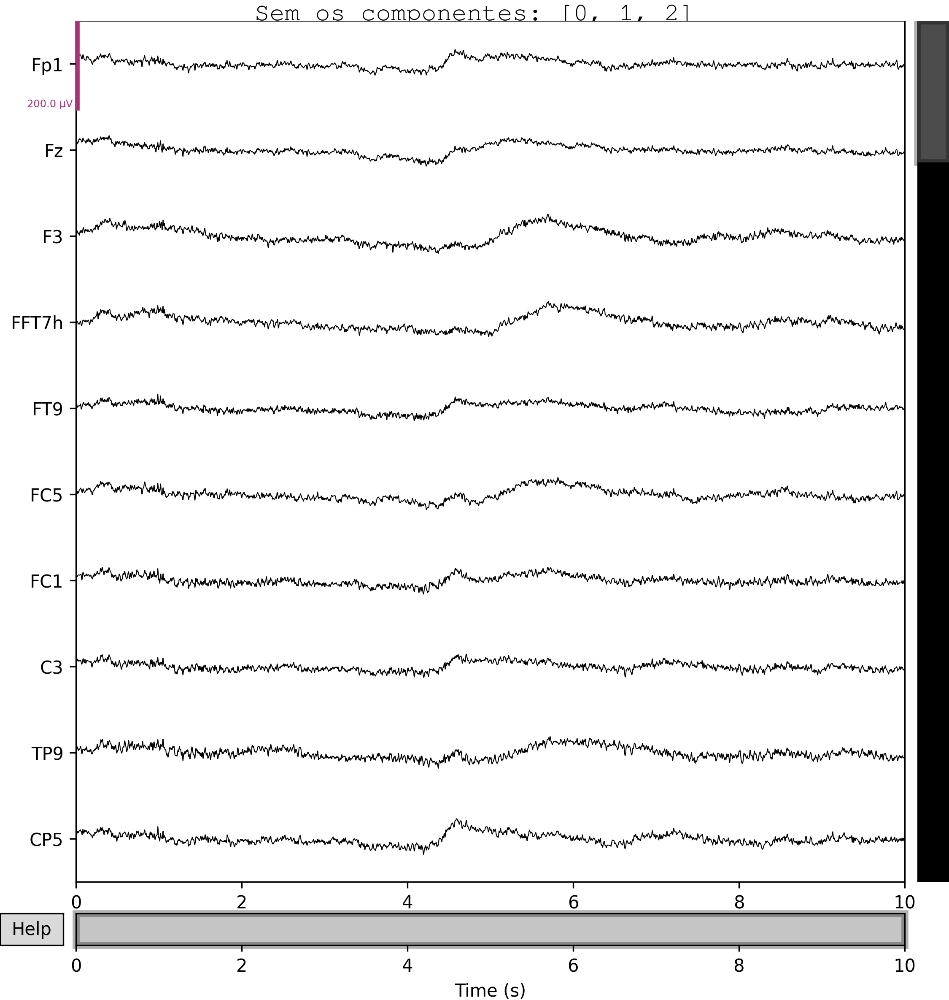

In [ ]:
bad_components = [0, 1, 2, 3]
plot_components_to_gif(data_copy, ica, bad_components)

## Retirando os componentes dos dados.

In [ ]:
# Define here the components you want to exclude from the processed data
components_to_exclude = [0]

In [ ]:
# Removing bad channels:

# Get the current list of bad channels
current_bad_channels = processed_data.info['bads']

# Define additional bad channels you want to add
new_bad_channels = ['P3', 'C5', 'FFT7h', 'C6', 'FC1']  # Replace with the actual names of the new bad channels

# Combine the current and new bad channels, making sure to avoid duplicates
all_bad_channels = list(set(current_bad_channels + new_bad_channels))

# Update the bad channels in the processed_data object
processed_data.info['bads'] = all_bad_channels
print(processed_data.info['bads'])

['FFT7h', 'FC1', 'C6', 'P3', 'C5']


In [ ]:
# Create a copy of the processed_data object
processed_data_without_artifacts = processed_data.copy()

# Applying the ICA method excluding components indicated on the "components_to_exclude" list
processed_data_without_artifacts = ica.apply(processed_data_without_artifacts, exclude=components_to_exclude)

# This will save the corrected data in MNE format. You can then use this data for further analysis on the future
print('Saving processed_data_without_artifacts on a file called', f'{atleta}_{condicao}.fif')
processed_data_without_artifacts.save(f'{atleta}_{condicao}.fif', overwrite=True)

Applying ICA to Raw instance


ValueError: operands could not be broadcast together with shapes (56,135000) (61,1) (56,135000) 

In [ ]:
# selected_channels = ['F3', 'F4']
# processed_data_without_artifacts_only_desired_channels = processed_data_without_artifacts.copy().pick_channels(selected_channels)

# Processing Synchronicity

After preprocessing the data and performed ICA with the appropriate number of components, we can proceed with phase synchronicity analysis using methods such as Phase Locking Value (PLV), Phase Lag Index (PLI), or Imaginary Coherence (IC). MNE-Python provides several tools for computing connectivity measures, including phase synchronicity, which you can find in the mne.connectivity module.

In [ ]:
from pydrive2.auth import GoogleAuth
from pydrive2.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
import pandas as pd
import io
from googleapiclient.discovery import build
from googleapiclient.http import MediaIoBaseDownload

# Authenticate and create the PyDrive2 client
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# Create the Google Drive API service
credentials = GoogleCredentials.get_application_default()
service = build('drive', 'v3', credentials=credentials)

In [ ]:
!pip install mne --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 34.4 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import mne
import traceback
import os

def download_file(file_id):
    request = service.files().get_media(fileId=file_id)
    metadata = service.files().get(fileId=file_id).execute()
    file_name = metadata.get('name')
    fh = io.BytesIO()
    downloader = MediaIoBaseDownload(fh, request)
    done = False
    while done is False:
        status, done = downloader.next_chunk()
        print('Download Progress: {0:.2%}'.format(status.progress()))
    fh.seek(0)
    with open(file_name, 'wb') as f:
        f.write(fh.read())
    return file_name

In [ ]:
baseline_info_folder = '1yUXYePgEUUuqE0VhI5tYKFHNGifdg-ie' # ID da pasta 'baseline_info', contendo .xlsx com dado de tempo do início e fim do baseline das quatro condições da atleta correspondente
dados_arremessos_folder = '1T6I8kPsy7oQ7nTSt1Gfw-3a_prBFP37m' # ID da pasta 'dados_arremessos', contendo .xlsx com timepoint de cada arremesso no EMG e FR, delta, se acertou ou não, codificação
eeg_raw_data_folder = '1-7myAJKL9rGr4mGQ2Fyo7uOHWFOGSCME' # ID da pasta "eeg_raw_data", contendo dados RAW de EEG (e um canal de FR) exportados do software da BrainVision
fc_raw_data_folder = '1ShKv53-RN0CpZ-BDGXcm1RolaglkAVTh' # ID da pasta "fc_raw_data", contendo dados .CSV brutos de FC
fr_raw_data_folder = '1F05hJqabOAUEuEvP2ijXdUlY5DpnOFxw' # ID da pasta "fr_raw_data", contendo dados .CSV brutos de FR
trigger_data_folder = '1UPj0kndk_xijRdkwM0vi2QI7nKvt39zm' # ID da pasta "trigger_data", contendo .CSV de tempo de cada arremesso no EMG e EEG, e classificação (binária e tipo de arremesso)

# ID da pasta contendo dados processados e com tratamento de artefatos.
eeg_processed_without_components_folder = '1PRaH4O3pB4Nyb7nRl7oLuH9iu5aSKNrO'

In [ ]:
def get_baseline_info(atleta, condicao):
  # baseline info
  baseline_info_folder = '1yUXYePgEUUuqE0VhI5tYKFHNGifdg-ie'
  query = f"'{baseline_info_folder}' in parents and trashed=false" # pegando dados dos arquivos do folder
  folder_files = drive.ListFile({'q': query}).GetList()

  # printando os arquivos só com o nome da atleta e a condição especificados na célula acima
  print('Arquivos na pasta baseline...')
  for file in folder_files:
    if atleta in file["title"] and 'ecg' in file["title"]:
      print(f'Adicionando esse arquivo à variável baseline_ecg_info_df: {file["title"]}, File id: {file["id"]}')
      read_file = service.files().get_media(fileId=file["id"]).execute()
      baseline_ecg_info_df = pd.read_excel(io.BytesIO(read_file))
      match = baseline_ecg_info_df[baseline_ecg_info_df['Condição'] == condicao]
      if len(match) > 0:
        try:
          baseline_ecg_start = match['Início'].iloc[0]
        except:
          baseline_ecg_start = match['Início '].iloc[0]
        try:
          baseline_ecg_end = match['Fim'].iloc[0]
        except:
          baseline_ecg_end = match['Fim '].iloc[0]

    elif atleta in file["title"] and 'fr' in file["title"]:
      print(f'Adicionando esse arquivo à variável baseline_fr_info_df: {file["title"]}, File id: {file["id"]}')
      read_file = service.files().get_media(fileId=file["id"]).execute()
      baseline_fr_info_df = pd.read_excel(io.BytesIO(read_file))
      match = baseline_fr_info_df[baseline_fr_info_df['Condição'] == condicao]
      if len(match) > 0:
        try:
          baseline_fr_start = match['Início'].iloc[0]
        except:
          baseline_fr_start = match['Início '].iloc[0]
        try:
          baseline_fr_end = match['Fim'].iloc[0]
        except:
          baseline_fr_end = match['Fim '].iloc[0]

  return baseline_ecg_start, baseline_ecg_end, baseline_fr_start, baseline_fr_end

In [ ]:
# eeg_processed_without_components_folder
query = f"'{eeg_processed_without_components_folder}' in parents and trashed=false" # pegando dados dos arquivos do folder
folder_files = drive.ListFile({'q': query}).GetList()

# printando os arquivos só com o nome da atleta e a condição especificados na célula acima
print('Arquivos na pasta eeg_processed_without_components_folder...')
for file in folder_files:
   # Download dos arquivos .fif para o ambiente do Google Colab para que sejam lidos pelo MNE
    print(f'Fazendo download do arquivo: {file["title"]}, File id: {file["id"]}')
    fif_file_name = download_file(file_id=file["id"])


def get_fc_raw_data(atleta, condicao):
  # fc_raw_data_folder
  query = f"'{fc_raw_data_folder}' in parents and trashed=false" # pegando dados dos arquivos do folder
  folder_files = drive.ListFile({'q': query}).GetList()

  # printando os arquivos só com o nome da atleta e a condição especificados na célula acima
  print('Arquivos na pasta fc_raw_data_folder...')
  for file in folder_files:
    if atleta in file["title"] and condicao in file["title"]:
      print(f'Carregando arquivo para a variável fc_raw_df: {file["title"]}, File id: {file["id"]}')
      file_read = service.files().get_media(fileId=file["id"]).execute()
      fc_raw_df = pd.read_csv(io.BytesIO(file_read))

  return fc_raw_df

Arquivos na pasta eeg_processed_without_components_folder...
Fazendo download do arquivo: athlete_7_post_sham.fif, File id: 1s2Q0N86j9ax2X6HXylFn8TREkpJtPhSs
Download Progress: 100.00%
Fazendo download do arquivo: athlete_6_post_sham.fif, File id: 1HYWNMztYdTuD8I4wju3EBk2YYJATMnju
Download Progress: 100.00%
Fazendo download do arquivo: athlete_5_post_sham.fif, File id: 1laVuuNmYcJGWWwOP029gtiuI4ojGNne9
Download Progress: 100.00%
Fazendo download do arquivo: athlete_4_post_sham.fif, File id: 1ZCdoTq2QaCoRtdAOoEeFX1qx1rxCMZ73
Download Progress: 100.00%
Fazendo download do arquivo: athlete_3_post_sham.fif, File id: 1g-3Vl1d5p57IrTsz1O-tiFc2okKimJc0
Download Progress: 100.00%
Fazendo download do arquivo: athlete_2_post_sham.fif, File id: 12FkIo8cHDpaPBXoT2NCFCwS5kHOffHD3
Download Progress: 100.00%
Fazendo download do arquivo: athlete_1_post_sham.fif, File id: 1uB_vgbYIY2HwsouzYOBYJZZIb23HpyPH
Download Progress: 100.00%
Fazendo download do arquivo: athlete_2_post_cathodic.fif, File id: 17eU

In [ ]:
from mne.time_frequency import tfr_morlet
from mne.filter import filter_data
from scipy.signal import hilbert
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import itertools
from tqdm import tqdm
import zipfile
from google.colab import files
import os


# Define function to compute phase locking value (PLV)
def compute_plv(x, y):
    plv = np.abs(np.mean(np.exp(1j * (np.angle(x) - np.angle(y)))))
    return plv

def get_plv_matrices_between_bands_and_frequencies(baseline_eeg):
  mne.set_log_level('WARNING')

  # Define the frequency bands you want to analyze
  delta_band = [0.5, 4]
  theta_band = [4, 8]
  alpha_band = [8, 13]
  beta_band = [13, 30]
  gamma_band = [30, 60]

  # Filter the Raw object for each frequency band
  delta_eeg = baseline_eeg.copy().filter(l_freq=delta_band[0], h_freq=delta_band[1], verbose=None)
  theta_eeg = baseline_eeg.copy().filter(l_freq=theta_band[0], h_freq=theta_band[1], verbose=None)
  alpha_eeg = baseline_eeg.copy().filter(l_freq=alpha_band[0], h_freq=alpha_band[1], verbose=None)
  beta_eeg = baseline_eeg.copy().filter(l_freq=beta_band[0], h_freq=beta_band[1], verbose=None)
  gamma_eeg = baseline_eeg.copy().filter(l_freq=gamma_band[0], h_freq=gamma_band[1], verbose=None)

  # Convert filtered Raw objects to Epochs objects
  events = mne.make_fixed_length_events(baseline_eeg, duration=1, start=0)
  make_epochs = lambda eeg: mne.Epochs(eeg, events, tmin=0, tmax=1, baseline=None, detrend=None, preload=True)
  delta_epochs = make_epochs(delta_eeg)
  theta_epochs = make_epochs(theta_eeg)
  alpha_epochs = make_epochs(alpha_eeg)
  beta_epochs = make_epochs(beta_eeg)
  gamma_epochs = make_epochs(gamma_eeg)

  # Compute time-frequency representations for each frequency band
  get_power = lambda epochs: epochs.apply_hilbert(envelope=False, verbose=None).get_data()
  delta_power = get_power(delta_epochs)
  theta_power = get_power(theta_epochs)
  alpha_power = get_power(alpha_epochs)
  beta_power = get_power(beta_epochs)
  gamma_power = get_power(gamma_epochs)

  # Compute PLV between each channel pair for each frequency band
  plv_matrix_each_channel_pair_for_each_frequency_band = np.zeros((baseline_eeg.info['nchan'], baseline_eeg.info['nchan'], 5))
  for i in tqdm(range(baseline_eeg.info['nchan']), desc="Processing channels"):
      for j in range(baseline_eeg.info['nchan']):
          if i == j:
              continue
          plv_matrix_each_channel_pair_for_each_frequency_band[i][j][0] = compute_plv(delta_power[:, i], delta_power[:, j])
          plv_matrix_each_channel_pair_for_each_frequency_band[i][j][1] = compute_plv(theta_power[:, i], theta_power[:, j])
          plv_matrix_each_channel_pair_for_each_frequency_band[i][j][2] = compute_plv(alpha_power[:, i], alpha_power[:, j])
          plv_matrix_each_channel_pair_for_each_frequency_band[i][j][3] = compute_plv(beta_power[:, i], beta_power[:, j])
          plv_matrix_each_channel_pair_for_each_frequency_band[i][j][4] = compute_plv(gamma_power[:, i], gamma_power[:, j])


  # Compute PLV between each frequency band pair
  frequency_bands = [delta_power, theta_power, alpha_power, beta_power, gamma_power]
  plv_matrix_each_frequency_band = np.zeros((5, 5))
  for i in tqdm(range(5), desc="Processing frequency bands"):
      for j in range(5):
          if i == j:
              continue
          plv_matrix_each_frequency_band[i][j] = compute_plv(frequency_bands[i], frequency_bands[j])

  return plv_matrix_each_channel_pair_for_each_frequency_band, plv_matrix_each_frequency_band


def visualize_mean_plv_across_frequency_bands_and_channel_pairs(plv_matrices, atleta, condicao):
  # Get mean PLV of PLV matrices
  mean_plv = np.mean(plv_matrices, axis=2)

  # Visualize mean PLV across all frequency bands for each channel pair
  fig, ax = plt.subplots(figsize=(10, 10))
  im = ax.imshow(mean_plv, cmap='viridis', interpolation='nearest')
  ax.set_xticks(range(0, baseline_eeg.info['nchan'], 10))
  ax.set_yticks(range(0, baseline_eeg.info['nchan'], 10))
  ax.set_xticklabels(baseline_eeg.info['ch_names'][::10])
  ax.set_yticklabels(baseline_eeg.info['ch_names'][::10])
  ax.tick_params(labelsize=12)
  plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
  cbar = ax.figure.colorbar(im, ax=ax)
  cbar.ax.set_ylabel('Mean PLV', rotation=-90, va="bottom", fontsize=14)
  plt.title('Mean PLV between channel pairs')
  plt.savefig(f'matrix_of_mean_plv_over_frequency_bands_and_channel_pairs_{atleta}_{condicao}.png')
  plt.show()


def visualize_plv_between_each_frequency_band_pair(plv_matrix, atleta, condicao):
  # Visualize the PLV matrix
  band_names = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']
  plt.figure(figsize=(10, 10))
  im = plt.imshow(plv_matrix, cmap='viridis', interpolation='nearest')
  plt.xticks(range(5), band_names)
  plt.yticks(range(5), band_names)
  plt.colorbar(im)
  plt.title('Mean PLV between frequency bands')
  plt.xlabel('Frequency Band 1')
  plt.ylabel('Frequency Band 2')
  plt.savefig(f'matrix_of_plv_between_each_frequency_band_pair_{atleta}_{condicao}.png')
  plt.show()


def get_greatest_plvs_for_each_channel_pair(plv_matrices):
  # Get mean PLV of PLV matrices
  mean_plv = np.mean(plv_matrices, axis=2)

  # Get indices that would sort mean_plv in descending order
  sorted_indices = np.argsort(mean_plv.ravel())[::-1]

  # Get channel names and corresponding PLV values for each channel pair in order
  channel_names = baseline_eeg.info['ch_names']
  n_channels = len(channel_names)
  list_of_mean_plv = []
  for i in range(n_channels**2):
      row, col = divmod(sorted_indices[i], n_channels)
      if col > row:
        result = f"{channel_names[row]} - {channel_names[col]}: {mean_plv[row, col]:.3f}"
        list_of_mean_plv.append(result)

  greatest_plvs_df = pd.DataFrame({'plvs_per_channel_pair': list_of_mean_plv})
  return greatest_plvs_df


def calculate_final_mean(plv_matrices):
  mean_plv_across_channel_pairs = np.mean(plv_matrices, axis=(0, 1))
  final_mean = np.mean(mean_plv_across_channel_pairs)
  return final_mean


def create_df_containing_plv_for_each_channel_pair_and_each_frequency_band(baseline_eeg, plv_matrix_each_channel_pair_for_each_frequency_band):
  # Calculate the number of channel pairs
  num_channel_pairs = int(baseline_eeg.info['nchan'] * (baseline_eeg.info['nchan'] - 1) / 2)

  # Create an array to store the channel pair indices
  channel_pairs = []

  # Loop over all channel pairs and create a list of tuples indicating the channel pair indices
  for i, j in itertools.combinations(range(baseline_eeg.info['nchan']), 2):
      channel_pairs.append((i, j))

  # Create a list to store the PLV values for each channel pair and frequency band
  plv_values = []

  # Loop over all channel pairs and append the PLV values for each frequency band
  for i, j in channel_pairs:
      plv_values.append(plv_matrix_each_channel_pair_for_each_frequency_band[i, j])

  # Create a DataFrame from the list of PLV values and the list of channel pairs
  plv_df = pd.DataFrame(plv_values, columns=['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma'],
                        index=pd.MultiIndex.from_tuples(channel_pairs, names=['Channel1', 'Channel2']))

  return plv_df


def generating_df_and_outputting_to_csv():
  # This DataFrame contains the PLV between pairs of frequency bands
  # The value of Delta column x  Delta row (e.g.) represents the PLV between the Delta frequency band and itself, which is always zero
  plv_mat_freq_bands_df = pd.DataFrame(plv_matrix_each_frequency_band, columns=['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma'], index=['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma'])
  plv_mat_freq_bands_df.to_csv(f'{atleta}_{condicao}_plv_matrix_frequency_band.csv', index=False)

  # DataFrame containing PLV of each channel pair in each frequency band
  all_plv_pairs_df = create_df_containing_plv_for_each_channel_pair_and_each_frequency_band(baseline_eeg, plv_matrix_each_channel_pair_for_each_frequency_band)
  all_plv_pairs_df.to_csv(f'{atleta}_{condicao}_all_plv_pairs.csv', index=False)

  # Create a DataFrame from the mean PLV array, with channel names as the index and columns
  mean_plv_per_channel_pairs = plv_matrix_each_channel_pair_for_each_frequency_band.mean(axis=2) # Calculate the mean PLV between pairs of channels across frequency bands
  mean_plv_per_channel_pairs_df = pd.DataFrame(mean_plv_per_channel_pairs, index=baseline_eeg.ch_names, columns=baseline_eeg.ch_names)
  mean_plv_per_channel_pairs_df.to_csv(f'{atleta}_{condicao}_mean_plv_per_channel_pairs.csv', index=False)


  # This is a 1-row DataFrame with columns 'Delta', 'Theta', 'Alpha', 'Beta', and 'Gamma'.
  # this Dataframe contains the mean PLV for each frequency band across all channel pairs
  # the value of (e.g.) the Delta column represents the mean PLV for the Delta frequency band across all channel pairs
  mean_plv_for_each_frequency_band = plv_matrix_each_channel_pair_for_each_frequency_band.mean(axis=(0, 1)) # Calculate the mean PLV value for each frequency band
  mean_plv_of_individual_frequency_bands_df = pd.DataFrame(mean_plv_for_each_frequency_band.reshape(1, -1), columns=['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma'])
  mean_plv_of_individual_frequency_bands_df.to_csv(f'{atleta}_{condicao}_mean_plv_of_individual_frequency_bands.csv', index=False)


  # Getting the final_mean of these matrices above
  final_mean_channels_and_frequency_band_pairs = calculate_final_mean(plv_matrix_each_channel_pair_for_each_frequency_band)
  print('Final mean of channels and frequency band pairs PLV:', final_mean_channels_and_frequency_band_pairs)

  final_mean_frequency_band_pairs = calculate_final_mean(plv_matrix_each_frequency_band)
  print('Final mean of frequency band pairs PLV:', final_mean_frequency_band_pairs)

  # Save final_mean values as DataFrame and CSV
  final_mean_df = pd.DataFrame([final_mean_channels_and_frequency_band_pairs, final_mean_frequency_band_pairs], columns=['final_mean'], index=['Channels & Frequency Band Pairs', 'Frequency Band Pairs'])
  final_mean_df.to_csv(f'{atleta}_{condicao}_final_mean.csv')

  # Listing the greates PLVs on the channel pairs
  greatest_plvs_df = get_greatest_plvs_for_each_channel_pair(plv_matrix_each_channel_pair_for_each_frequency_band)
  greatest_plvs_df.to_csv(f'{atleta}_{condicao}_list_of_plvs_per_pair.csv')
  print(list(greatest_plvs_df['plvs_per_channel_pair']))


def zip_files_and_download():
  # Lista dos nomes de arquivos CSV que você gerou
  csv_files = [
      f"{atleta}_{condicao}_plv_matrix_frequency_band.csv",
      f"{atleta}_{condicao}_all_plv_pairs.csv",
      f"{atleta}_{condicao}_mean_plv_per_channel_pairs.csv",
      f"{atleta}_{condicao}_mean_plv_of_individual_frequency_bands.csv",
      f"{atleta}_{condicao}_final_mean.csv",
      f"{atleta}_{condicao}_list_of_plvs_per_pair.csv"
  ]

  # Nome do arquivo ZIP
  zip_filename = f"{atleta}_{condicao}_plv_data.zip"

  # Criar um arquivo ZIP e adicionar todos os arquivos CSV
  with zipfile.ZipFile(zip_filename, 'w') as zipf:
      for csv_file in csv_files:
          if os.path.exists(csv_file):
              zipf.write(csv_file)

In [ ]:
# Athletes and conditions
atletas = ['athlete_1', 'athlete_2', 'athlete_3', 'athlete_4', 'athlete_5', 'athlete_6', 'athlete_7']
condicoes = ['pre_sham', 'post_sham', 'pre_cathodic', 'post_cathodic']

for atleta in atletas:
  for condicao in condicoes:
    baseline_eeg = mne.io.read_raw_fif(f'{atleta}_{condicao}.fif', preload=True)

    # Getting PLV matrices of channels and frequency band pairs, and of individual frequency band pairs
    plv_matrix_each_channel_pair_for_each_frequency_band, plv_matrix_each_frequency_band = get_plv_matrices_between_bands_and_frequencies(baseline_eeg)
    generating_df_and_outputting_to_csv()
    zip_files_and_download()

    # Visualization of the PLV matrices
    visualize_mean_plv_across_frequency_bands_and_channel_pairs(plv_matrix_each_channel_pair_for_each_frequency_band, atleta, condicao)
    visualize_plv_between_each_frequency_band_pair(plv_matrix_each_frequency_band, atleta, condicao)

Output hidden; open in https://colab.research.google.com to view.

The heatmap represents the mean phase locking value (PLV) between each pair of channels in the EEG data, averaged over all frequency bands of interest (delta, theta, alpha, beta, and gamma). The x and y axes show the channel names, and the color of each cell in the heatmap corresponds to the mean PLV between the corresponding channel pair. Higher PLV values indicate stronger phase coupling between the channels in that pair, while lower PLV values indicate weaker or no coupling.

The colorbar on the right side of the plot indicates the range of PLV values and provides a color scale for interpreting the heatmap. The title of the plot, "Phase coupling between frequency bands", describes the analysis being performed and the data being visualized.

# Generating datasets

{atleta}_{condicao}_all_plv_pairs.csv

{atleta}_{condicao}_final_mean.csv

{atleta}_{condicao}_list_of_plvs_per_pair.csv

{atleta}_{condicao}_mean_plv_of_individual_frequency_bands.csv

{atleta}_{condicao}_mean_plv_per_channel_pairs.csv

{atleta}_{condicao}_plv_matrix_frequency_band.csv


In [ ]:
!pip install mne --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 20.4 MB/s eta 0:00:00


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Athletes and conditions
atletas = ['athlete_1', 'athlete_2', 'athlete_3', 'athlete_4', 'athlete_5', 'athlete_6', 'athlete_7']
more_stable = ['athlete_7', 'athlete_4', 'athlete_2', 'athlete_5']
less_stable= ['athlete_1', 'athlete_3', 'athlete_6']
condicoes = ['pre_sham', 'post_sham', 'pre_cathodic', 'post_cathodic']


file_suffixes = [
    "all_plv_pairs",
    "final_mean",
    "list_of_plvs_per_pair",
    "mean_plv_of_individual_frequency_bands",
    "mean_plv_per_channel_pairs",
    "plv_matrix_frequency_band",
]

region_mapping = {
    'left': [
        'Fp1', 'F3', 'F5', 'F7', 'AF3', 'AF7',
        'C3', 'C5',
        'FT9', 'TTP7h', 'TP9',
        'P3', 'P5', 'P7',
        'PO7',
        'FC3', 'FC5', 'FTT7h',
        'CP3', 'CP5', 'TPP7h',
        'PO3', 'PO7'
    ],
    'center': [
        'Fz', 'AFz', 'F1', 'F2',
        'C1', 'C2', 'Cz',
        'P1', 'P2', 'Pz',
        'O1', 'O2', 'POz',
        'FC1', 'FC2', 'FCz',
        'CP1', 'CP2', 'CPz',
        'POz'
    ],
    'right': [
        'Fp2', 'F4', 'F6', 'F8', 'AF4',
        'C4', 'C6',
        'FT10', 'TTP8h', 'TP10',
        'P4', 'P6',
        'PO8',
        'FC4', 'FC6', 'FTT8h',
        'CP4', 'CP6', 'TPP8h',
        'PO4', 'PO8'
    ]
}



free_throws_data = {
    "athlete_1": {
        "pre_sham": {"free_throws_made": 85, "free_throws_missed": 15},
        "post_sham": {"free_throws_made": 92, "free_throws_missed": 8},
        "pre_cathodic": {"free_throws_made": 89, "free_throws_missed": 11},
        "post_cathodic": {"free_throws_made": 92, "free_throws_missed": 8},
    },
    "athlete_7": {
        "pre_cathodic": {"free_throws_made": 88, "free_throws_missed": 12},
        "post_cathodic": {"free_throws_made": 88, "free_throws_missed": 12},
        "pre_sham": {"free_throws_made": 91, "free_throws_missed": 10},
        "post_sham": {"free_throws_made": 91, "free_throws_missed": 9},
    },
    "athlete_4": {
        "pre_cathodic": {"free_throws_made": 97, "free_throws_missed": 3},
        "post_cathodic": {"free_throws_made": 96, "free_throws_missed": 4},
        "pre_sham": {"free_throws_made": 91, "free_throws_missed": 9},
        "post_sham": {"free_throws_made": 91, "free_throws_missed": 9},
    },
    "athlete_3": {
        "pre_sham": {"free_throws_made": 86, "free_throws_missed": 14},
        "post_sham": {"free_throws_made": 81, "free_throws_missed": 19},
        "pre_cathodic": {"free_throws_made": 78, "free_throws_missed": 22},
        "post_cathodic": {"free_throws_made": 88, "free_throws_missed": 12},
    },
    "athlete_6": {
        "pre_sham": {"free_throws_made": 78, "free_throws_missed": 22},
        "post_sham": {"free_throws_made": 74, "free_throws_missed": 26},
        "pre_cathodic": {"free_throws_made": 70, "free_throws_missed": 30},
        "post_cathodic": {"free_throws_made": 74, "free_throws_missed": 26},
    },
    "athlete_2": {
        "pre_sham": {"free_throws_made": 83, "free_throws_missed": 18},
        "post_sham": {"free_throws_made": 84, "free_throws_missed": 16},
        "pre_cathodic": {"free_throws_made": 81, "free_throws_missed": 19},
        "post_cathodic": {"free_throws_made": 86, "free_throws_missed": 14},
    },
    "athlete_5": {
        "pre_cathodic": {"free_throws_made": 74, "free_throws_missed": 26},
        "post_cathodic": {"free_throws_made": 75, "free_throws_missed": 25},
        "pre_sham": {"free_throws_made": 78, "free_throws_missed": 22},
        "post_sham": {"free_throws_made": 80, "free_throws_missed": 20},
    },
}

sessions_per_athlete = {
    'athlete_1': {'sham': 'S1', 'cathodic': 'S2'},
    'athlete_7': {'cathodic': 'S1', 'sham': 'S2'},
    'athlete_4': {'cathodic': 'S1', 'sham': 'S2'},
    'athlete_3': {'sham': 'S1', 'cathodic': 'S2'},
    'athlete_6': {'sham': 'S1', 'cathodic': 'S4'},
    'athlete_2': {'sham': 'S1', 'cathodic': 'S2'},
    'athlete_5': {'cathodic': 'S1', 'sham': 'S2'}
}

# Setting a professional style for matplotlib plots
plt.style.use('seaborn-whitegrid')  # A clean grid style

# Common font and size settings for a professional look
plt.rcParams.update({
    'font.size': 16,
    'figure.figsize': (10, 6),  # Reasonable size for most plots
    'figure.dpi': 100,  # Screen resolution
    'savefig.dpi': 300,  # High resolution for saving figures
    'lines.linewidth': 2,  # Thicker lines for better visibility
    'axes.labelsize': 'medium',  # Larger labels
    'axes.titlesize': 'large',  # Larger title
    'axes.labelpad': 10,  # Padding for labels
    'xtick.labelsize': 'medium',  # Size of the x-axis tick labels
    'ytick.labelsize': 'medium'  # Size of the y-axis tick labels
})


def import_dataframes(atletas, condicoes, file_suffixes):
    data = {}
    for atleta in atletas:
        data[atleta] = {}
        for condicao in condicoes:
            data[atleta][condicao] = {}
            for file_suffix in file_suffixes:
                file_name = f"{atleta}_{condicao}_{file_suffix}.csv"
                data[atleta][condicao][file_suffix] = pd.read_csv(file_name)
    return data

<ipython-input-52-b285b2c9db5e>:111: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')  # A clean grid style


In [ ]:
data = import_dataframes(atletas, condicoes, file_suffixes)

In [ ]:
import pandas as pd


def process_data(data, more_stable, less_stable, free_throws_data):
    processed_data = {
        "list_of_plvs_per_pair": [],
        "mean_plv_of_individual_frequency_bands": [],
        "plv_matrix_frequency_band": []
    }

    for athlete, athlete_data in data.items():
        stability = "more_stable" if athlete in more_stable else "less_stable" if athlete in less_stable else "unknown"
        # athlete_name = athlete_names[athlete]  # Decode athlete name

        for condition_code, condition_data in athlete_data.items():
            # moment = moment_mapping[condition_code]  # Translate moment
            condition_type = "sham" if "sham" in condition_code else "cathodic"
            pre_or_post = 'post' if 'post' in condition_code else 'pre'
            noisy_data = "noisy" if (athlete == "athlete_6" and condition_code == "post_cathodic") else "non_noisy"


            if "list_of_plvs_per_pair" in condition_data:
                df = condition_data["list_of_plvs_per_pair"]
                channel_info = df['plvs_per_channel_pair'].str.extract(r'(\w+) - (\w+): ([\d.]+)$')
                df['channel_1'] = channel_info[0]
                df['channel_2'] = channel_info[1]
                df['PLV'] = channel_info[2].astype(float)
                df = df.drop(['Unnamed: 0', 'plvs_per_channel_pair'], axis=1, errors='ignore')

                # Create the 'channel_pair' column by concatenating 'channel_1' and 'channel_2' with '_'
                df['channel_pair'] = df['channel_1'] + '_' + df['channel_2']

                # Adiciona diagnóstico para entender de onde vem os NaNs
                if df['channel_1'].isna().any() or df['channel_2'].isna().any():
                    print(f"NaN detected for athlete {athlete} under condition {condition_type}")
                    print(df[df['channel_1'].isna() | df['channel_2'].isna()]['plvs_per_channel_pair'].unique())

                df['athlete'] = athlete
                df['moment'] = condition_code
                df['condition'] = condition_type
                df['pre_or_post'] = pre_or_post
                df['stability'] = stability
                df['noisy_data'] = noisy_data
                df['free_throws_made'] = free_throws_data[athlete][condition_code]['free_throws_made']
                df['free_throws_missed'] = free_throws_data[athlete][condition_code]['free_throws_missed']
                core_cols = ['athlete', 'moment', 'condition', 'pre_or_post', 'stability', 'noisy_data', 'free_throws_made', 'free_throws_missed', 'channel_pair', 'channel_1', 'channel_2', 'PLV']
                df = df[core_cols + [col for col in df.columns if col not in core_cols]]
                processed_data["list_of_plvs_per_pair"].append(df)


            if "mean_plv_of_individual_frequency_bands" in condition_data:
                df = condition_data["mean_plv_of_individual_frequency_bands"]
                df['athlete'] = athlete
                df['moment'] = condition_code
                df['condition'] = condition_type
                df['pre_or_post'] = pre_or_post
                df['stability'] = stability
                df['noisy_data'] = noisy_data
                df['free_throws_made'] = free_throws_data[athlete][condition_code]['free_throws_made']
                df['free_throws_missed'] = free_throws_data[athlete][condition_code]['free_throws_missed']
                core_cols = ['athlete', 'moment', 'condition', 'pre_or_post', 'stability', 'noisy_data', 'free_throws_made', 'free_throws_missed']
                additional_cols = [col for col in df.columns if col not in core_cols]
                df = df[core_cols + additional_cols]  # Reorder all columns correctly
                processed_data["mean_plv_of_individual_frequency_bands"].append(df)


            if "plv_matrix_frequency_band" in condition_data:
                df = condition_data["plv_matrix_frequency_band"]
                df.index = df.columns
                new_row = {}
                for col in df.columns:
                    for row in df.index:
                        if col != row:
                            pair_key = f"{row.lower()}_{col.lower()}"
                            reverse_pair_key = f"{col.lower()}_{row.lower()}"
                            if pair_key not in new_row and reverse_pair_key not in new_row:
                                new_row[pair_key] = df.at[row, col]
                new_df = pd.DataFrame(new_row, index=[0])
                new_df['athlete'] = athlete
                new_df['moment'] = condition_code
                new_df['condition'] = condition_type
                new_df['pre_or_post'] = pre_or_post
                new_df['stability'] = stability
                new_df['noisy_data'] = noisy_data
                new_df['free_throws_made'] = free_throws_data[athlete][condition_code]['free_throws_made']
                new_df['free_throws_missed'] = free_throws_data[athlete][condition_code]['free_throws_missed']
                core_cols = ['athlete', 'moment', 'condition', 'pre_or_post', 'stability', 'noisy_data', 'free_throws_made', 'free_throws_missed']
                new_df = new_df[core_cols + [col for col in new_df.columns if col not in core_cols]]
                processed_data["plv_matrix_frequency_band"].append(new_df)

    # Concatenate all DataFrames in each category
    for key in processed_data:
        processed_data[key] = pd.concat(processed_data[key], ignore_index=True)

    return processed_data


# Function to map channel to region
def map_channel_to_region(channel):
    for region, channels in region_mapping.items():
        if channel in channels:
            return region
    return "unknown"

def assign_session(row):
    athlete = row['athlete']
    condition = row['condition']
    return sessions_per_athlete[athlete][condition]

processed_data = process_data(data, more_stable, less_stable, free_throws_data)

# Process the "list_of_plvs_per_pair" DataFrame
df = processed_data["list_of_plvs_per_pair"].copy()

# Suponha que df já esteja preparado com as colunas necessárias incluídas
df['region_1'] = df['channel_1'].apply(map_channel_to_region)
df['region_2'] = df['channel_2'].apply(map_channel_to_region)

# Certifique-se de que os pares de região estejam sempre na mesma ordem
df[['region_1', 'region_2']] = df.apply(lambda x: sorted([x['region_1'], x['region_2']]), axis=1, result_type='expand')

# Criar a coluna 'region_pair' concatenando 'region_1' e 'region_2' com '_and_'
df['region_pair'] = df['region_1'] + '_and_' + df['region_2']

# Antes de agrupar, garanta que os dados dos lances livres estão incluídos
# Agrupar por novas colunas de região e calcular a média do PLV e média de lances livres
grouped_df = df.groupby(
    ['athlete', 'moment', 'condition', 'pre_or_post', 'stability', 'noisy_data', 'region_1', 'region_2', 'region_pair']
).agg({
    'PLV': 'mean',
    'free_throws_made': 'mean',  # Adicionando agregação de lances livres feitos
    'free_throws_missed': 'mean'  # Adicionando agregação de lances livres perdidos
}).reset_index()

# Adicionar o novo DataFrame ao processed_data
processed_data["region_plv_pairs"] = grouped_df

In [ ]:
# processed_data['mean_plv_of_individual_frequency_bands'] = processed_data['mean_plv_of_individual_frequency_bands'][processed_data['mean_plv_of_individual_frequency_bands']['noisy_data'] == 'non_noisy']
processed_data['mean_plv_of_individual_frequency_bands']['session'] = processed_data['mean_plv_of_individual_frequency_bands'].apply(assign_session, axis=1)
processed_data['mean_plv_of_individual_frequency_bands']

,athlete,moment,condition,pre_or_post,stability,noisy_data,free_throws_made,free_throws_missed,Delta,Theta,Alpha,Beta,Gamma,session
0,athlete_1,pre_sham,sham,pre,less_stable,non_noisy,85,15,0.483154,0.501011,0.462191,0.493184,0.627904,S1
1,athlete_1,post_sham,sham,post,less_stable,non_noisy,92,8,0.554189,0.476239,0.479455,0.504230,0.603350,S1
2,athlete_1,pre_cathodic,cathodic,pre,less_stable,non_noisy,89,11,0.451012,0.401534,0.416264,0.418202,0.480954,S2
3,athlete_1,post_cathodic,cathodic,post,less_stable,non_noisy,92,8,0.522662,0.384939,0.377902,0.390422,0.497681,S2
4,athlete_2,pre_sham,sham,pre,more_stable,non_noisy,83,18,0.661723,0.584955,0.507395,0.582675,0.682376,S1
5,athlete_2,post_sham,sham,post,more_stable,non_noisy,84,16,0.707189,0.595218,0.619481,0.662739,0.713402,S1
6,athlete_2,pre_cathodic,cathodic,pre,more_stable,non_noisy,81,19,0.638780,0.527645,0.541509,0.590638,0.637835,S2
7,athlete_2,post_cathodic,cathodic,post,more_stable,non_noisy,86,14,0.619288,0.579060,0.589731,0.706034,0.766972,S2
8,athlete_3,pre_sham,sham,pre,less_stable,non_noisy,86,14,0.446065,0.435944,0.470299,0.411713,0.474604,S1
9,athlete_3,post_sham,sham,post,less_stable,non_noisy,81,19,0.546034,0.508696,0.534986,0.486371,0.543287,S1


In [ ]:
# processed_data['plv_matrix_frequency_band'] = processed_data['plv_matrix_frequency_band'][processed_data['plv_matrix_frequency_band']['noisy_data'] == 'non_noisy']
processed_data['plv_matrix_frequency_band']['session'] = processed_data['plv_matrix_frequency_band'].apply(assign_session, axis=1)
processed_data['plv_matrix_frequency_band']

,athlete,moment,condition,pre_or_post,stability,noisy_data,free_throws_made,free_throws_missed,theta_delta,alpha_delta,beta_delta,gamma_delta,alpha_theta,beta_theta,gamma_theta,beta_alpha,gamma_alpha,gamma_beta,session
0,athlete_1,pre_sham,sham,pre,less_stable,non_noisy,85,15,0.142513,0.005706,0.003971,0.001557,0.212852,0.001614,0.001574,0.244869,0.002762,0.159799,S1
1,athlete_1,post_sham,sham,post,less_stable,non_noisy,92,8,0.156675,0.004353,0.002232,0.001073,0.211630,0.002400,0.000315,0.249775,0.002313,0.155969,S1
2,athlete_1,pre_cathodic,cathodic,pre,less_stable,non_noisy,89,11,0.147733,0.004676,0.002482,0.001493,0.233675,0.001287,0.002010,0.248872,0.002149,0.164553,S2
3,athlete_1,post_cathodic,cathodic,post,less_stable,non_noisy,92,8,0.114419,0.007087,0.002326,0.001727,0.231732,0.002764,0.001059,0.239223,0.002727,0.162068,S2
4,athlete_2,pre_sham,sham,pre,more_stable,non_noisy,83,18,0.108421,0.007906,0.004915,0.001673,0.209866,0.003827,0.001512,0.246917,0.000791,0.190466,S1
5,athlete_2,post_sham,sham,post,more_stable,non_noisy,84,16,0.105429,0.007261,0.002627,0.000680,0.227438,0.004786,0.000907,0.220503,0.002301,0.195965,S1
6,athlete_2,pre_cathodic,cathodic,pre,more_stable,non_noisy,81,19,0.157021,0.007929,0.003840,0.001452,0.237152,0.002425,0.001115,0.200816,0.001014,0.199856,S2
7,athlete_2,post_cathodic,cathodic,post,more_stable,non_noisy,86,14,0.177861,0.005349,0.003364,0.000941,0.234006,0.002006,0.000463,0.195772,0.002634,0.194103,S2
8,athlete_3,pre_sham,sham,pre,less_stable,non_noisy,86,14,0.166095,0.002934,0.002833,0.001750,0.318069,0.006857,0.001921,0.202746,0.000568,0.162573,S1
9,athlete_3,post_sham,sham,post,less_stable,non_noisy,81,19,0.172574,0.003660,0.002255,0.002813,0.332742,0.006654,0.002237,0.194231,0.001414,0.178848,S1


In [ ]:
# processed_data['region_plv_pairs'] = processed_data['region_plv_pairs'][processed_data['region_plv_pairs']['noisy_data'] == 'non_noisy']
processed_data['region_plv_pairs']['session'] = processed_data['region_plv_pairs'].apply(assign_session, axis=1)
processed_data['region_plv_pairs']

,athlete,moment,condition,pre_or_post,stability,noisy_data,region_1,region_2,region_pair,PLV,free_throws_made,free_throws_missed,session
0,athlete_1,post_cathodic,cathodic,post,less_stable,non_noisy,center,center,center_and_center,0.507988,92.0,8.0,S2
1,athlete_1,post_cathodic,cathodic,post,less_stable,non_noisy,center,left,center_and_left,0.475484,92.0,8.0,S2
2,athlete_1,post_cathodic,cathodic,post,less_stable,non_noisy,center,right,center_and_right,0.440987,92.0,8.0,S2
3,athlete_1,post_cathodic,cathodic,post,less_stable,non_noisy,center,unknown,center_and_unknown,0.336974,92.0,8.0,S2
4,athlete_1,post_cathodic,cathodic,post,less_stable,non_noisy,left,left,left_and_left,0.479311,92.0,8.0,S2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
275,athlete_7,pre_sham,sham,pre,more_stable,non_noisy,left,right,left_and_right,0.570198,91.0,10.0,S2
276,athlete_7,pre_sham,sham,pre,more_stable,non_noisy,left,unknown,left_and_unknown,0.415650,91.0,10.0,S2
277,athlete_7,pre_sham,sham,pre,more_stable,non_noisy,right,right,right_and_right,0.614605,91.0,10.0,S2
278,athlete_7,pre_sham,sham,pre,more_stable,non_noisy,right,unknown,right_and_unknown,0.400975,91.0,10.0,S2


In [ ]:
# processed_data['list_of_plvs_per_pair'] = processed_data['list_of_plvs_per_pair'][processed_data['list_of_plvs_per_pair']['noisy_data'] == 'non_noisy']
processed_data['list_of_plvs_per_pair']['session'] = processed_data['list_of_plvs_per_pair'].apply(assign_session, axis=1)
processed_data['list_of_plvs_per_pair']

,athlete,moment,condition,pre_or_post,stability,noisy_data,free_throws_made,free_throws_missed,channel_pair,channel_1,channel_2,PLV,session
0,athlete_1,pre_sham,sham,pre,less_stable,non_noisy,85,15,P4_TP10,P4,TP10,0.979,S1
1,athlete_1,pre_sham,sham,pre,less_stable,non_noisy,85,15,TP9_C5,TP9,C5,0.974,S1
2,athlete_1,pre_sham,sham,pre,less_stable,non_noisy,85,15,CP4_TTP8h,CP4,TTP8h,0.963,S1
3,athlete_1,pre_sham,sham,pre,less_stable,non_noisy,85,15,PO7_PO3,PO7,PO3,0.938,S1
4,athlete_1,pre_sham,sham,pre,less_stable,non_noisy,85,15,Fp1_F6,Fp1,F6,0.934,S1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
51235,athlete_7,post_cathodic,cathodic,post,more_stable,non_noisy,88,12,TPP8h_C6,TPP8h,C6,0.037,S1
51236,athlete_7,post_cathodic,cathodic,post,more_stable,non_noisy,88,12,Fz_C6,Fz,C6,0.036,S1
51237,athlete_7,post_cathodic,cathodic,post,more_stable,non_noisy,88,12,F5_C6,F5,C6,0.034,S1
51238,athlete_7,post_cathodic,cathodic,post,more_stable,non_noisy,88,12,AF7_C6,AF7,C6,0.034,S1


In [ ]:
processed_data['list_of_plvs_per_pair'][processed_data['list_of_plvs_per_pair']['channel_pair'] == 'P4_TP10']

,athlete,moment,condition,pre_or_post,stability,noisy_data,free_throws_made,free_throws_missed,channel_pair,channel_1,channel_2,PLV,session
0,athlete_1,pre_sham,sham,pre,less_stable,non_noisy,85,15,P4_TP10,P4,TP10,0.979,S1
1831,athlete_1,post_sham,sham,post,less_stable,non_noisy,92,8,P4_TP10,P4,TP10,0.980,S1
3935,athlete_1,pre_cathodic,cathodic,pre,less_stable,non_noisy,89,11,P4_TP10,P4,TP10,0.647,S2
5650,athlete_1,post_cathodic,cathodic,post,less_stable,non_noisy,92,8,P4_TP10,P4,TP10,0.741,S2
8143,athlete_2,pre_sham,sham,pre,more_stable,non_noisy,83,18,P4_TP10,P4,TP10,0.738,S1
10311,athlete_2,post_sham,sham,post,more_stable,non_noisy,84,16,P4_TP10,P4,TP10,0.711,S1
10982,athlete_2,pre_cathodic,cathodic,pre,more_stable,non_noisy,81,19,P4_TP10,P4,TP10,0.944,S2
12811,athlete_2,post_cathodic,cathodic,post,more_stable,non_noisy,86,14,P4_TP10,P4,TP10,0.959,S2
14640,athlete_3,pre_sham,sham,pre,less_stable,non_noisy,86,14,P4_TP10,P4,TP10,0.984,S1
16470,athlete_3,post_sham,sham,post,less_stable,non_noisy,81,19,P4_TP10,P4,TP10,0.985,S1


In [ ]:
# Agrupar por atributos de interesse e calcular a média de 'PLV'
df_final_means = processed_data['list_of_plvs_per_pair'].groupby(['athlete', 'moment', 'condition', 'pre_or_post', 'stability', 'noisy_data', 'free_throws_made', 'free_throws_missed']).agg({
    'PLV': 'mean'
}).reset_index()

df_final_means['session'] = df_final_means.apply(assign_session, axis=1)
df_final_means

,athlete,moment,condition,pre_or_post,stability,noisy_data,free_throws_made,free_throws_missed,PLV,session
0,athlete_1,post_cathodic,cathodic,post,less_stable,non_noisy,92,8,0.441968,S2
1,athlete_1,post_sham,sham,post,less_stable,non_noisy,92,8,0.532215,S1
2,athlete_1,pre_cathodic,cathodic,pre,less_stable,non_noisy,89,11,0.440815,S2
3,athlete_1,pre_sham,sham,pre,less_stable,non_noisy,85,15,0.522055,S1
4,athlete_2,post_cathodic,cathodic,post,more_stable,non_noisy,86,14,0.663081,S2
5,athlete_2,post_sham,sham,post,more_stable,non_noisy,84,16,0.670613,S1
6,athlete_2,pre_cathodic,cathodic,pre,more_stable,non_noisy,81,19,0.597067,S2
7,athlete_2,pre_sham,sham,pre,more_stable,non_noisy,83,18,0.613890,S1
8,athlete_3,post_cathodic,cathodic,post,less_stable,non_noisy,88,12,0.372627,S2
9,athlete_3,post_sham,sham,post,less_stable,non_noisy,81,19,0.532611,S1


In [ ]:
import os

if not os.path.exists('files'):
    os.makedirs('files')

processed_data['region_plv_pairs'].to_csv('files/plv_region_pairs.csv', index=False)
processed_data['plv_matrix_frequency_band'].to_csv('files/plv_frequency_band_pairs.csv', index=False)
processed_data['mean_plv_of_individual_frequency_bands'].to_csv('files/plv_individual_frequency_bands.csv', index=False)
processed_data['list_of_plvs_per_pair'].to_csv('files/plv_channel_pairs.csv', index=False)
df_final_means.to_csv('files/plv_final_means.csv', index=False)

In [ ]:
df = processed_data['region_plv_pairs'].copy()

# Removendo linhas com a atleta 'ornela'
# df = df[df['athlete'] != 'ornela']

# Pivot the data to have 'pre' and 'post' columns for both PLV and free throws
pivot_df = df.pivot_table(
    index=['athlete', 'condition', 'stability', 'noisy_data', 'region_1', 'region_2', 'region_pair', 'session'],
    columns='pre_or_post',
    values=['PLV', 'free_throws_made', 'free_throws_missed'],
    aggfunc='mean'
).reset_index()

# Flatten the MultiIndex in columns created by pivot_table
# Properly handle the tuple to avoid unwanted underscores
pivot_df.columns = ['_'.join(col).rstrip('_') if type(col) is tuple and col[-1] != '' else col[0] for col in pivot_df.columns]

# Rename columns for clarity and consistency
pivot_df.rename(columns={
    'PLV_pre': 'PLV_pre',
    'PLV_post': 'PLV_post',
    'free_throws_made_pre': 'free_throws_made_pre',
    'free_throws_made_post': 'free_throws_made_post'
}, inplace=True)

# Calculate the difference of PLV and free throws made as 'post' - 'pre'
pivot_df['PLV_difference'] = pivot_df['PLV_post'] - pivot_df['PLV_pre']
pivot_df['free_throws_made_difference'] = pivot_df['free_throws_made_post'] - pivot_df['free_throws_made_pre']

# Drop unwanted columns
pivot_df.drop([
    'free_throws_missed_pre',
    'free_throws_missed_post',
    # 'free_throws_missed_difference'
], axis=1, inplace=True)

# Adicionar um offset para evitar valores negativos na diferença de PLV e garantir que seja estritamente positivo
min_negative_offset = abs(pivot_df['PLV_difference'].min()) + 0.01 if pivot_df['PLV_difference'].min() < 0 else 0.01
pivot_df['PLV_difference_without_negative_values'] = pivot_df['PLV_difference'] + min_negative_offset

pivot_df.to_csv('files/plv_differences_region_pairs.csv', index=False)
pivot_df

,athlete,condition,stability,noisy_data,region_1,region_2,region_pair,session,PLV_post,PLV_pre,free_throws_made_post,free_throws_made_pre,PLV_difference,free_throws_made_difference,PLV_difference_without_negative_values
0,athlete_1,cathodic,less_stable,non_noisy,center,center,center_and_center,S2,0.507988,0.486450,92.0,89.0,0.021538,3.0,0.453538
1,athlete_1,cathodic,less_stable,non_noisy,center,left,center_and_left,S2,0.475484,0.471213,92.0,89.0,0.004271,3.0,0.436271
2,athlete_1,cathodic,less_stable,non_noisy,center,right,center_and_right,S2,0.440987,0.421353,92.0,89.0,0.019634,3.0,0.451634
3,athlete_1,cathodic,less_stable,non_noisy,center,unknown,center_and_unknown,S2,0.336974,0.351263,92.0,89.0,-0.014289,3.0,0.417711
4,athlete_1,cathodic,less_stable,non_noisy,left,left,left_and_left,S2,0.479311,0.494879,92.0,89.0,-0.015568,3.0,0.416432
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,athlete_7,sham,more_stable,non_noisy,left,right,left_and_right,S2,0.479152,0.570198,91.0,91.0,-0.091045,0.0,0.340955
146,athlete_7,sham,more_stable,non_noisy,left,unknown,left_and_unknown,S2,0.432250,0.415650,91.0,91.0,0.016600,0.0,0.448600
147,athlete_7,sham,more_stable,non_noisy,right,right,right_and_right,S2,0.586184,0.614605,91.0,91.0,-0.028421,0.0,0.403579
148,athlete_7,sham,more_stable,non_noisy,right,unknown,right_and_unknown,S2,0.496925,0.400975,91.0,91.0,0.095950,0.0,0.527950


In [ ]:
pivot_df['PLV_difference_without_negative_values'].min()

0.010000000000000009

In [ ]:
df = processed_data['list_of_plvs_per_pair'].copy()

# Removendo linhas com a atleta 'ornela'
# df = df[df['athlete'] != 'ornela']

df['channel_pair'] = df.apply(lambda x: '_'.join(sorted([x['channel_1'], x['channel_2']])), axis=1)

# Criar DataFrame para pre e post separadamente
pre_df = df[df['pre_or_post'] == 'pre'].copy()
post_df = df[df['pre_or_post'] == 'post'].copy()

# Reajuste para garantir que os canais invertidos sejam tratados
pre_df['channel_pair'] = pre_df['channel_pair']
post_df['channel_pair'] = post_df['channel_pair']

# Juntar os DataFrames pré e pós baseados em atleta, condição, estabilidade, dados de ruído e par de canais normalizados
merged_df = pd.merge(pre_df, post_df, on=['athlete', 'condition', 'stability', 'noisy_data', 'channel_pair', 'session'], suffixes=('_pre', '_post'))

# Calcular a diferença de PLV
merged_df['PLV_difference'] = merged_df['PLV_post'] - merged_df['PLV_pre']

# Adicionar um offset para evitar valores negativos na diferença de PLV e garantir que seja estritamente positivo
min_negative_offset = abs(merged_df['PLV_difference'].min()) + 0.01 if merged_df['PLV_difference'].min() < 0 else 0.01
merged_df['PLV_difference_without_negative_values'] = merged_df['PLV_difference'] + min_negative_offset

# Calcular a diferença dos lances livres feitos entre pós e pré
merged_df['free_throws_made_difference'] = merged_df['free_throws_made_post'] - merged_df['free_throws_made_pre']

# Selecionar as colunas relevantes
merged_df = merged_df[['athlete', 'condition', 'stability', 'noisy_data', 'channel_pair', 'PLV_post', 'PLV_pre', 'PLV_difference',
                      'PLV_difference_without_negative_values', 'free_throws_made_pre', 'free_throws_made_post', 'free_throws_made_difference', 'session']]


merged_df.to_csv('files/plv_differences_channel_pairs.csv', index=False)
merged_df

,athlete,condition,stability,noisy_data,channel_pair,PLV_post,PLV_pre,PLV_difference,PLV_difference_without_negative_values,free_throws_made_pre,free_throws_made_post,free_throws_made_difference,session
0,athlete_1,sham,less_stable,non_noisy,P4_TP10,0.980,0.979,0.001,0.955,85,92,7,S1
1,athlete_1,sham,less_stable,non_noisy,C5_TP9,0.970,0.974,-0.004,0.950,85,92,7,S1
2,athlete_1,sham,less_stable,non_noisy,CP4_TTP8h,0.976,0.963,0.013,0.967,85,92,7,S1
3,athlete_1,sham,less_stable,non_noisy,PO3_PO7,0.979,0.938,0.041,0.995,85,92,7,S1
4,athlete_1,sham,less_stable,non_noisy,F6_Fp1,0.914,0.934,-0.020,0.934,85,92,7,S1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
23785,athlete_7,cathodic,more_stable,non_noisy,AF3_P3,0.099,0.067,0.032,0.986,88,88,0,S1
23786,athlete_7,cathodic,more_stable,non_noisy,AF3_C5,0.083,0.067,0.016,0.970,88,88,0,S1
23787,athlete_7,cathodic,more_stable,non_noisy,F8_P3,0.067,0.063,0.004,0.958,88,88,0,S1
23788,athlete_7,cathodic,more_stable,non_noisy,C5_F8,0.061,0.063,-0.002,0.952,88,88,0,S1


In [ ]:
# Split the channel_pair column into two new columns
merged_df[['channel_left', 'channel_right']] = merged_df['channel_pair'].str.split('_', expand=True)

# Create the melted dataframe
plv_difference_per_channel = pd.melt(merged_df, id_vars=['athlete', 'condition', 'stability', 'noisy_data', 'PLV_post', 'PLV_pre', 'PLV_difference', 'PLV_difference_without_negative_values', 'free_throws_made_pre', 'free_throws_made_post', 'free_throws_made_difference', 'session', 'channel_pair'],
                    value_vars=['channel_left', 'channel_right'],
                    var_name='channel_position', value_name='channel')

# Add the 'pair' column based on the opposite channel
plv_difference_per_channel['pair'] = plv_difference_per_channel.apply(lambda row: row['channel_pair'].replace(row['channel'], '').replace('_', ''), axis=1)

# Drop the channel_position column as it's no longer needed
plv_difference_per_channel = plv_difference_per_channel.drop(columns=['channel_position'])


plv_difference_per_channel.to_csv('files/plv_difference_per_channel.csv', index=False)
plv_difference_per_channel

,athlete,condition,stability,noisy_data,PLV_post,PLV_pre,PLV_difference,PLV_difference_without_negative_values,free_throws_made_pre,free_throws_made_post,free_throws_made_difference,session,channel_pair,channel,pair
0,athlete_1,sham,less_stable,non_noisy,0.980,0.979,0.001,0.955,85,92,7,S1,P4_TP10,P4,TP10
1,athlete_1,sham,less_stable,non_noisy,0.970,0.974,-0.004,0.950,85,92,7,S1,C5_TP9,C5,TP9
2,athlete_1,sham,less_stable,non_noisy,0.976,0.963,0.013,0.967,85,92,7,S1,CP4_TTP8h,CP4,TTP8h
3,athlete_1,sham,less_stable,non_noisy,0.979,0.938,0.041,0.995,85,92,7,S1,PO3_PO7,PO3,PO7
4,athlete_1,sham,less_stable,non_noisy,0.914,0.934,-0.020,0.934,85,92,7,S1,F6_Fp1,F6,Fp1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47575,athlete_7,cathodic,more_stable,non_noisy,0.099,0.067,0.032,0.986,88,88,0,S1,AF3_P3,P3,AF3
47576,athlete_7,cathodic,more_stable,non_noisy,0.083,0.067,0.016,0.970,88,88,0,S1,AF3_C5,C5,AF3
47577,athlete_7,cathodic,more_stable,non_noisy,0.067,0.063,0.004,0.958,88,88,0,S1,F8_P3,P3,F8
47578,athlete_7,cathodic,more_stable,non_noisy,0.061,0.063,-0.002,0.952,88,88,0,S1,C5_F8,F8,C5


In [ ]:
pivot_df = df_final_means.pivot_table(
    index=['athlete', 'condition', 'stability', 'noisy_data', 'session'],
    columns='pre_or_post',
    values=['PLV', 'free_throws_made'],  # Ensure free_throws_made is included for pre and post
    aggfunc='mean'
).reset_index()

# Removendo linhas com a atleta 'ornela'
# pivot_df = pivot_df[pivot_df['athlete'] != 'ornela']

# More accurate flattening of MultiIndex columns to avoid unwanted underscores
pivot_df.columns = ['_'.join(filter(None, col)).strip() if isinstance(col, tuple) else col for col in pivot_df.columns]

# Rename the columns for clarity
pivot_df.rename(columns={
    'PLV_pre': 'PLV_pre',
    'PLV_post': 'PLV_post',
    'free_throws_made_pre': 'free_throws_made_pre',
    'free_throws_made_post': 'free_throws_made_post'
}, inplace=True)

# Calculate differences for PLV and free throws made
pivot_df['PLV_difference'] = pivot_df['PLV_post'] - pivot_df['PLV_pre']
pivot_df['free_throws_made_difference'] = pivot_df['free_throws_made_post'] - pivot_df['free_throws_made_pre']

# Adicionando um offset para garantir que todos os valores de PLV_difference sejam positivos
min_negative_offset = abs(pivot_df['PLV_difference'].min()) + 0.01  # Adiciona 0.01 para garantir que o offset seja sempre positivo
pivot_df['PLV_difference_without_negative_values'] = pivot_df['PLV_difference'] + min_negative_offset

pivot_df.to_csv('files/plv_differences_final_means.csv', index=False)
pivot_df

,athlete,condition,stability,noisy_data,session,PLV_post,PLV_pre,free_throws_made_post,free_throws_made_pre,PLV_difference,free_throws_made_difference,PLV_difference_without_negative_values
0,athlete_1,cathodic,less_stable,non_noisy,S2,0.441968,0.440815,92.0,89.0,0.001154,3.0,0.274943
1,athlete_1,sham,less_stable,non_noisy,S1,0.532215,0.522055,92.0,85.0,0.010161,7.0,0.283950
2,athlete_2,cathodic,more_stable,non_noisy,S2,0.663081,0.597067,86.0,81.0,0.066015,5.0,0.339804
3,athlete_2,sham,more_stable,non_noisy,S1,0.670613,0.613890,84.0,83.0,0.056723,1.0,0.330513
4,athlete_3,cathodic,less_stable,non_noisy,S2,0.372627,0.330237,88.0,78.0,0.042390,10.0,0.316179
5,athlete_3,sham,less_stable,non_noisy,S1,0.532611,0.455190,81.0,86.0,0.077421,-5.0,0.351210
6,athlete_4,cathodic,more_stable,non_noisy,S1,0.448838,0.569849,96.0,97.0,-0.121011,-1.0,0.152778
7,athlete_4,sham,more_stable,non_noisy,S2,0.405286,0.669076,91.0,91.0,-0.263790,0.0,0.010000
8,athlete_5,cathodic,more_stable,non_noisy,S1,0.547912,0.504467,75.0,74.0,0.043445,1.0,0.317235
9,athlete_5,sham,more_stable,non_noisy,S2,0.469813,0.482363,80.0,78.0,-0.012551,2.0,0.261239


# Visual Exploration

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Configurações básicas e essenciais para gráficos profissionais
plt.rcParams.update({
    # 'figure.figsize': (10, 6),  # Tamanho padrão dos gráficos
    'figure.dpi': 100,          # Resolução da tela
    'savefig.dpi': 300,         # Resolução alta para salvar figuras
    'lines.linewidth': 2,       # Linhas mais grossas para melhor visibilidade
})

# Estilo de grid limpo para melhor leitura dos dados
plt.style.use('seaborn-whitegrid')
def import_dataframes(atletas, condicoes, file_suffixes):
    data = {}
    for atleta in atletas:
        data[atleta] = {}
        for condicao in condicoes:
            data[atleta][condicao] = {}
            for file_suffix in file_suffixes:
                file_name = f"{atleta}_{condicao}_{file_suffix}.csv"
                data[atleta][condicao][file_suffix] = pd.read_csv(file_name)
    return data

athletes = ['athlete_1', 'athlete_2', 'athlete_3', 'athlete_4', 'athlete_5', 'athlete_6', 'athlete_7']
more_stable = ['athlete_7', 'athlete_4', 'athlete_2', 'athlete_5']
less_stable= ['athlete_1', 'athlete_3', 'athlete_6']
conditions = ['pre_sham', 'post_sham', 'pre_cathodic', 'post_cathodic']

file_suffixes = [
    "all_plv_pairs",
    "final_mean",
    "list_of_plvs_per_pair",
    "mean_plv_of_individual_frequency_bands",
    "mean_plv_per_channel_pairs",
    "plv_matrix_frequency_band",
]

data = import_dataframes(athletes, conditions, file_suffixes)

<ipython-input-151-6526b3b48d96>:15: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

mean_plvs = []
for athlete in athletes:
    for condition in conditions:
        mean_plvs.append(data[athlete][condition]['mean_plv_of_individual_frequency_bands'].iloc[0])  # Extract the row values as a pandas Series

df = pd.DataFrame(mean_plvs, columns=['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma'], index=pd.MultiIndex.from_product([athletes, conditions], names=['Atleta', 'Condição']))
df

Delta     Theta     Alpha      Beta     Gamma
Atleta    Condição                                                       
athlete_1 pre_sham       0.483154  0.501011  0.462191  0.493184  0.627904
          post_sham      0.554189  0.476239  0.479455  0.504230  0.603350
          pre_cathodic   0.451012  0.401534  0.416264  0.418202  0.480954
          post_cathodic  0.522662  0.384939  0.377902  0.390422  0.497681
athlete_2 pre_sham       0.661723  0.584955  0.507395  0.582675  0.682376
          post_sham      0.707189  0.595218  0.619481  0.662739  0.713402
          pre_cathodic   0.638780  0.527645  0.541509  0.590638  0.637835
          post_cathodic  0.619288  0.579060  0.589731  0.706034  0.766972
athlete_3 pre_sham       0.446065  0.435944  0.470299  0.411713  0.474604
          post_sham      0.546034  0.508696  0.534986  0.486371  0.543287
          pre_cathodic   0.290244  0.301425  0.364261  0.327293  0.340862
          post_cathodic  0.359658  0.378045  0.428457  0.343597  0.322813
athlete_4 pre_sham       0.707871  0.640711  0.603731  0.655116  0.683067
          post_sham      0.503275  0.365057  0.380705  0.359757  0.384461
          pre_cathodic   0.722205  0.559425  0.516329  0.476048  0.528540
          post_cathodic  0.525263  0.416815  0.399760  0.412647  0.452982
athlete_5 pre_sham       0.655213  0.413833  0.423610  0.404867  0.474710
          post_sham      0.548056  0.412771  0.449504  0.417508  0.482730
          pre_cathodic   0.476995  0.480929  0.514178  0.503043  0.505852
          post_cathodic  0.541399  0.526481  0.516468  0.509328  0.600949
athlete_6 pre_sham       0.448928  0.385383  0.401851  0.421030  0.515831
          post_sham      0.409319  0.398619  0.386184  0.406737  0.492361
          pre_cathodic   0.500139  0.441825  0.412767  0.467384  0.613011
          post_cathodic  0.354881  0.351476  0.291074  0.243414  0.244218
athlete_7 pre_sham       0.548242  0.538772  0.517820  0.668737  0.732783
          post_sham      0.424543  0.475591  0.450236  0.570587  0.660293
          pre_cathodic   0.562898  0.483227  0.510595  0.535512  0.576149
          post_cathodic  0.614115  0.533814  0.507014  0.552578  0.559520

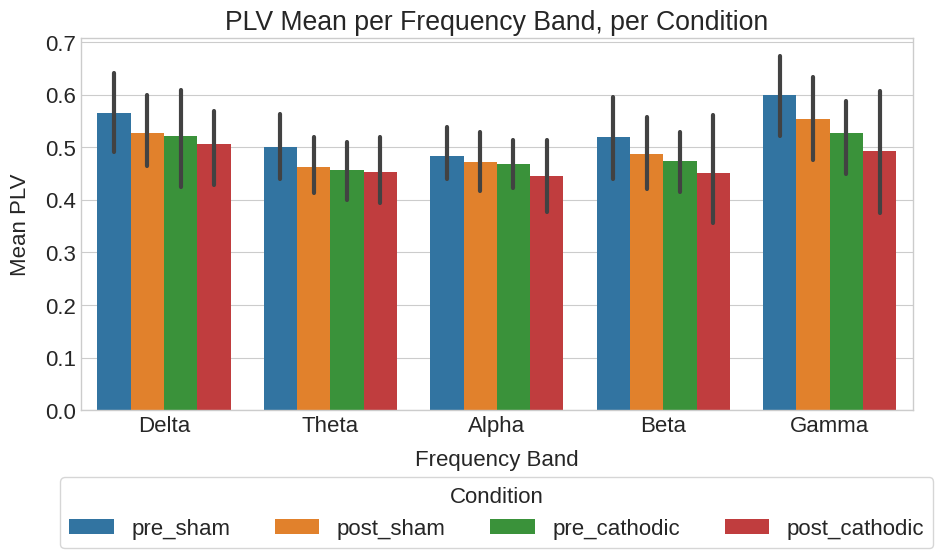

In [ ]:
# Melt the DataFrame for seaborn
df_melt = df.reset_index().melt(id_vars=['Atleta', 'Condição'], var_name='Frequency Band', value_name='Mean PLV')


# Plot
# plt.figure(figsize=(14, 8))
sns.barplot(data=df_melt, x='Frequency Band', y='Mean PLV', hue='Condição'n)
plt.title('PLV Mean per Frequency Band, per Condition')
plt.xlabel('Frequency Band')
plt.ylabel('Mean PLV')
plt.legend(title='Condition', loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=4, frameon=True)
plt.tight_layout()
plt.show()

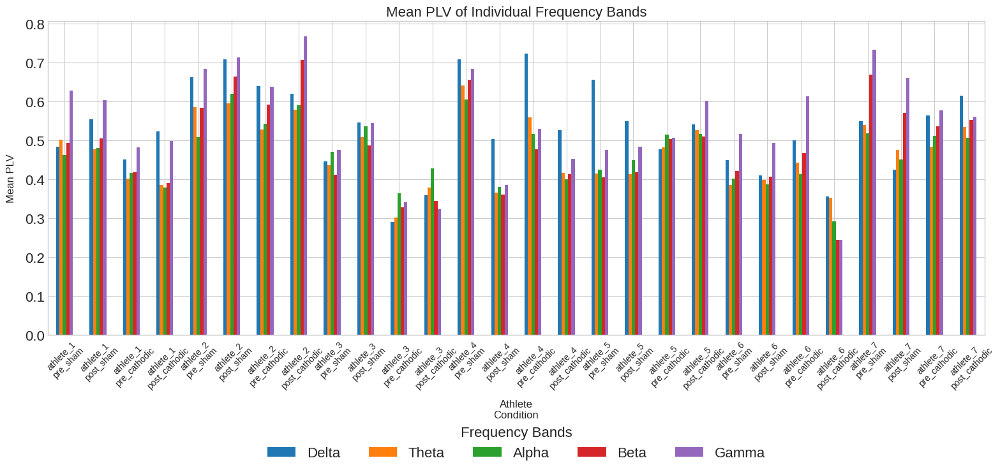

In [ ]:
# Increase the figsize to make the plot larger
fig, ax = plt.subplots(figsize=(16, 8))
df.plot.bar(rot=0, ax=ax)
plt.xlabel('Athlete\nCondition', fontsize=12)
plt.ylabel('Mean PLV', fontsize=12)
plt.title('Mean PLV of Individual Frequency Bands', fontsize=16)

# Move the legend box below the x-axis label
plt.legend(title='Frequency Bands', bbox_to_anchor=(0.5, -0.25), loc='upper center', ncol=5)

# Rotate the x-axis ticks by 45 degrees for better visibility
plt.xticks(np.arange(len(df)), [f'{athlete}\n{condition}' for athlete, condition in df.index], rotation=45, fontsize=10)
plt.tight_layout()  # Ensure that all elements fit well within the plot

# Display the plot
plt.show()

# Save the plot as a PNG file
filename = "PLV_Mean_Frequency_Bands.png"
fig.savefig(filename, bbox_inches='tight')

# Close the figure
plt.close(fig)

In [ ]:
# Generate a list of the data displayed in the plot with athlete and condition information
data_list = []

for athlete, condition in df.index:
    data_values = df.loc[(athlete, condition)].values.tolist()
    data_entry = [athlete, condition] + data_values
    data_list.append(data_entry)

# Print the list
for entry in data_list:
    print(entry)

['athlete_1', 'pre_sham', 0.4831544609853658, 0.5010105875299053, 0.4621913834772087, 0.4931837958145768, 0.6279044825260213]
['athlete_1', 'post_sham', 0.5541888844961645, 0.4762391865194779, 0.4794546180305205, 0.504230295153959, 0.6033497536481155]
['athlete_1', 'pre_cathodic', 0.451011526201994, 0.4015340866982199, 0.4162639251443034, 0.4182018233658298, 0.4809542184498747]
['athlete_1', 'post_cathodic', 0.5226616371480529, 0.3849394404405723, 0.3779021550997966, 0.3904216360631904, 0.497680817337594]
['athlete_2', 'pre_sham', 0.6617232108383437, 0.5849546595675544, 0.507394604362762, 0.582674770450107, 0.6823761259840939]
['athlete_2', 'post_sham', 0.707188740687132, 0.5952182868733554, 0.6194810849511522, 0.6627389774119022, 0.7134021020557904]
['athlete_2', 'pre_cathodic', 0.6387802014464866, 0.5276453490807308, 0.5415091198594622, 0.5906378538421975, 0.6378354370270163]
['athlete_2', 'post_cathodic', 0.61928827794533, 0.5790604718703812, 0.5897311193241241, 0.7060341226385621, 

In [ ]:
plvs_data = []
for athlete in athletes:
    for condition in conditions:
        df_temp = data[athlete][condition]['list_of_plvs_per_pair'].copy()
        df_temp['plvs_per_channel_pair'] = df_temp['plvs_per_channel_pair'].apply(lambda x: float(x.split(':')[-1].strip()))
        df_temp['Atleta'] = athlete
        df_temp['Condição'] = condition  # Update the condition name
        plvs_data.append(df_temp)

plvs_df = pd.concat(plvs_data)
table_string = plvs_df[0:5].to_string(index=False, justify='left', float_format='{:.3f}'.format)

# Print the table string
print(table_string)

 Unnamed: 0  plvs_per_channel_pair Atleta    Condição
0           0.979                  athlete_1 pre_sham
1           0.974                  athlete_1 pre_sham
2           0.963                  athlete_1 pre_sham
3           0.938                  athlete_1 pre_sham
4           0.934                  athlete_1 pre_sham


Dados originais para athlete_1, pre_sham:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.142513  0.005706  0.003971  0.001557
Theta  0.142513  0.000000  0.212852  0.001614  0.001574
Alpha  0.005706  0.212852  0.000000  0.244869  0.002762
Beta   0.003971  0.001614  0.244869  0.000000  0.159799
Gamma  0.001557  0.001574  0.002762  0.159799  0.000000


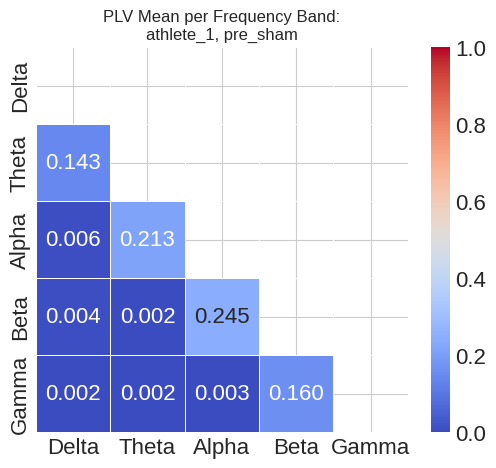

Dados originais para athlete_1, post_sham:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.156675  0.004353  0.002232  0.001073
Theta  0.156675  0.000000  0.211630  0.002400  0.000315
Alpha  0.004353  0.211630  0.000000  0.249775  0.002313
Beta   0.002232  0.002400  0.249775  0.000000  0.155969
Gamma  0.001073  0.000315  0.002313  0.155969  0.000000


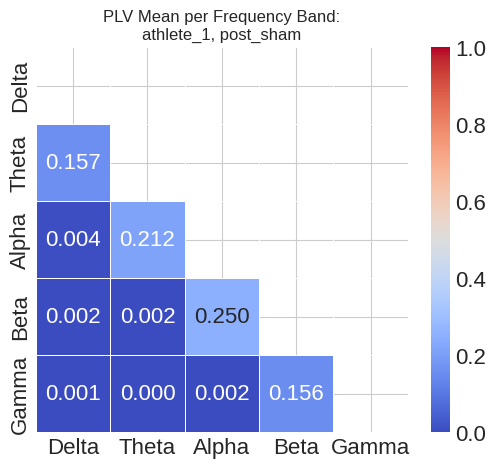

Dados originais para athlete_1, pre_cathodic:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.147733  0.004676  0.002482  0.001493
Theta  0.147733  0.000000  0.233675  0.001287  0.002010
Alpha  0.004676  0.233675  0.000000  0.248872  0.002149
Beta   0.002482  0.001287  0.248872  0.000000  0.164553
Gamma  0.001493  0.002010  0.002149  0.164553  0.000000


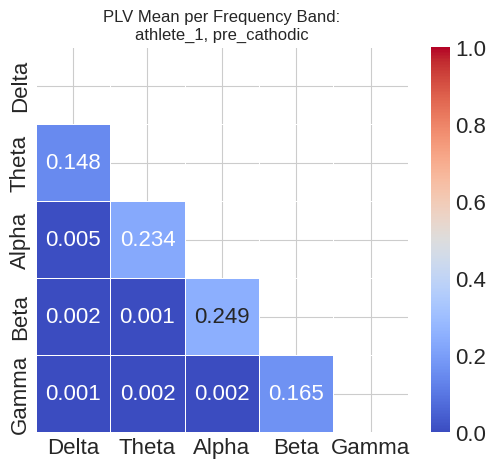

Dados originais para athlete_1, post_cathodic:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.114419  0.007087  0.002326  0.001727
Theta  0.114419  0.000000  0.231732  0.002764  0.001059
Alpha  0.007087  0.231732  0.000000  0.239223  0.002727
Beta   0.002326  0.002764  0.239223  0.000000  0.162068
Gamma  0.001727  0.001059  0.002727  0.162068  0.000000


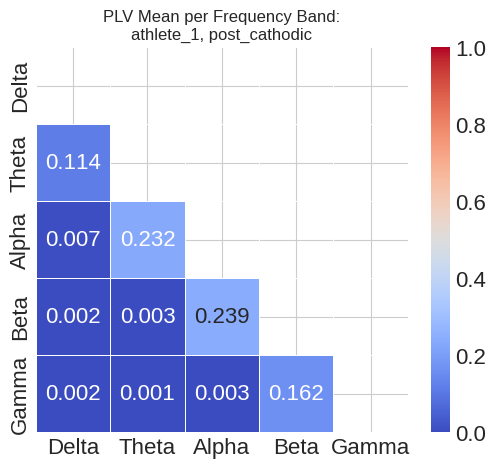

Dados originais para athlete_2, pre_sham:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.108421  0.007906  0.004915  0.001673
Theta  0.108421  0.000000  0.209866  0.003827  0.001512
Alpha  0.007906  0.209866  0.000000  0.246917  0.000791
Beta   0.004915  0.003827  0.246917  0.000000  0.190466
Gamma  0.001673  0.001512  0.000791  0.190466  0.000000


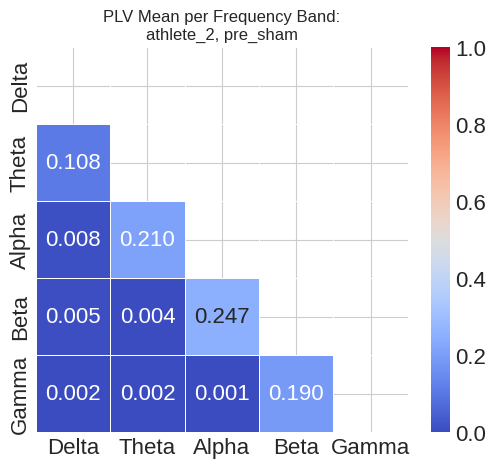

Dados originais para athlete_2, post_sham:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.105429  0.007261  0.002627  0.000680
Theta  0.105429  0.000000  0.227438  0.004786  0.000907
Alpha  0.007261  0.227438  0.000000  0.220503  0.002301
Beta   0.002627  0.004786  0.220503  0.000000  0.195965
Gamma  0.000680  0.000907  0.002301  0.195965  0.000000


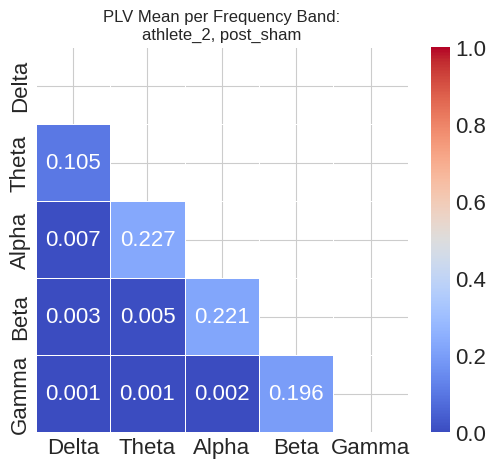

Dados originais para athlete_2, pre_cathodic:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.157021  0.007929  0.003840  0.001452
Theta  0.157021  0.000000  0.237152  0.002425  0.001115
Alpha  0.007929  0.237152  0.000000  0.200816  0.001014
Beta   0.003840  0.002425  0.200816  0.000000  0.199856
Gamma  0.001452  0.001115  0.001014  0.199856  0.000000


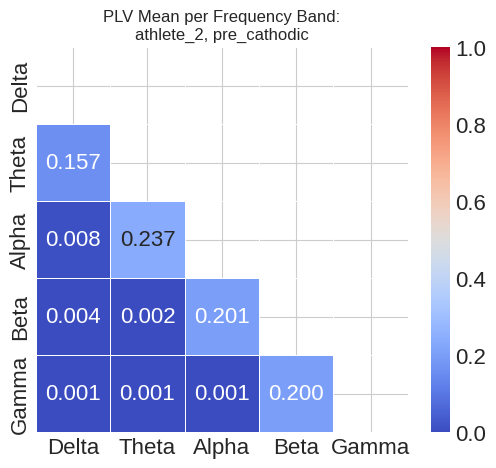

Dados originais para athlete_2, post_cathodic:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.177861  0.005349  0.003364  0.000941
Theta  0.177861  0.000000  0.234006  0.002006  0.000463
Alpha  0.005349  0.234006  0.000000  0.195772  0.002634
Beta   0.003364  0.002006  0.195772  0.000000  0.194103
Gamma  0.000941  0.000463  0.002634  0.194103  0.000000


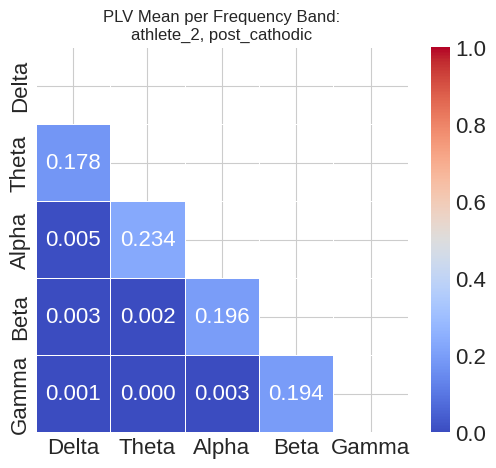

Dados originais para athlete_3, pre_sham:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.166095  0.002934  0.002833  0.001750
Theta  0.166095  0.000000  0.318069  0.006857  0.001921
Alpha  0.002934  0.318069  0.000000  0.202746  0.000568
Beta   0.002833  0.006857  0.202746  0.000000  0.162573
Gamma  0.001750  0.001921  0.000568  0.162573  0.000000


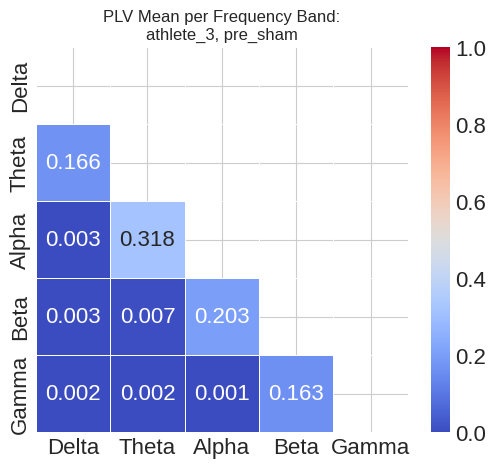

Dados originais para athlete_3, post_sham:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.172574  0.003660  0.002255  0.002813
Theta  0.172574  0.000000  0.332742  0.006654  0.002237
Alpha  0.003660  0.332742  0.000000  0.194231  0.001414
Beta   0.002255  0.006654  0.194231  0.000000  0.178848
Gamma  0.002813  0.002237  0.001414  0.178848  0.000000


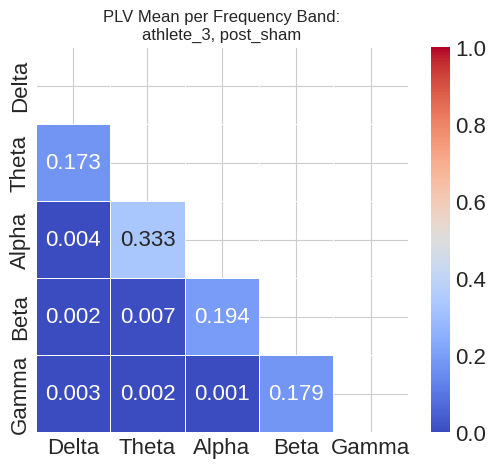

Dados originais para athlete_3, pre_cathodic:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.180916  0.008008  0.005692  0.002570
Theta  0.180916  0.000000  0.221375  0.005224  0.001759
Alpha  0.008008  0.221375  0.000000  0.231644  0.000971
Beta   0.005692  0.005224  0.231644  0.000000  0.166723
Gamma  0.002570  0.001759  0.000971  0.166723  0.000000


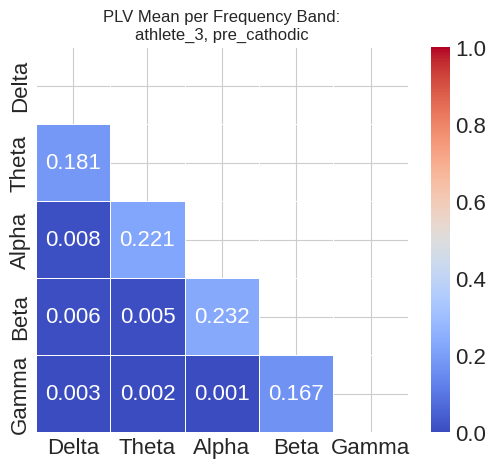

Dados originais para athlete_3, post_cathodic:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.179370  0.004603  0.003485  0.001740
Theta  0.179370  0.000000  0.288516  0.005475  0.001212
Alpha  0.004603  0.288516  0.000000  0.206638  0.001175
Beta   0.003485  0.005475  0.206638  0.000000  0.161601
Gamma  0.001740  0.001212  0.001175  0.161601  0.000000


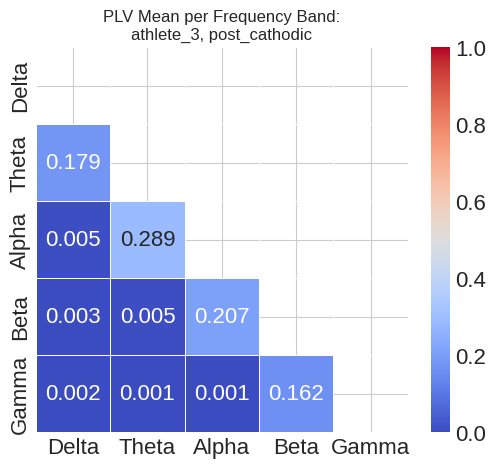

Dados originais para athlete_4, pre_sham:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.168688  0.005819  0.001383  0.002086
Theta  0.168688  0.000000  0.219370  0.002823  0.000895
Alpha  0.005819  0.219370  0.000000  0.217325  0.001853
Beta   0.001383  0.002823  0.217325  0.000000  0.199110
Gamma  0.002086  0.000895  0.001853  0.199110  0.000000


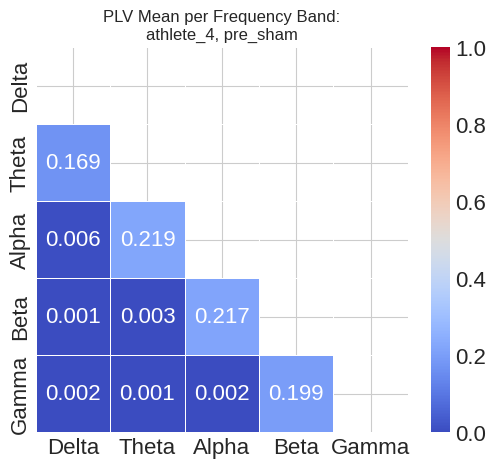

Dados originais para athlete_4, post_sham:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.183646  0.004067  0.002495  0.002251
Theta  0.183646  0.000000  0.232083  0.003265  0.002104
Alpha  0.004067  0.232083  0.000000  0.248566  0.001950
Beta   0.002495  0.003265  0.248566  0.000000  0.180335
Gamma  0.002251  0.002104  0.001950  0.180335  0.000000


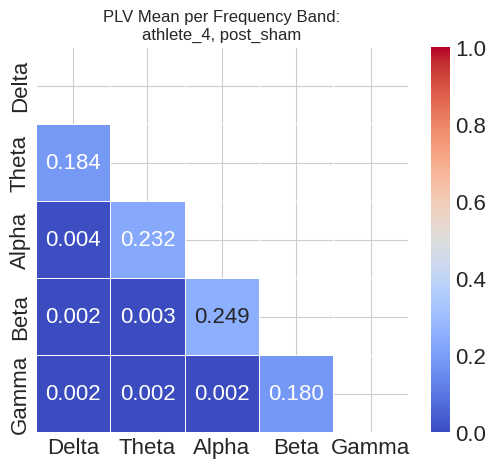

Dados originais para athlete_4, pre_cathodic:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.150201  0.003551  0.002925  0.002653
Theta  0.150201  0.000000  0.226683  0.003293  0.002818
Alpha  0.003551  0.226683  0.000000  0.241011  0.002869
Beta   0.002925  0.003293  0.241011  0.000000  0.181937
Gamma  0.002653  0.002818  0.002869  0.181937  0.000000


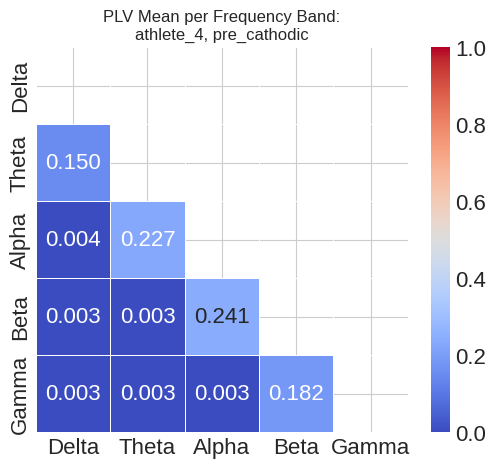

Dados originais para athlete_4, post_cathodic:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.171655  0.002138  0.003446  0.001488
Theta  0.171655  0.000000  0.261262  0.002464  0.001416
Alpha  0.002138  0.261262  0.000000  0.231270  0.001187
Beta   0.003446  0.002464  0.231270  0.000000  0.180870
Gamma  0.001488  0.001416  0.001187  0.180870  0.000000


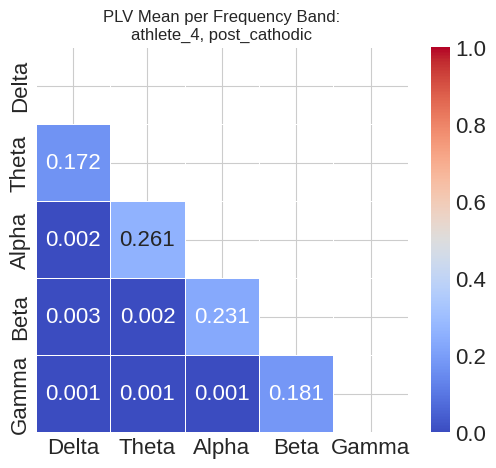

Dados originais para athlete_5, pre_sham:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.102148  0.006885  0.005166  0.002328
Theta  0.102148  0.000000  0.291677  0.007056  0.001303
Alpha  0.006885  0.291677  0.000000  0.167397  0.001850
Beta   0.005166  0.007056  0.167397  0.000000  0.174189
Gamma  0.002328  0.001303  0.001850  0.174189  0.000000


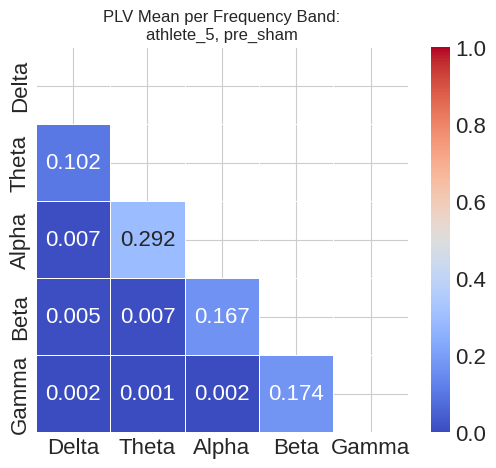

Dados originais para athlete_5, post_sham:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.139877  0.002581  0.002954  0.001728
Theta  0.139877  0.000000  0.336347  0.005838  0.002053
Alpha  0.002581  0.336347  0.000000  0.154157  0.002393
Beta   0.002954  0.005838  0.154157  0.000000  0.174240
Gamma  0.001728  0.002053  0.002393  0.174240  0.000000


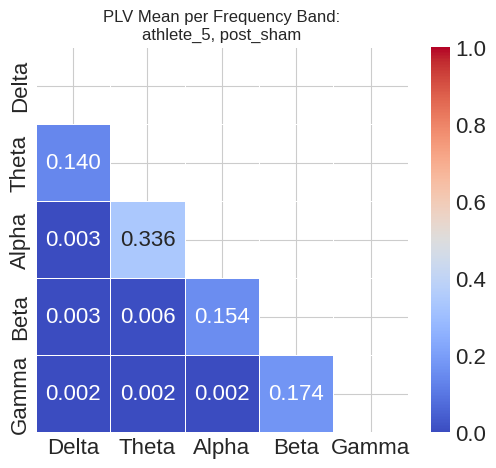

Dados originais para athlete_5, pre_cathodic:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.093007  0.003830  0.003603  0.000852
Theta  0.093007  0.000000  0.295639  0.002580  0.001319
Alpha  0.003830  0.295639  0.000000  0.201428  0.002146
Beta   0.003603  0.002580  0.201428  0.000000  0.147686
Gamma  0.000852  0.001319  0.002146  0.147686  0.000000


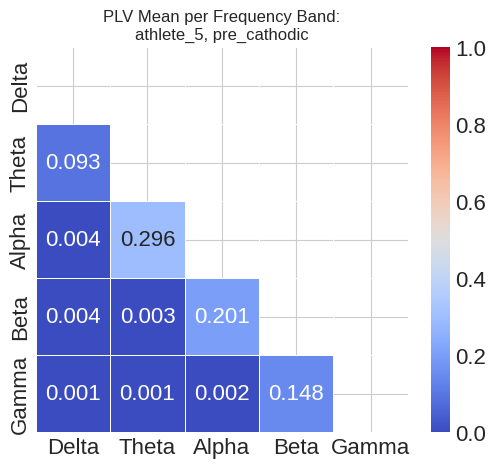

Dados originais para athlete_5, post_cathodic:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.066921  0.007109  0.004778  0.001487
Theta  0.066921  0.000000  0.342104  0.005035  0.001710
Alpha  0.007109  0.342104  0.000000  0.151211  0.001678
Beta   0.004778  0.005035  0.151211  0.000000  0.175480
Gamma  0.001487  0.001710  0.001678  0.175480  0.000000


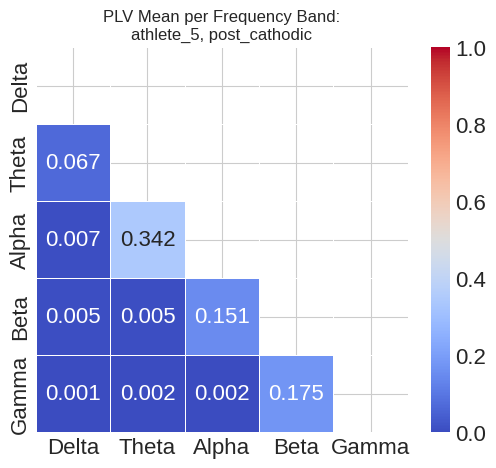

Dados originais para athlete_6, pre_sham:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.194057  0.005238  0.003780  0.000727
Theta  0.194057  0.000000  0.190895  0.000632  0.001213
Alpha  0.005238  0.190895  0.000000  0.331888  0.002800
Beta   0.003780  0.000632  0.331888  0.000000  0.177450
Gamma  0.000727  0.001213  0.002800  0.177450  0.000000


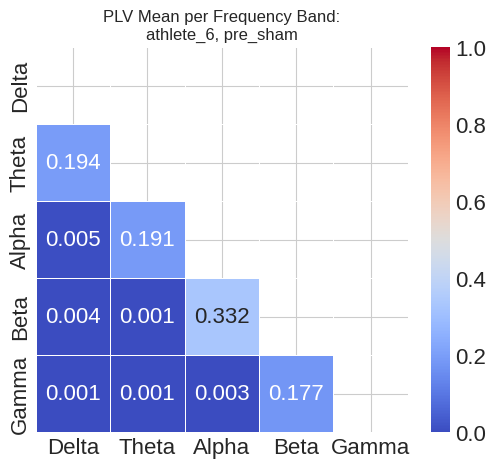

Dados originais para athlete_6, post_sham:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.216398  0.002161  0.002335  0.001563
Theta  0.216398  0.000000  0.204205  0.001193  0.001659
Alpha  0.002161  0.204205  0.000000  0.335129  0.002500
Beta   0.002335  0.001193  0.335129  0.000000  0.188251
Gamma  0.001563  0.001659  0.002500  0.188251  0.000000


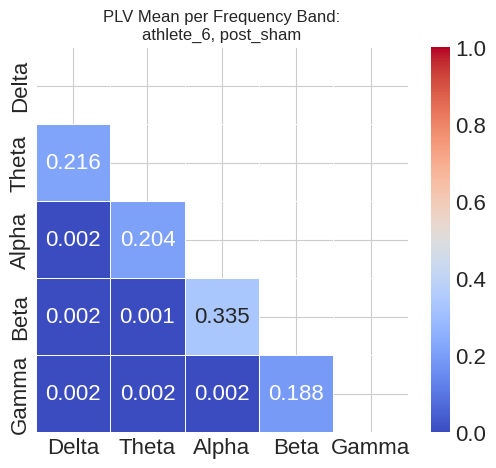

Dados originais para athlete_6, pre_cathodic:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.213892  0.002431  0.001992  0.001859
Theta  0.213892  0.000000  0.186789  0.000845  0.001700
Alpha  0.002431  0.186789  0.000000  0.349727  0.002605
Beta   0.001992  0.000845  0.349727  0.000000  0.165993
Gamma  0.001859  0.001700  0.002605  0.165993  0.000000


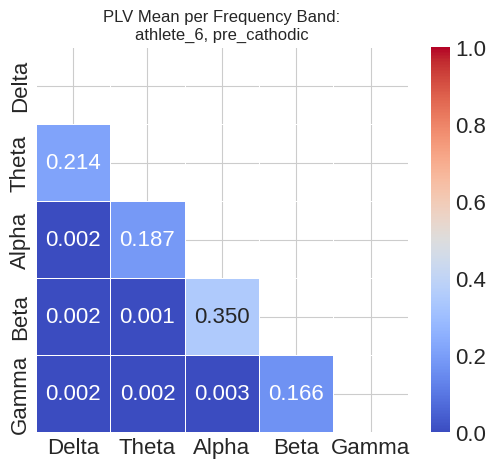

Dados originais para athlete_6, post_cathodic:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.113495  0.001175  0.003371  0.003013
Theta  0.113495  0.000000  0.127212  0.002035  0.001340
Alpha  0.001175  0.127212  0.000000  0.275582  0.002297
Beta   0.003371  0.002035  0.275582  0.000000  0.164594
Gamma  0.003013  0.001340  0.002297  0.164594  0.000000


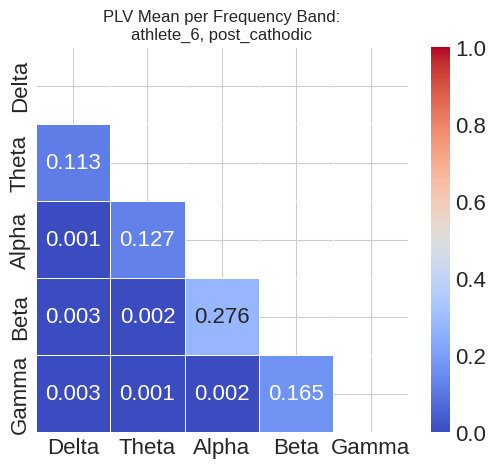

Dados originais para athlete_7, pre_sham:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.116440  0.005591  0.001456  0.001288
Theta  0.116440  0.000000  0.235695  0.003939  0.000694
Alpha  0.005591  0.235695  0.000000  0.206162  0.001984
Beta   0.001456  0.003939  0.206162  0.000000  0.239201
Gamma  0.001288  0.000694  0.001984  0.239201  0.000000


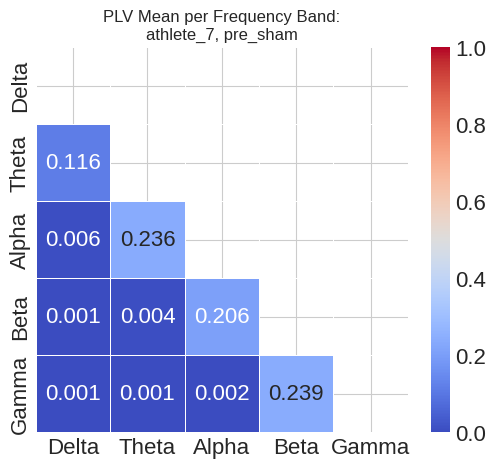

Dados originais para athlete_7, post_sham:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.127245  0.006067  0.002447  0.000921
Theta  0.127245  0.000000  0.260426  0.002072  0.000452
Alpha  0.006067  0.260426  0.000000  0.191558  0.000996
Beta   0.002447  0.002072  0.191558  0.000000  0.219380
Gamma  0.000921  0.000452  0.000996  0.219380  0.000000


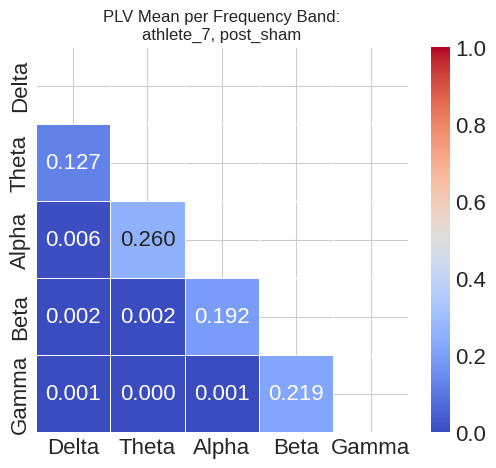

Dados originais para athlete_7, pre_cathodic:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.152150  0.003704  0.002919  0.001821
Theta  0.152150  0.000000  0.283052  0.003227  0.001664
Alpha  0.003704  0.283052  0.000000  0.218564  0.001285
Beta   0.002919  0.003227  0.218564  0.000000  0.187850
Gamma  0.001821  0.001664  0.001285  0.187850  0.000000


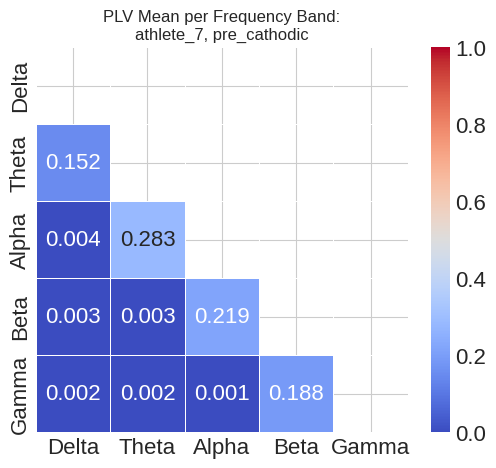

Dados originais para athlete_7, post_cathodic:
          Delta     Theta     Alpha      Beta     Gamma
Delta  0.000000  0.158659  0.003882  0.003163  0.000939
Theta  0.158659  0.000000  0.285962  0.003373  0.001006
Alpha  0.003882  0.285962  0.000000  0.206155  0.002228
Beta   0.003163  0.003373  0.206155  0.000000  0.187041
Gamma  0.000939  0.001006  0.002228  0.187041  0.000000


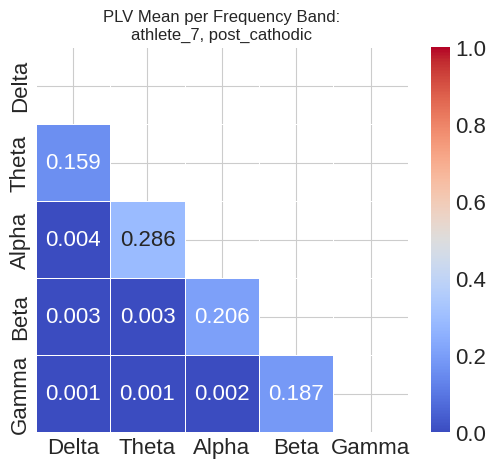

['athlete_1', 'pre_sham', 0.0, 0.1425132103915183, 0.0057057428101139, 0.0039711045869417, 0.0015573070306885, 0.1425132103915183, 0.0, 0.2128520070348898, 0.0016142603949675, 0.001573570659312, 0.0057057428101139, 0.2128520070348898, 0.0, 0.2448690996016414, 0.0027620525490102, 0.0039711045869417, 0.0016142603949675, 0.2448690996016414, 0.0, 0.1597989285864504, 0.0015573070306885, 0.001573570659312, 0.0027620525490102, 0.1597989285864504, 0.0]
['athlete_1', 'post_sham', 0.0, 0.1566746357772614, 0.0043530823366819, 0.0022320558347843, 0.0010733085149169, 0.1566746357772614, 0.0, 0.2116295909420566, 0.0023999751925588, 0.0003149375766289, 0.0043530823366819, 0.2116295909420566, 0.0, 0.2497745645822029, 0.0023126722328557, 0.0022320558347843, 0.0023999751925588, 0.2497745645822029, 0.0, 0.1559693614177967, 0.0010733085149169, 0.0003149375766289, 0.0023126722328557, 0.1559693614177967, 0.0]
['athlete_1', 'pre_cathodic', 0.0, 0.1477331279375835, 0.0046758274888288, 0.0024816483677915, 0.00

In [ ]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

data_list = []

def plot_heatmap(data, athlete, condition, title):
    data.index = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']
    data.columns = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']
    mask = np.triu(np.ones_like(data, dtype=bool))  # Create a mask to hide the upper triangular part
    plt.figure(figsize=(6, 5))
    sns.heatmap(data, annot=True, cmap="coolwarm", linewidths=0.5, fmt=".3f", cbar=True, mask=mask, vmin=0, vmax=1)
    plt.title(title, fontsize=12)
    plt.xticks(np.arange(len(data.columns))+0.5, data.columns, ha='center')
    plt.yticks(np.arange(len(data.index))+0.5, data.index, va='center')
    plt.gca().set_facecolor('white')  # Set the background color of the diagonal to white

    # Print original data to verify
    print(f"Dados originais para {athlete}, {condition}:")
    print(data)

    # Display the plot
    plt.show()

    # Save the plot as a PNG file
    filename = f"PLV_Matrix_{athlete}_{condition}.png"
    plt.savefig(filename, bbox_inches='tight')
    plt.close()  # Close the plot to free up memory

    # Append the data to the list
    data_entry = [athlete, condition] + data.values.flatten().tolist()
    data_list.append(data_entry)

# Create heatmaps and generate the list
for athlete in athletes:
    for condition in conditions:
        plv_matrix = data[athlete][condition]['plv_matrix_frequency_band']
        plot_heatmap(plv_matrix, athlete, condition, f'PLV Mean per Frequency Band:\n{athlete}, {condition}')

# Print the list
for entry in data_list:
    print(entry)

In [ ]:
import pandas as pd

# Bandas de frequência
bandas = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']

# Gerar pares de bandas de frequência
pares_bandas = [(bandas[i], bandas[j]) for i in range(len(bandas)) for j in range(i, len(bandas))]

# Preparar dados para o DataFrame
dados_df = []

# Iterar sobre cada entrada na data_list
for entrada in data_list:
    atleta, condicao = entrada[0], entrada[1]
    valores_plv = entrada[2:]

    # Adicionar dados para cada par de bandas de frequência
    for par, valor_plv in zip(pares_bandas, valores_plv):
        dados_df.append([par[0], par[1], valor_plv, atleta, condicao])

# Criar o DataFrame
df_plv = pd.DataFrame(dados_df, columns=['Banda de Frequência 1', 'Banda de Frequência 2', 'Média do PLV', 'Atleta', 'Condição'])
df_plv.to_csv('mean_plv_per_frequency_band_pair.csv')

# Exibir o DataFrame
df_plv

,Banda de Frequência 1,Banda de Frequência 2,Média do PLV,Atleta,Condição
0,Delta,Delta,0.000000,athlete_1,pre_sham
1,Delta,Theta,0.142513,athlete_1,pre_sham
2,Delta,Alpha,0.005706,athlete_1,pre_sham
3,Delta,Beta,0.003971,athlete_1,pre_sham
4,Delta,Gamma,0.001557,athlete_1,pre_sham
...,...,...,...,...,...
415,Alpha,Beta,0.003882,athlete_7,post_cathodic
416,Alpha,Gamma,0.285962,athlete_7,post_cathodic
417,Beta,Beta,0.000000,athlete_7,post_cathodic
418,Beta,Gamma,0.206155,athlete_7,post_cathodic


In [ ]:
new_df_plv = df_plv.copy()
# Substitua espaços em nomes de colunas por underscores para evitar problemas de sintaxe
new_df_plv.columns = new_df_plv.columns.str.replace(' ', '_')

In [ ]:
# Certifique-se de que a coluna 'Média do PLV' é numérica
new_df_plv['Média_do_PLV'] = pd.to_numeric(new_df_plv['Média_do_PLV'], errors='coerce')

# Criando a coluna 'Par_de_Banda_de_Frequência'
new_df_plv['Par_de_Banda_de_Frequência'] = new_df_plv['Banda_de_Frequência_1'] + '_' + new_df_plv['Banda_de_Frequência_2']

# Separar dados por condição
pre_catodica = new_df_plv[new_df_plv['Condição'] == 'pre_cathodic'].set_index(['Atleta', 'Par_de_Banda_de_Frequência'])
pos_catodica = new_df_plv[new_df_plv['Condição'] == 'post_cathodic'].set_index(['Atleta', 'Par_de_Banda_de_Frequência'])

pre_sham = new_df_plv[new_df_plv['Condição'] == 'pre_sham'].set_index(['Atleta', 'Par_de_Banda_de_Frequência'])
pos_sham = new_df_plv[new_df_plv['Condição'] == 'post_sham'].set_index(['Atleta', 'Par_de_Banda_de_Frequência'])

# Cálculo das diferenças
df_differences = pd.DataFrame({
    'Atleta': pos_catodica.index.get_level_values('Atleta').tolist() + pos_sham.index.get_level_values('Atleta').tolist(),
    'Par_de_Banda_de_Frequência': pos_catodica.index.get_level_values('Par_de_Banda_de_Frequência').tolist() + pos_sham.index.get_level_values('Par_de_Banda_de_Frequência').tolist(),
    'PLV_Difference': (pos_catodica['Média_do_PLV'] - pre_catodica['Média_do_PLV']).tolist() + (pos_sham['Média_do_PLV'] - pre_sham['Média_do_PLV']).tolist(),
    'Condition': ['cathodic'] * len(pos_catodica) + ['sham'] * len(pos_sham)
}).reset_index(drop=True)

# Lidando com possíveis NaNs
df_differences.dropna(subset=['PLV_Difference'], inplace=True)

# Exibir o DataFrame final
df_differences

,Atleta,Par_de_Banda_de_Frequência,PLV_Difference,Condition
0,athlete_1,Delta_Delta,0.000000,cathodic
1,athlete_1,Delta_Theta,-0.033315,cathodic
2,athlete_1,Delta_Alpha,0.002412,cathodic
3,athlete_1,Delta_Beta,-0.000156,cathodic
4,athlete_1,Delta_Gamma,0.000234,cathodic
...,...,...,...,...
205,athlete_7,Alpha_Beta,0.000476,sham
206,athlete_7,Alpha_Gamma,0.024731,sham
207,athlete_7,Beta_Beta,0.000000,sham
208,athlete_7,Beta_Gamma,-0.014604,sham


In [ ]:
def determine_session(row):
    athlete_sessions = {
        'athlete_1': {'sham': 'S1', 'cathodic': 'S2'}, # simone
        'athlete_7': {'cathodic': 'S1', 'sham': 'S2'}, # jaqueline
        'athlete_4': {'cathodic': 'S1', 'sham': 'S2'}, # maira
        'athlete_3': {'sham': 'S1', 'cathodic': 'S2'}, # marilia
        'athlete_6': {'sham': 'S1', 'cathodic': 'S4'}, # ornela
        'athlete_2': {'sham': 'S1', 'cathodic': 'S2'}, # ariadna
        'athlete_5': {'cathodic': 'S1', 'sham': 'S2'} # leticia
    }

    # Acessa o dicionário usando o nome do atleta e a condição
    return athlete_sessions[row['Atleta']][row['Condition']]

df_differences['Session'] = df_differences.apply(determine_session, axis=1)

In [ ]:
df_differences_without_ornela = df_differences[df_differences['Atleta'] != 'ornela']
new_df_plv_without_ornela = new_df_plv[new_df_plv['Atleta'] != 'ornela']

In [ ]:
# Modify the 'plvs_per_channel_pair' column to separate channel names and PLV values
def split_channel_pair(x):
    channel_pair, plv = x.split(':')
    channel_1, channel_2 = channel_pair.strip().split(' - ')
    return pd.Series([channel_1, channel_2, float(plv.strip())])

plvs_data_processed = []
for athlete in athletes:
    for condition in conditions:
        df_temp = data[athlete][condition]['list_of_plvs_per_pair'].copy()
        df_temp[['Channel_1', 'Channel_2', 'PLV']] = df_temp['plvs_per_channel_pair'].apply(split_channel_pair)
        df_temp['Athlete'] = athlete
        df_temp['Condition'] = condition
        plvs_data_processed.append(df_temp)

plvs_processed_df = pd.concat(plvs_data_processed)

In [ ]:
table_string = plvs_processed_df[0:5].to_string(index=False)

# Print the table string
print(table_string)

 Unnamed: 0 plvs_per_channel_pair Channel_1 Channel_2   PLV   Athlete Condition
          0      P4 - TP10: 0.979        P4      TP10 0.979 athlete_1  pre_sham
          1       TP9 - C5: 0.974       TP9        C5 0.974 athlete_1  pre_sham
          2    CP4 - TTP8h: 0.963       CP4     TTP8h 0.963 athlete_1  pre_sham
          3      PO7 - PO3: 0.938       PO7       PO3 0.938 athlete_1  pre_sham
          4       Fp1 - F6: 0.934       Fp1        F6 0.934 athlete_1  pre_sham


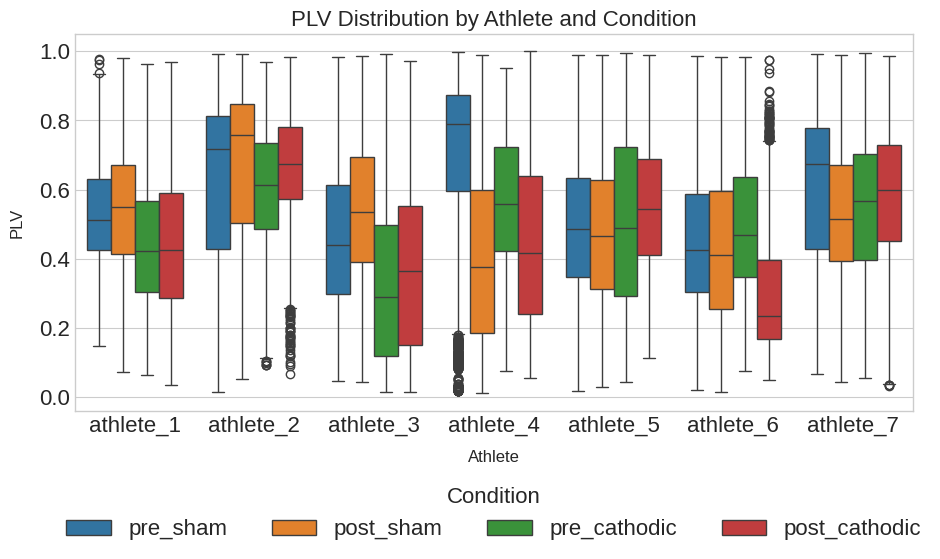

<Figure size 1000x600 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the desired order for the 'Condition' category
condition_order = ['pre_sham', 'post_sham', 'pre_cathodic', 'post_cathodic']
sns.boxplot(x='Athlete', y='PLV', hue='Condition', data=plvs_processed_df, hue_order=condition_order)
plt.title('PLV Distribution by Athlete and Condition', fontsize=16)
plt.xlabel('Athlete', fontsize=12)
plt.ylabel('PLV', fontsize=12)

# Move the legend box to the bottom center and set it to horizontal orientation
plt.legend(title='Condition', bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=4)

plt.tight_layout()  # Ensure that all elements fit well within the plot

# Display the plot
plt.show()

# Save the plot as a PNG file
filename = "PLV_Distribution_By_Athlete_And_Condition.png"
plt.savefig(filename, bbox_inches='tight')

In [ ]:
boxplot_data = plvs_processed_df.groupby(['Athlete', 'Condition'])['PLV'].agg(['median', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]).reset_index()

# Print the boxplot data
print(boxplot_data)

      Athlete      Condition  median  <lambda_0>  <lambda_1>
0   athlete_1  post_cathodic  0.4250     0.28625     0.59100
1   athlete_1      post_sham  0.5490     0.41300     0.67175
2   athlete_1   pre_cathodic  0.4230     0.30300     0.56800
3   athlete_1       pre_sham  0.5135     0.42600     0.63000
4   athlete_2  post_cathodic  0.6750     0.57200     0.78200
5   athlete_2      post_sham  0.7590     0.50500     0.84900
6   athlete_2   pre_cathodic  0.6130     0.48500     0.73500
7   athlete_2       pre_sham  0.7180     0.42900     0.81400
8   athlete_3  post_cathodic  0.3650     0.15125     0.55175
9   athlete_3      post_sham  0.5360     0.39125     0.69400
10  athlete_3   pre_cathodic  0.2900     0.12000     0.49800
11  athlete_3       pre_sham  0.4400     0.29700     0.61375
12  athlete_4  post_cathodic  0.4175     0.24200     0.64000
13  athlete_4      post_sham  0.3770     0.18500     0.59900
14  athlete_4   pre_cathodic  0.5580     0.42300     0.72400
15  athlete_4       pre_

In [ ]:
mean_plvs_df = plvs_processed_df.groupby(['Athlete', 'Condition']).mean(numeric_only=True).reset_index()

condition_order = ['pre_sham', 'post_sham', 'pre_cathodic', 'post_cathodic']
mean_plvs_df['Condition'] = pd.Categorical(mean_plvs_df['Condition'], categories=condition_order, ordered=True)
plvs_processed_df['Condition'] = pd.Categorical(plvs_processed_df['Condition'], categories=condition_order, ordered=True)

In [ ]:
mean_plvs_df.drop('Unnamed: 0', axis=1).to_csv('mean_plv_per_condition_long.csv')
mean_plvs_df

,Athlete,Condition,Unnamed: 0,PLV
0,athlete_1,post_cathodic,914.5,0.441968
1,athlete_1,post_sham,914.5,0.532215
2,athlete_1,pre_cathodic,914.5,0.440815
3,athlete_1,pre_sham,914.5,0.522055
4,athlete_2,post_cathodic,914.5,0.663081
5,athlete_2,post_sham,914.5,0.670613
6,athlete_2,pre_cathodic,914.5,0.597067
7,athlete_2,pre_sham,914.5,0.613890
8,athlete_3,post_cathodic,914.5,0.372627
9,athlete_3,post_sham,914.5,0.532611


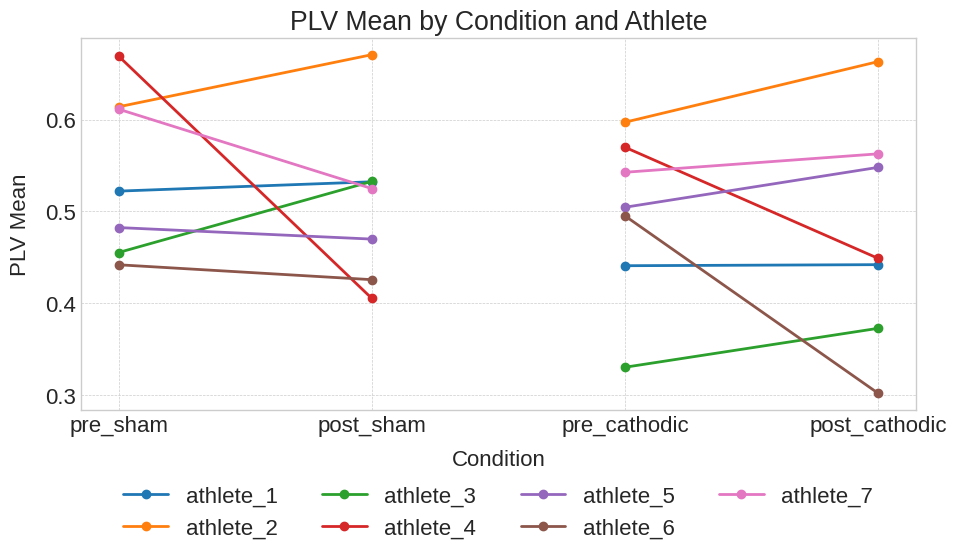

In [ ]:
# Preparing data for plotting
conditions = ["pre_sham", "post_sham", "pre_cathodic", "post_cathodic"]
athletes = {}

for athlete in mean_plvs_df['Athlete'].unique():
    athletes[athlete] = mean_plvs_df[mean_plvs_df['Athlete'] == athlete].sort_values(by='Condition')['PLV'].tolist()

# Plotting the data for each athlete
for athlete, values in athletes.items():
    color = next(plt.gca()._get_lines.prop_cycler)['color']  # Get the next color in the cycle
    plt.plot(conditions[:2], values[:2], marker='o', label=athlete, color=color)
    plt.plot(conditions[2:], values[2:], marker='o', label='_nolegend_', color=color)

plt.title("PLV Mean by Condition and Athlete")
plt.xlabel("Condition")
plt.ylabel("PLV Mean")
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=4)  # Adjusted placement
plt.tight_layout()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

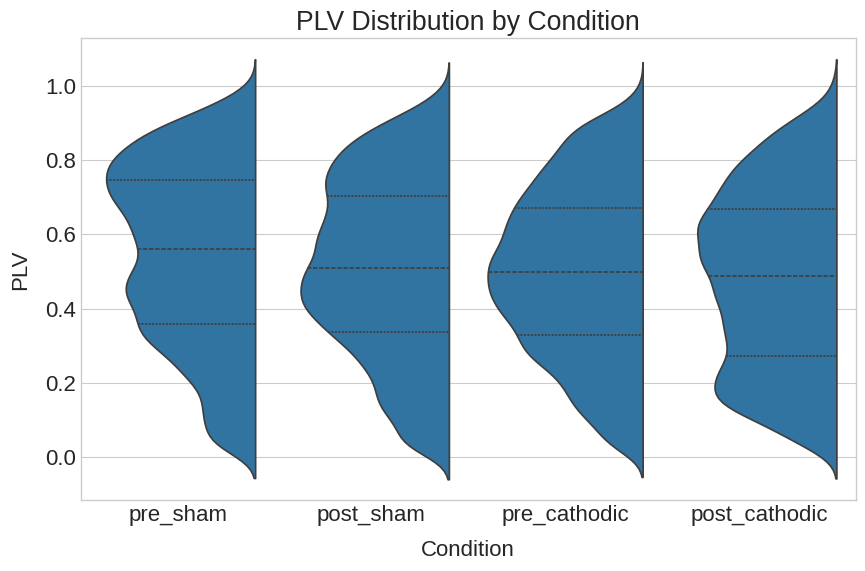

Median: 0.0344, Q1: -0.0112, Q3: 0.0800, IQR: 0.0912
Median: 0.0306, Q1: -0.0148, Q3: 0.0760, IQR: 0.0908
Median: 0.0364, Q1: -0.0088, Q3: 0.0815, IQR: 0.0903
Median: 0.0334, Q1: -0.0123, Q3: 0.0790, IQR: 0.0913


<Figure size 1000x600 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

ax = sns.violinplot(data=plvs_processed_df, x='Condition', y='PLV', split=True, inner='quartile', order=condition_order)

plt.title('PLV Distribution by Condition')
plt.xlabel('Condition')
plt.ylabel('PLV')

# Display the plot
plt.show()

# Save the plot as a PNG file
filename = "PLV_Distribution_By_Condition_Violin.png"
plt.savefig(filename, bbox_inches='tight')

# Get the violin plot statistics
violin_stats = []
for pc in ax.collections:
    # Get the positions of the quartiles and median
    positions = pc.get_paths()[0].vertices
    quartile1, median, quartile3 = positions[5], positions[9], positions[13]

    # Compute the interquartile range (IQR)
    iqr = quartile3[1] - quartile1[1]

    # Append the statistics to the list
    violin_stats.append(f"Median: {median[1]:.4f}, Q1: {quartile1[1]:.4f}, Q3: {quartile3[1]:.4f}, IQR: {iqr:.4f}")

# Print or store the violin plot statistics as a list
for stats in violin_stats:
    print(stats)

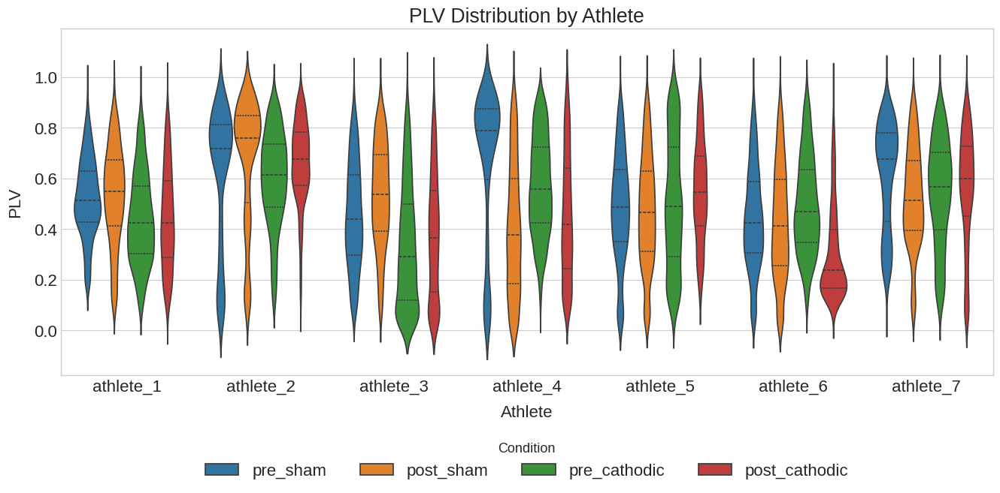

<Figure size 1000x600 with 0 Axes>

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(16, 6))
sns.violinplot(data=plvs_processed_df, x='Athlete', y='PLV', hue='Condition', inner='quartile')

plt.title('PLV Distribution by Athlete')
plt.xlabel('Athlete')
plt.ylabel('PLV')

# Adjusting the legend to be below the plot
plt.legend(title='Condition', title_fontsize='13', loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=4)
plt.show()

# Save the plot as a PNG file
filename = "PLV_Distribution_By_Athlete_Violin.png"
plt.savefig(filename, bbox_inches='tight')

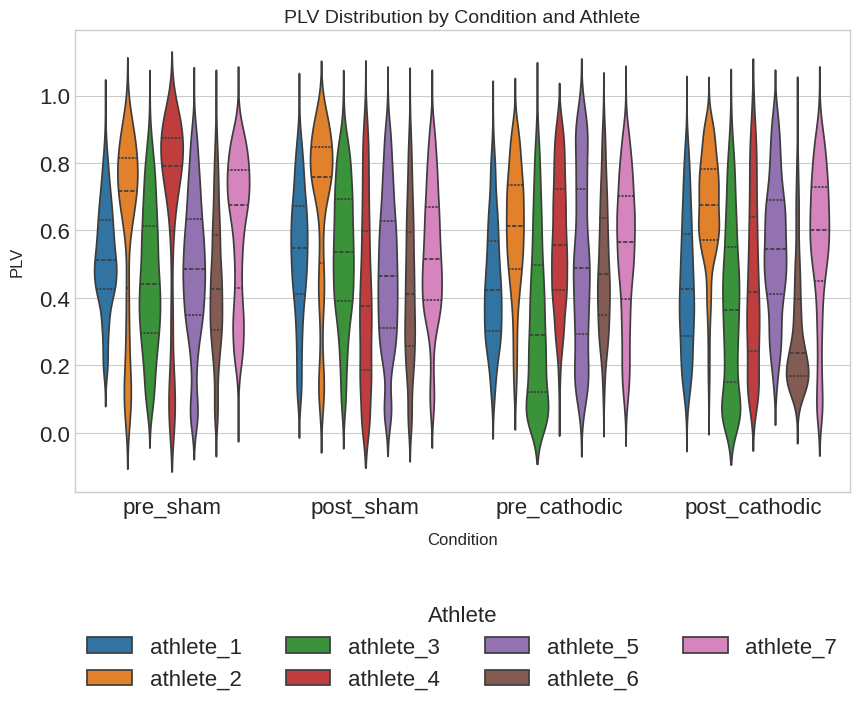

In [ ]:
# Create the violin plot
ax = sns.violinplot(data=plvs_processed_df, x='Condition', y='PLV', hue='Athlete', inner='quartile', order=condition_order)

# Set the title and labels with specific font sizes
plt.title('PLV Distribution by Condition and Athlete', fontsize=14)
plt.xlabel('Condition', fontsize=12)
plt.ylabel('PLV', fontsize=12)

# Move the legend below the plot
plt.legend(title='Athlete', loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=4)

In [ ]:
mean_plv_per_pair_across_conditions = plvs_processed_df.groupby(['Channel_1', 'Channel_2', 'Condition']).mean(numeric_only=True).reset_index()
mean_plv_per_pair_across_conditions['Channel_Pair'] = mean_plv_per_pair_across_conditions['Channel_1'] + ' - ' + mean_plv_per_pair_across_conditions['Channel_2']

# Add this line to create the 'Channel_Pair' column in 'plvs_processed_df'
plvs_processed_df['Channel_Pair'] = plvs_processed_df['Channel_1'] + ' - ' + plvs_processed_df['Channel_2']

In [ ]:
plvs_processed_df.drop(['Unnamed: 0', 'plvs_per_channel_pair'], axis=1).to_csv('mean_plv_per_channel_pair.csv')
plvs_processed_df

,Unnamed: 0,plvs_per_channel_pair,Channel_1,Channel_2,PLV,Athlete,Condition,Channel_Pair
0,0,P4 - TP10: 0.979,P4,TP10,0.979,athlete_1,pre_sham,P4 - TP10
1,1,TP9 - C5: 0.974,TP9,C5,0.974,athlete_1,pre_sham,TP9 - C5
2,2,CP4 - TTP8h: 0.963,CP4,TTP8h,0.963,athlete_1,pre_sham,CP4 - TTP8h
3,3,PO7 - PO3: 0.938,PO7,PO3,0.938,athlete_1,pre_sham,PO7 - PO3
4,4,Fp1 - F6: 0.934,Fp1,F6,0.934,athlete_1,pre_sham,Fp1 - F6
...,...,...,...,...,...,...,...,...
1825,1825,TPP8h - C6: 0.037,TPP8h,C6,0.037,athlete_7,post_cathodic,TPP8h - C6
1826,1826,Fz - C6: 0.036,Fz,C6,0.036,athlete_7,post_cathodic,Fz - C6
1827,1827,F5 - C6: 0.034,F5,C6,0.034,athlete_7,post_cathodic,F5 - C6
1828,1828,AF7 - C6: 0.034,AF7,C6,0.034,athlete_7,post_cathodic,AF7 - C6


In [ ]:
# Output the column's data types
print(plvs_processed_df.dtypes)

# Ensure 'PLV' column is from float type
plvs_processed_df['PLV'] = plvs_processed_df['PLV'].astype(float)

# Try again to process differences' calculation
mean_diff_pre_post = plvs_processed_df[plvs_processed_df['Condition'].isin(['pre_sham', 'post_sham', 'pre_cathodic', 'post_cathodic'])].groupby(['Athlete', 'Condition'])['PLV'].mean().unstack().reset_index()
mean_diff_pre_post['difference_sham'] = mean_diff_pre_post['post_sham'] - mean_diff_pre_post['pre_sham']
mean_diff_pre_post['difference_cathodic'] = mean_diff_pre_post['post_cathodic'] - mean_diff_pre_post['pre_cathodic']
mean_diff_pre_post.to_csv('mean_plv_per_condition.csv')
mean_diff_pre_post

Unnamed: 0                  int64
plvs_per_channel_pair      object
Channel_1                  object
Channel_2                  object
PLV                       float64
Athlete                    object
Condition                category
Channel_Pair               object
dtype: object


Condition,Athlete,pre_sham,post_sham,pre_cathodic,post_cathodic,difference_sham,difference_cathodic
0,athlete_1,0.522055,0.532215,0.440815,0.441968,0.010161,0.001154
1,athlete_2,0.613890,0.670613,0.597067,0.663081,0.056723,0.066015
2,athlete_3,0.455190,0.532611,0.330237,0.372627,0.077421,0.042390
3,athlete_4,0.669076,0.405286,0.569849,0.448838,-0.263790,-0.121011
4,athlete_5,0.482363,0.469813,0.504467,0.547912,-0.012551,0.043445
5,athlete_6,0.441843,0.425623,0.495148,0.301961,-0.016220,-0.193187
6,athlete_7,0.611303,0.524846,0.542568,0.562648,-0.086456,0.020080


In [ ]:
mean_diff_pre_post.columns = ['Athlete'] + [col[1] for col in mean_diff_pre_post.columns[1:5]] + ['difference_sham'] + ['difference_cathodic']
mean_diff_pre_post = mean_diff_pre_post.melt(id_vars='Athlete', value_vars=['difference_sham', 'difference_cathodic'], var_name='Condition', value_name='Difference')
mean_diff_pre_post

,Athlete,Condition,Difference
0,athlete_1,difference_sham,0.010161
1,athlete_2,difference_sham,0.056723
2,athlete_3,difference_sham,0.077421
3,athlete_4,difference_sham,-0.263790
4,athlete_5,difference_sham,-0.012551
5,athlete_6,difference_sham,-0.016220
6,athlete_7,difference_sham,-0.086456
7,athlete_1,difference_cathodic,0.001154
8,athlete_2,difference_cathodic,0.066015
9,athlete_3,difference_cathodic,0.042390


In [ ]:
print(mean_diff_pre_post.to_string(index=False))

  Athlete           Condition  Difference
athlete_1     difference_sham    0.010161
athlete_2     difference_sham    0.056723
athlete_3     difference_sham    0.077421
athlete_4     difference_sham   -0.263790
athlete_5     difference_sham   -0.012551
athlete_6     difference_sham   -0.016220
athlete_7     difference_sham   -0.086456
athlete_1 difference_cathodic    0.001154
athlete_2 difference_cathodic    0.066015
athlete_3 difference_cathodic    0.042390
athlete_4 difference_cathodic   -0.121011
athlete_5 difference_cathodic    0.043445
athlete_6 difference_cathodic   -0.193187
athlete_7 difference_cathodic    0.020080


<ipython-input-116-53343315e82d>:8: UserWarning: The palette list has more values (8) than needed (2), which may not be intended.
  barplot = sns.barplot(data=mean_diff_pre_post, x='Athlete', y='Difference', hue='Condition', palette=color_palette)


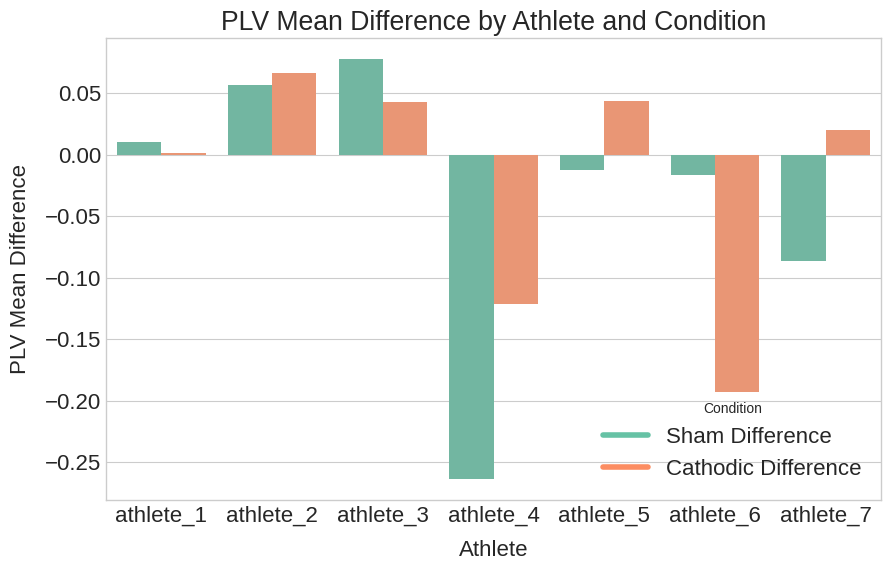

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Use a predefined Seaborn color palette or define a custom one
color_palette = sns.color_palette("Set2")  # You can choose other palettes like "Set1", "Paired", etc.

barplot = sns.barplot(data=mean_diff_pre_post, x='Athlete', y='Difference', hue='Condition', palette=color_palette)

plt.title('PLV Mean Difference by Athlete and Condition')
plt.xlabel('Athlete')
plt.ylabel('PLV Mean Difference')

# Custom legend with desired colors
legend_labels = ['Sham Difference', 'Cathodic Difference']
custom_legend = [plt.Line2D([0], [0], color=color_palette[i], lw=4) for i in range(len(legend_labels))]

plt.legend(custom_legend, legend_labels, title='Condition', title_fontsize='10', loc='lower right')


# Save the plot as a PNG file
filename = "PLV_Mean_Difference_By_Athlete_Bar.png"
plt.savefig(filename, bbox_inches='tight')

In [ ]:
def calculate_differences(df, athlete):
    df_athlete = df[df['Athlete'] == athlete]
    pre_sham = df_athlete[df_athlete['Condition'] == 'pre_sham']
    pos_sham = df_athlete[df_athlete['Condition'] == 'post_sham']
    pre_catodica = df_athlete[df_athlete['Condition'] == 'pre_cathodic']
    pos_catodica = df_athlete[df_athlete['Condition'] == 'post_cathodic']

    diff_sham = pos_sham.set_index('Channel_Pair')['PLV'] - pre_sham.set_index('Channel_Pair')['PLV']
    diff_catodica = pos_catodica.set_index('Channel_Pair')['PLV'] - pre_catodica.set_index('Channel_Pair')['PLV']

    diff_df = pd.DataFrame({'athlete': athlete, 'diff_between_pre_and_pos_sham': diff_sham, 'diff_between_pre_and_pos_catodica': diff_catodica}).reset_index()
    return diff_df

athletes = plvs_processed_df['Athlete'].unique()
diff_dfs = [calculate_differences(plvs_processed_df, athlete) for athlete in athletes]
final_df = pd.concat(diff_dfs)

In [ ]:
print(final_df[0:5].to_string(index=False))

Channel_Pair   athlete  diff_between_pre_and_pos_sham  diff_between_pre_and_pos_catodica
   AF3 - AF4 athlete_1                         -0.050                             -0.057
   AF3 - AFz athlete_1                         -0.126                              0.169
    AF3 - C1 athlete_1                         -0.191                             -0.061
    AF3 - C2 athlete_1                         -0.114                              0.022
    AF3 - C5 athlete_1                         -0.069                             -0.142


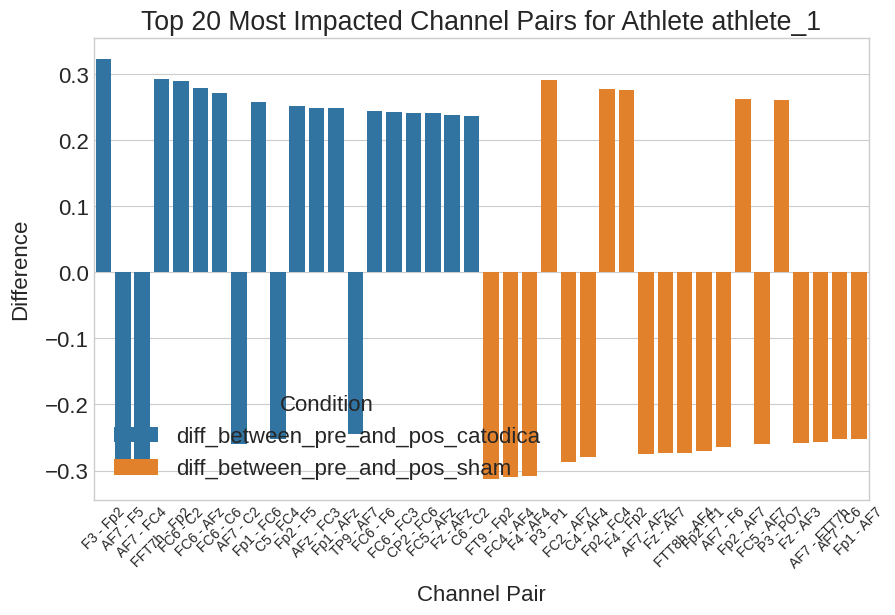

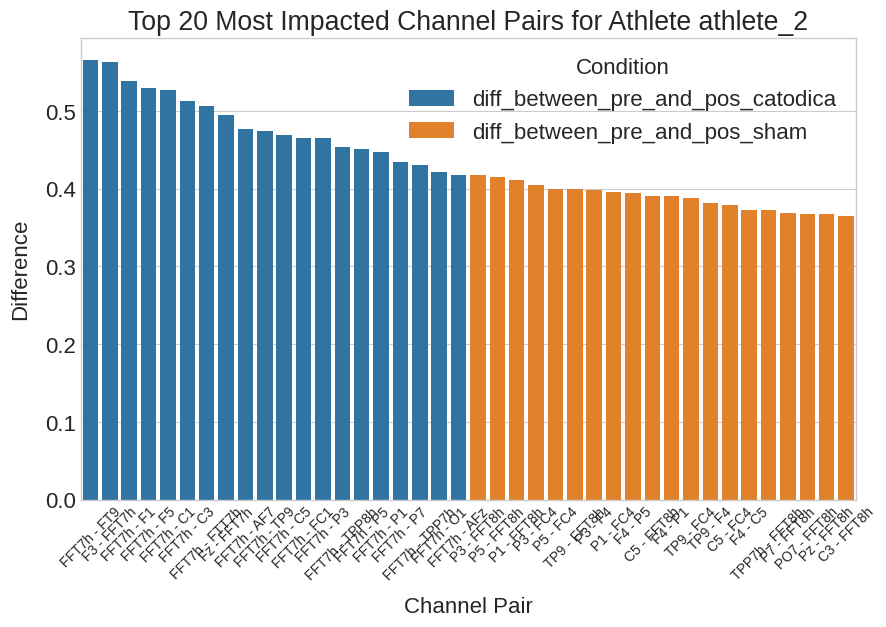

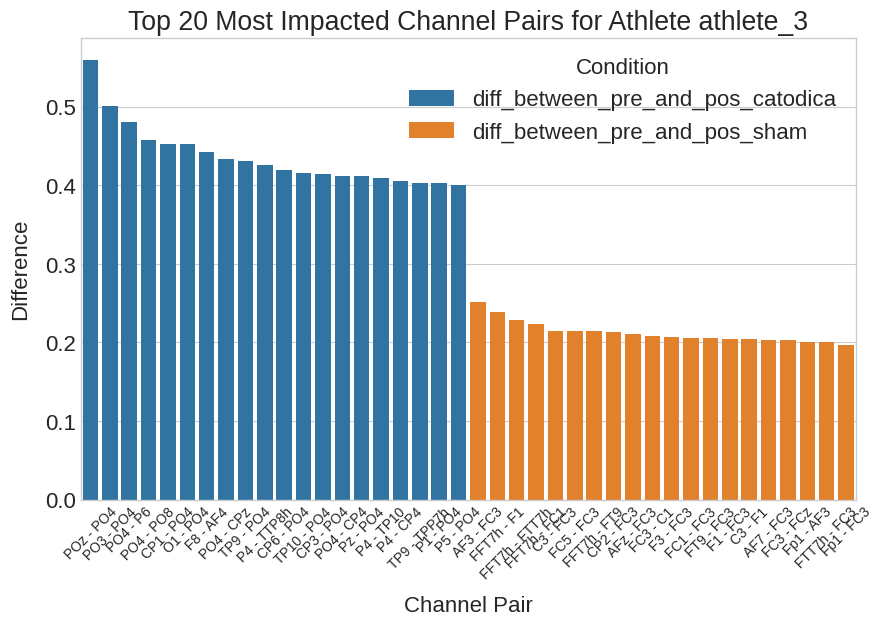

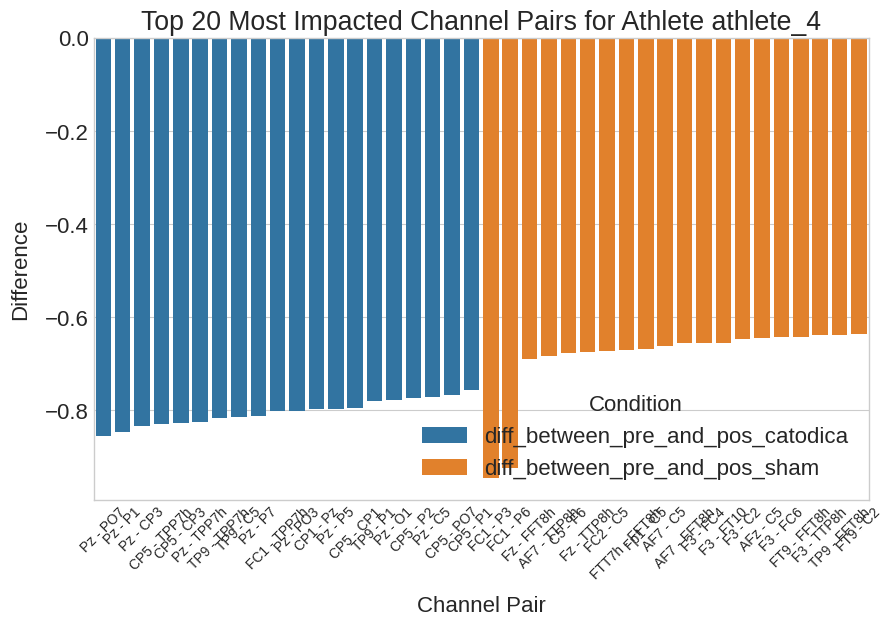

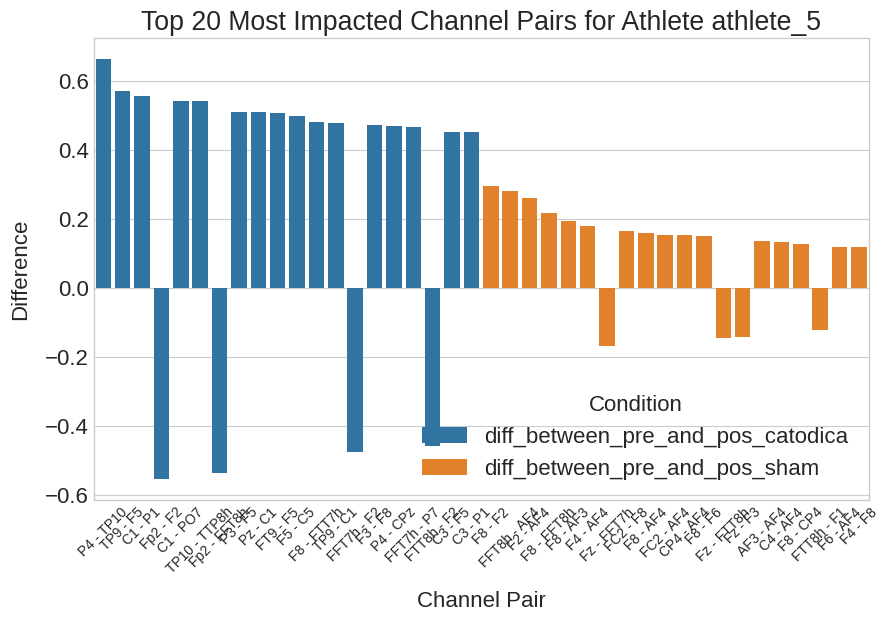

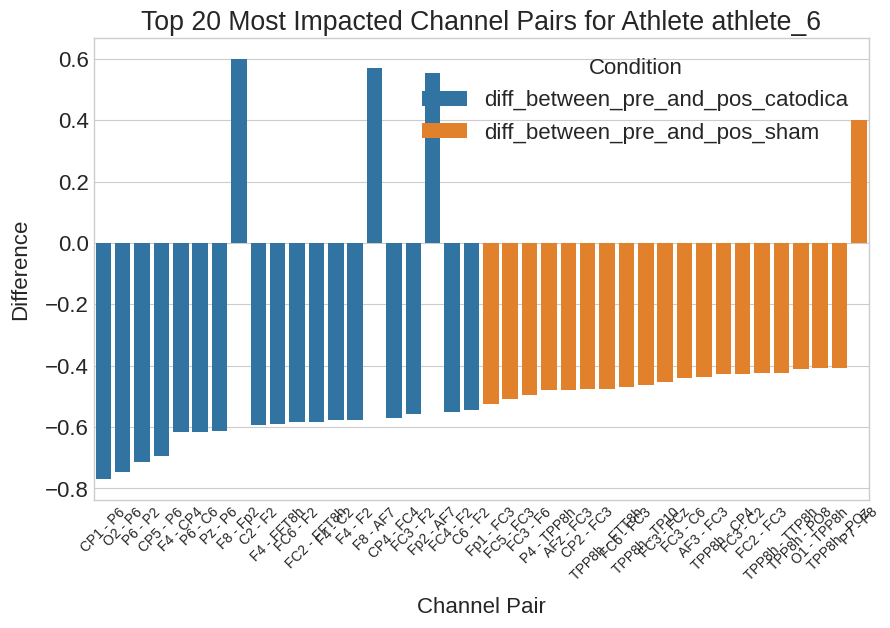

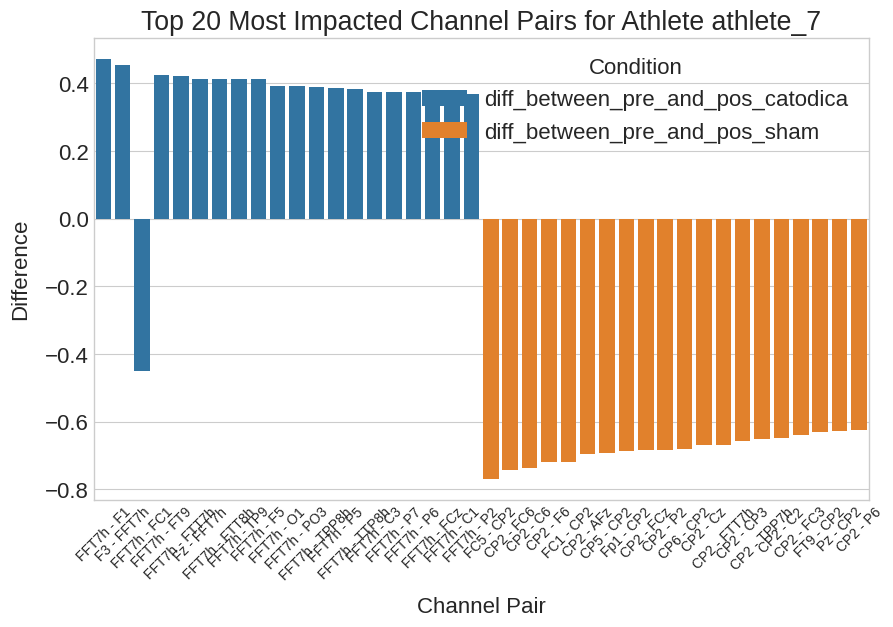

In [ ]:
def plot_differences(df, athlete, top_n=10):
    athlete_df = df[df['athlete'] == athlete]
    athlete_df = athlete_df.melt(id_vars=['Channel_Pair', 'athlete'], var_name='condition', value_name='difference')

    # Calculate the absolute differences for each condition
    athlete_df['abs_difference'] = athlete_df['difference'].abs()

    # Select the top N most significant differences for each condition
    top_diffs = athlete_df.groupby('condition').apply(lambda x: x.nlargest(top_n, 'abs_difference')).reset_index(drop=True)

    sns.barplot(data=top_diffs, x='Channel_Pair', y='difference', hue='condition')
    plt.title(f'Top {top_n} Most Impacted Channel Pairs for Athlete {athlete}')
    plt.xlabel('Channel Pair')
    plt.ylabel('Difference')
    plt.xticks(rotation=45, fontsize=10)
    plt.legend(title='Condition')
    plt.show()


for athlete in athletes:
    plot_differences(final_df, athlete, top_n=20)

To create the new columns for regions based on the Channel_1 and Channel_2 columns, you can use a function to map the channel names to their respective regions. In general, EEG channel names can be mapped to their respective regions as follows:

- Frontal (F): Fp1, Fp2, F3, F4, F5, F6, F7, F8, Fz, AFz, AF3, AF7
- Central (C): C1, C2, C3, C4, C5, C6, Cz
- Temporal (T): FT9, FT10, TTP7h, TTP8h, TP9, TP10
- Parietal (P): P1, P2, P3, P4, P5, P6, P7, Pz
- Occipital (O): O1, O2, POz
- Frontal-Central (FC): FC1, FC2, FC3, FC4, FC5, FC6, FCz, FTT7h, FTT8h
- Central-Parietal (CP): CP1, CP2, CP3, CP4, CP5, CP6, CPz, TPP7h, TPP8h
- Parietal-Occipital (PO): PO3, PO4, PO7, PO8
- Frontal-Temporal (FT): FFT7h, FFT8h

In [ ]:
def get_region(channel):
    frontal = ['Fp1', 'Fp2', 'F3', 'F4', 'F5', 'F6', 'F7', 'F8', 'Fz', 'AFz', 'AF3', 'AF7']
    central = ['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'Cz']
    temporal = ['FT9', 'FT10', 'TTP7h', 'TTP8h', 'TP9', 'TP10']
    parietal = ['P1', 'P2', 'P3', 'P4', 'P5', 'P6', 'P7', 'Pz']
    occipital = ['O1', 'O2', 'POz']
    frontal_central = ['FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'FCz', 'FTT7h', 'FTT8h']
    central_parietal = ['CP1', 'CP2', 'CP3', 'CP4', 'CP5', 'CP6', 'CPz', 'TPP7h', 'TPP8h']
    parietal_occipital = ['PO3', 'PO4', 'PO7', 'PO8']
    frontal_temporal = ['FFT7h', 'FFT8h']

    if channel in frontal:
        return 'Frontal'
    elif channel in central:
        return 'Central'
    elif channel in temporal:
        return 'Temporal'
    elif channel in parietal:
        return 'Parietal'
    elif channel in occipital:
        return 'Occipital'
    elif channel in frontal_central:
        return 'Frontal-Central'
    elif channel in central_parietal:
        return 'Central-Parietal'
    elif channel in parietal_occipital:
        return 'Parietal-Occipital'
    elif channel in frontal_temporal:
        return 'Frontal-Temporal'

In [ ]:
plvs_processed_df['channel_1_region'] = plvs_processed_df['Channel_1'].apply(get_region)
plvs_processed_df['channel_2_region'] = plvs_processed_df['Channel_2'].apply(get_region)

In [ ]:
def calculate_differences(df, athlete):
    df_athlete = df[df['Athlete'] == athlete]
    pre_sham = df_athlete[df_athlete['Condition'] == 'pre_sham']
    pos_sham = df_athlete[df_athlete['Condition'] == 'post_sham']
    pre_catodica = df_athlete[df_athlete['Condition'] == 'pre_cathodic']
    pos_catodica = df_athlete[df_athlete['Condition'] == 'post_cathodic']

    # Group by region pairs
    diff_sham = pos_sham.groupby(['channel_1_region', 'channel_2_region'])['PLV'].mean() - pre_sham.groupby(['channel_1_region', 'channel_2_region'])['PLV'].mean()
    diff_catodica = pos_catodica.groupby(['channel_1_region', 'channel_2_region'])['PLV'].mean() - pre_catodica.groupby(['channel_1_region', 'channel_2_region'])['PLV'].mean()

    diff_df = pd.DataFrame({'athlete': athlete, 'diff_between_pre_and_pos_sham': diff_sham, 'diff_between_pre_and_pos_catodica': diff_catodica}).reset_index()
    diff_df['Region_Pair'] = diff_df['channel_1_region'] + ' - ' + diff_df['channel_2_region']
    return diff_df

athletes = plvs_processed_df['Athlete'].unique()
diff_dfs = [calculate_differences(plvs_processed_df, athlete) for athlete in athletes]
final_df = pd.concat(diff_dfs)

In [ ]:
print(final_df[0:5].to_string(index=False))

channel_1_region channel_2_region   athlete  diff_between_pre_and_pos_sham  diff_between_pre_and_pos_catodica                Region_Pair
         Central          Central athlete_1                       0.022476                           0.019429          Central - Central
         Central Central-Parietal athlete_1                       0.080640                           0.041520 Central - Central-Parietal
         Central          Frontal athlete_1                      -0.039571                          -0.017536          Central - Frontal
         Central  Frontal-Central athlete_1                      -0.009440                           0.010760  Central - Frontal-Central
         Central Frontal-Temporal athlete_1                      -0.054714                          -0.036000 Central - Frontal-Temporal


<ipython-input-124-01bd266a014a>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i][0].set_xticklabels(axes[i][0].get_xticklabels(), rotation=90)
<ipython-input-124-01bd266a014a>:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i][1].set_xticklabels(axes[i][1].get_xticklabels(), rotation=90)
<ipython-input-124-01bd266a014a>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i][0].set_xticklabels(axes[i][0].get_xticklabels(), rotation=90)
<ipython-input-124-01bd266a014a>:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i][1].set_xticklabels(axes[i][1].get_xticklabels(), rotation=90)
<ipython-input-124-01bd266a014a>:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i][0].set_xticklabels(axes[i][0].get_xticklabels(), rotation=90)
<ipython-input-124-01bd266a014a>:23: UserWarning: FixedFormatter should only be 

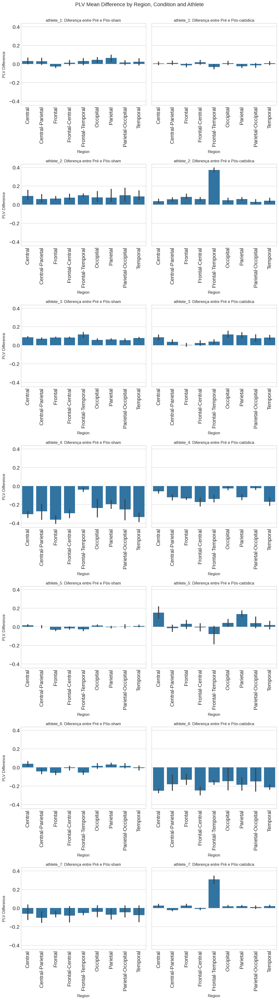

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Group data by athlete, condition, and region
grouped_df = final_df.groupby(['athlete', 'channel_1_region', 'channel_2_region']).mean(numeric_only=True).reset_index()

# Set up the subplots
n_athletes = len(grouped_df['athlete'].unique())
fig, axes = plt.subplots(n_athletes, 2, figsize=(12, 6*n_athletes), sharey=True)

fig.suptitle('PLV Mean Difference by Region, Condition and Athlete', y=1.0, fontsize=16)

# Plot the differences for each athlete
for i, athlete in enumerate(grouped_df['athlete'].unique()):
    sns.barplot(data=grouped_df[grouped_df['athlete'] == athlete], x='channel_1_region', y='diff_between_pre_and_pos_sham', ax=axes[i][0])
    sns.barplot(data=grouped_df[grouped_df['athlete'] == athlete], x='channel_1_region', y='diff_between_pre_and_pos_catodica', ax=axes[i][1])

    axes[i][0].set_title(f'{athlete}: Diferença entre Pré e Pós-sham', fontsize=12)
    axes[i][1].set_title(f'{athlete}: Diferença entre Pré e Pós-catódica', fontsize=12)

    axes[i][0].set_xticklabels(axes[i][0].get_xticklabels(), rotation=90)
    axes[i][1].set_xticklabels(axes[i][1].get_xticklabels(), rotation=90)

    axes[i][0].set_xlabel('Region', fontsize=12)
    axes[i][1].set_xlabel('Region', fontsize=12)

    axes[i][0].set_ylabel('PLV Difference', fontsize=12)
    axes[i][1].set_ylabel('PLV Difference', fontsize=12)

plt.tight_layout()

# Display the plot
plt.show()

# Save the plot as a PNG file
filename = "PLV_Difference_By_Regions_Athletes.png"
fig.savefig(filename, bbox_inches='tight')

In [ ]:
for athlete in grouped_df['athlete'].unique():
    athlete_df = grouped_df[grouped_df['athlete'] == athlete]
    regions = athlete_df['channel_1_region'].unique()

    for region in regions:
        sham_diff = athlete_df[athlete_df['channel_1_region'] == region]['diff_between_pre_and_pos_sham'].iloc[0]
        catodica_diff = athlete_df[athlete_df['channel_1_region'] == region]['diff_between_pre_and_pos_catodica'].iloc[0]

        # Print the data for the region
        print(f"Athlete: {athlete}")
        print(f"Region: {region}")
        print(f"Difference between pre and post-sham: {sham_diff:.2f}")
        print(f"Difference between pre and post-cathodic: {catodica_diff:.2f}")
        print()

Athlete: athlete_1
Region: Central
Difference between pre and post-sham: 0.02
Difference between pre and post-cathodic: 0.02

Athlete: athlete_1
Region: Central-Parietal
Difference between pre and post-sham: 0.03
Difference between pre and post-cathodic: 0.07

Athlete: athlete_1
Region: Frontal
Difference between pre and post-sham: -0.04
Difference between pre and post-cathodic: -0.01

Athlete: athlete_1
Region: Frontal-Central
Difference between pre and post-sham: 0.01
Difference between pre and post-cathodic: 0.06

Athlete: athlete_1
Region: Frontal-Temporal
Difference between pre and post-sham: 0.04
Difference between pre and post-cathodic: -0.06

Athlete: athlete_1
Region: Occipital
Difference between pre and post-sham: 0.06
Difference between pre and post-cathodic: 0.05

Athlete: athlete_1
Region: Parietal
Difference between pre and post-sham: 0.07
Difference between pre and post-cathodic: 0.00

Athlete: athlete_1
Region: Parietal-Occipital
Difference between pre and post-sham: 0.

In [ ]:
print(len(grouped_df['athlete'].unique()))

7


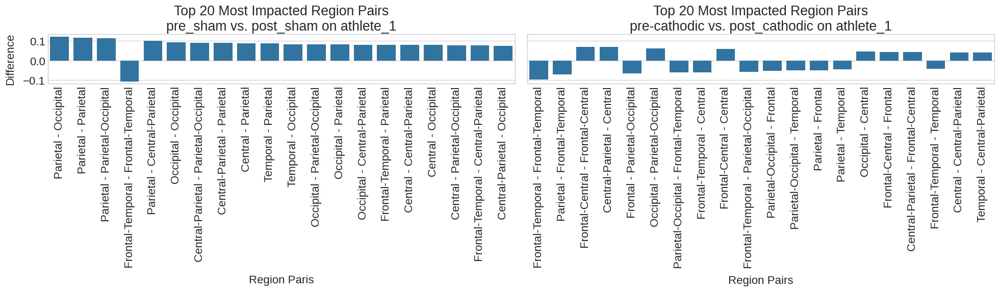

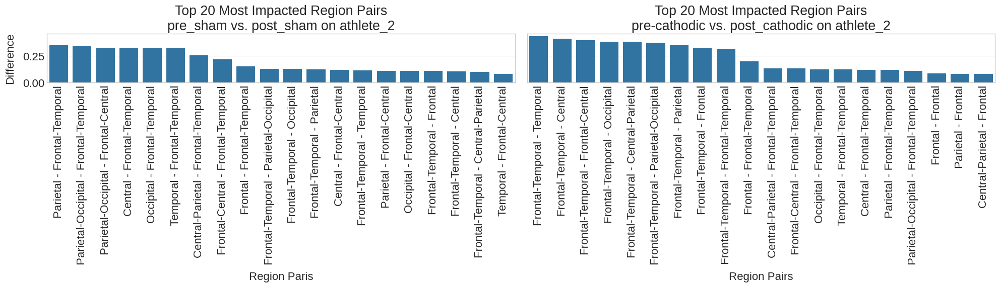

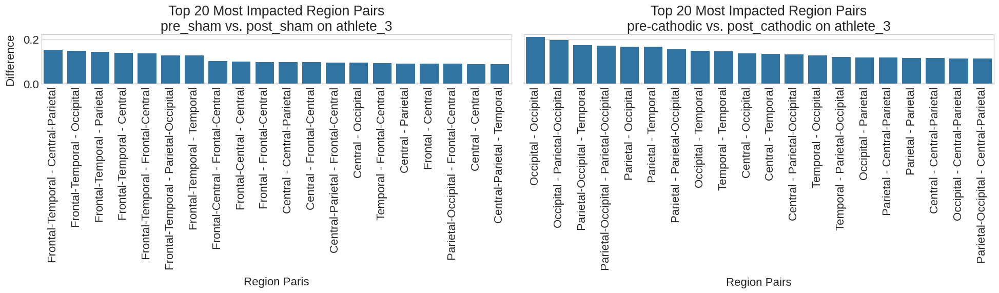

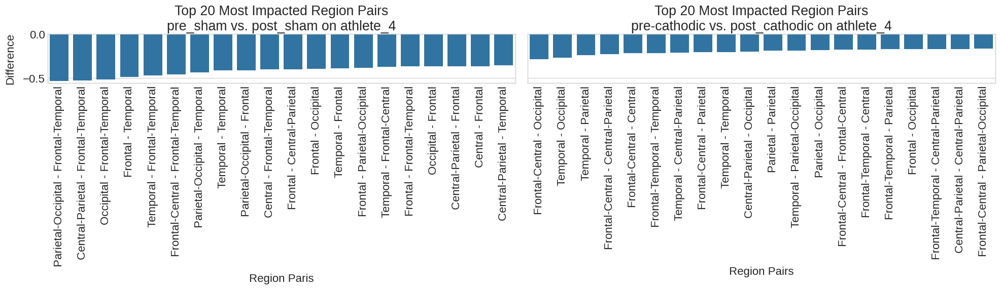

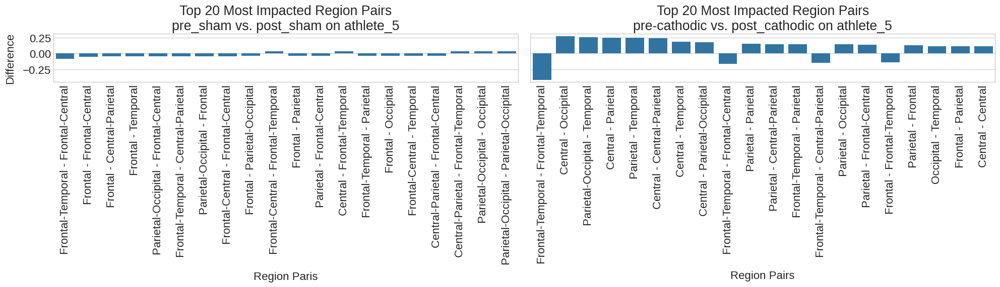

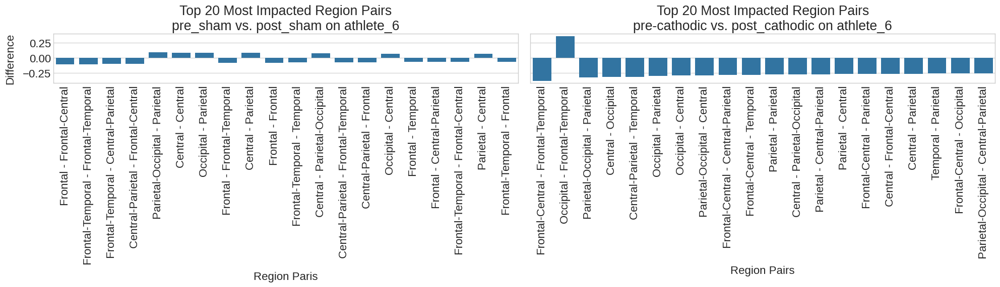

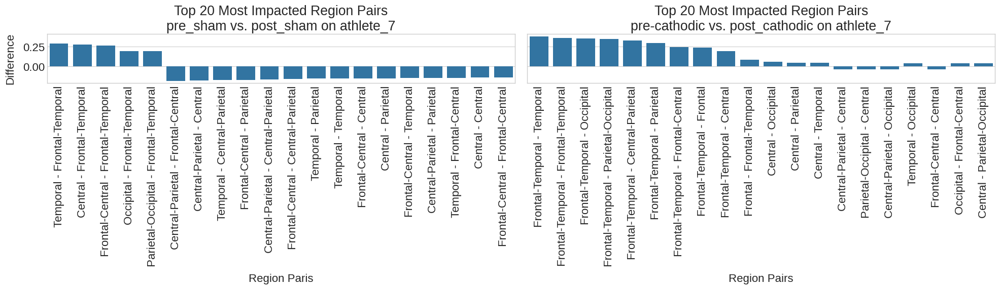

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

def plot_differences(df, athlete, top_n=10):
    athlete_df = df[df['athlete'] == athlete]
    athlete_df = athlete_df.melt(id_vars=['Region_Pair', 'athlete'], var_name='condition', value_name='difference')

    # Convert the 'difference' column to a numeric type
    athlete_df['difference'] = pd.to_numeric(athlete_df['difference'], errors='coerce')

    # Calculate the absolute differences for each condition
    athlete_df['abs_difference'] = athlete_df['difference'].abs()

    # Select the top N most significant differences for each condition
    top_diffs_sham = athlete_df[athlete_df['condition'] == 'diff_between_pre_and_pos_sham'].nlargest(top_n, 'abs_difference')
    top_diffs_catodica = athlete_df[athlete_df['condition'] == 'diff_between_pre_and_pos_catodica'].nlargest(top_n, 'abs_difference')

    fig, axes = plt.subplots(1, 2, figsize=(20, 6), sharey=True)

    sns.barplot(data=top_diffs_sham, x='Region_Pair', y='difference', ax=axes[0])
    axes[0].set_title(f'Top {top_n} Most Impacted Region Pairs\npre_sham vs. post_sham on {athlete}')
    axes[0].set_xlabel('Region Paris')
    axes[0].set_ylabel('Difference')
    axes[0].tick_params(axis='x', rotation=90)

    sns.barplot(data=top_diffs_catodica, x='Region_Pair', y='difference', ax=axes[1])
    axes[1].set_title(f'Top {top_n} Most Impacted Region Pairs\npre-cathodic vs. post_cathodic on {athlete}')
    axes[1].set_xlabel('Region Pairs')
    axes[1].set_ylabel('Difference')
    axes[1].tick_params(axis='x', rotation=90)

    plt.tight_layout()

    # Display the plot
    plt.show()

    # Save the plot as a PNG file
    filename = f"Top_{top_n}_Region_Pairs_Impact_{athlete}.png"
    plt.savefig(filename, bbox_inches='tight')

    # Close the plot to free up memory
    plt.close()

# Assuming 'final_df' and 'athletes' are defined and populated elsewhere in your code
for athlete in athletes:
    plot_differences(final_df, athlete, top_n=20)

In [ ]:
summary_data = []
top_n = 20
for athlete in athletes:
    athlete_df = final_df[final_df['athlete'] == athlete]
    athlete_df = athlete_df.melt(id_vars=['Region_Pair', 'athlete'], var_name='condition', value_name='difference')

    # Convert the 'difference' column to a numeric type
    athlete_df['difference'] = pd.to_numeric(athlete_df['difference'], errors='coerce')

    # Calculate the absolute differences for each condition
    athlete_df['abs_difference'] = athlete_df['difference'].abs()

    # Select the top N most significant differences for each condition
    top_diffs_sham = athlete_df[athlete_df['condition'] == 'diff_between_pre_and_pos_sham'].nlargest(top_n, 'abs_difference')
    top_diffs_catodica = athlete_df[athlete_df['condition'] == 'diff_between_pre_and_pos_catodica'].nlargest(top_n, 'abs_difference')

    # Add the summary data for the current athlete
    summary_data.append((athlete, top_diffs_sham, top_diffs_catodica))

# Convert the summary data to string format
summary_str = ""
for athlete, top_diffs_sham, top_diffs_catodica in summary_data:
    athlete_summary = f"Athlete: {athlete}\n"
    athlete_summary += f"Top Differences (Sham):\n{top_diffs_sham[['Region_Pair', 'difference']].to_string(index=False)}\n"
    athlete_summary += f"Top Differences (Catódica):\n{top_diffs_catodica[['Region_Pair', 'difference']].to_string(index=False)}\n\n"
    summary_str += athlete_summary

In [ ]:
print(summary_str)

Athlete: athlete_1
Top Differences (Sham):
                          Region_Pair  difference
                 Parietal - Occipital    0.122083
                  Parietal - Parietal    0.117071
        Parietal - Parietal-Occipital    0.113708
  Frontal-Temporal - Frontal-Temporal   -0.107000
          Parietal - Central-Parietal    0.100306
                Occipital - Occipital    0.093667
Central-Parietal - Parietal-Occipital    0.089714
          Central-Parietal - Parietal    0.089528
                   Central - Parietal    0.087750
                  Temporal - Parietal    0.087500
                 Temporal - Occipital    0.082750
       Occipital - Parietal-Occipital    0.082700
                 Occipital - Parietal    0.081167
         Occipital - Central-Parietal    0.080812
          Frontal-Temporal - Parietal    0.080750
           Central - Central-Parietal    0.080640
                  Central - Occipital    0.079286
         Central - Parietal-Occipital    0.077100
  Front

In [ ]:
# Create a copy of your DataFrame and swap Channel_1 and Channel_2
df_swapped = plvs_processed_df.copy()
df_swapped['Channel_1'], df_swapped['Channel_2'] = plvs_processed_df['Channel_2'], plvs_processed_df['Channel_1']

# Concatenate the original DataFrame with the swapped DataFrame
df_combined = pd.concat([plvs_processed_df, df_swapped])

In [ ]:
import numpy as np
import os

if not os.path.exists('plots'):
    os.makedirs('plots')


for athlete in athletes:
    for condition in conditions:
        # Use df_combined instead of plvs_processed_df
        athlete_condition_df = df_combined[(df_combined['Athlete'] == athlete) & (df_combined['Condition'] == condition)]
        channel_plv_pivot = athlete_condition_df.pivot_table(index='Channel_1', columns='Channel_2', values='PLV')

        # Create a mask for the upper triangle
        mask = np.triu(np.ones_like(channel_plv_pivot, dtype=bool))

        plt.figure(figsize=(10, 8))
        ax = sns.heatmap(channel_plv_pivot, mask=mask, cmap='coolwarm', annot=False, annot_kws={"size": 6})
        plt.title(f"PLV Correlation between channels on {athlete} - {condition}")

        channel_labels = channel_plv_pivot.columns.tolist()
        ax.set_xticks(np.arange(len(channel_labels)) + 0.5)
        ax.set_yticks(np.arange(len(channel_labels)) + 0.5)
        ax.set_xticklabels(channel_labels, rotation=90, fontsize=8)
        ax.set_yticklabels(channel_labels, rotation=0, fontsize=8)

        # Remove the x and y labels
        ax.set_xlabel('')
        ax.set_ylabel('')

        plt.show()
        filename = f"plots/Correlação de PLV entre canais para {athlete} - {condition}.png"
        plt.savefig(filename, dpi=300, bbox_inches='tight')


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import numpy as np

data_list = []
for athlete in athletes:
    for condition in conditions:
        athlete_condition_df = df_combined[(df_combined['Athlete'] == athlete) & (df_combined['Condition'] == condition)]
        channel_plv_pivot = athlete_condition_df.pivot_table(index='Channel_1', columns='Channel_2', values='PLV')

        # Convert the pivot table to a string representation
        channel_plv_str = channel_plv_pivot.to_string()

        # Append the athlete, condition, and data to the list
        data_list.append((athlete, condition, channel_plv_str))

# Convert the data list to a string format
data_str = ""
for athlete, condition, channel_plv_str in data_list:
    data_str += f"Athlete: {athlete}\n"
    data_str += f"Condition: {condition}\n"
    data_str += f"{channel_plv_str}\n\n"
print(data_str)

Athlete: athlete_1
Condition: pre_sham
Channel_2    AF3    AF4    AF7    AFz     C1     C2     C3     C4     C5     C6    CP1    CP2    CP3    CP4    CP5    CP6    CPz     Cz     F1     F2     F3     F4     F5     F6     F8    FC1    FC2    FC3    FC4    FC5    FC6    FCz  FFT7h  FFT8h   FT10    FT9  FTT7h  FTT8h    Fp1    Fp2     Fz     O1     O2     P1     P2     P3     P4     P5     P6     P7    PO3    PO4    PO7    PO8    POz     Pz   TP10    TP9  TPP7h  TPP8h  TTP8h
Channel_1                                                                                                                                                                                                                                                                                                                                                                                                                                           
AF3          NaN  0.388  0.562  0.680  0.480  0.648  0.422  0.485  0.340  0.643  0.526 

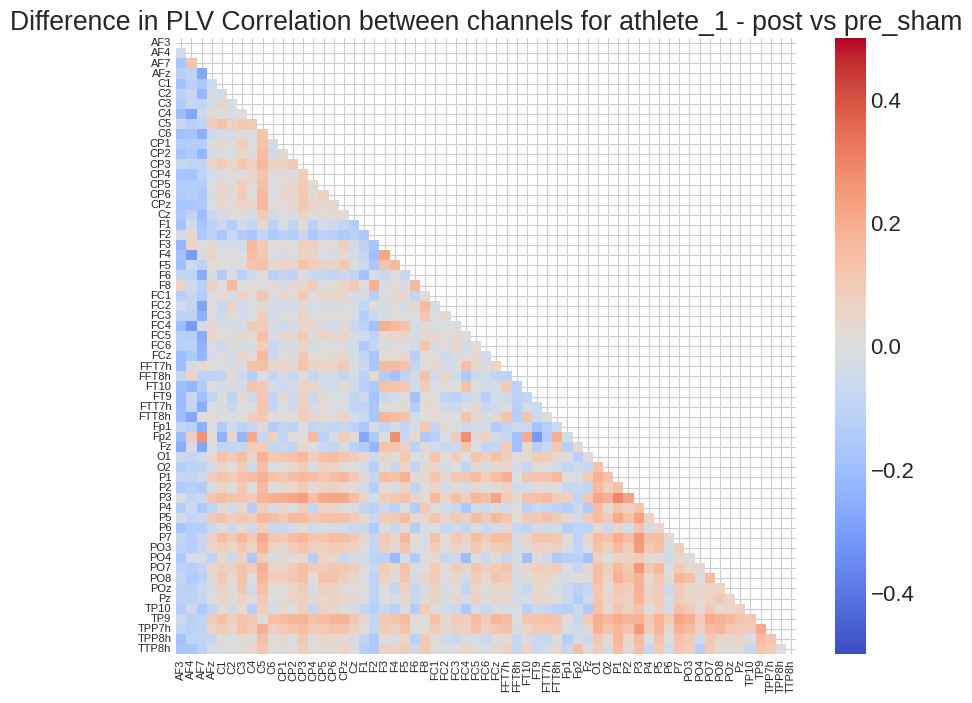

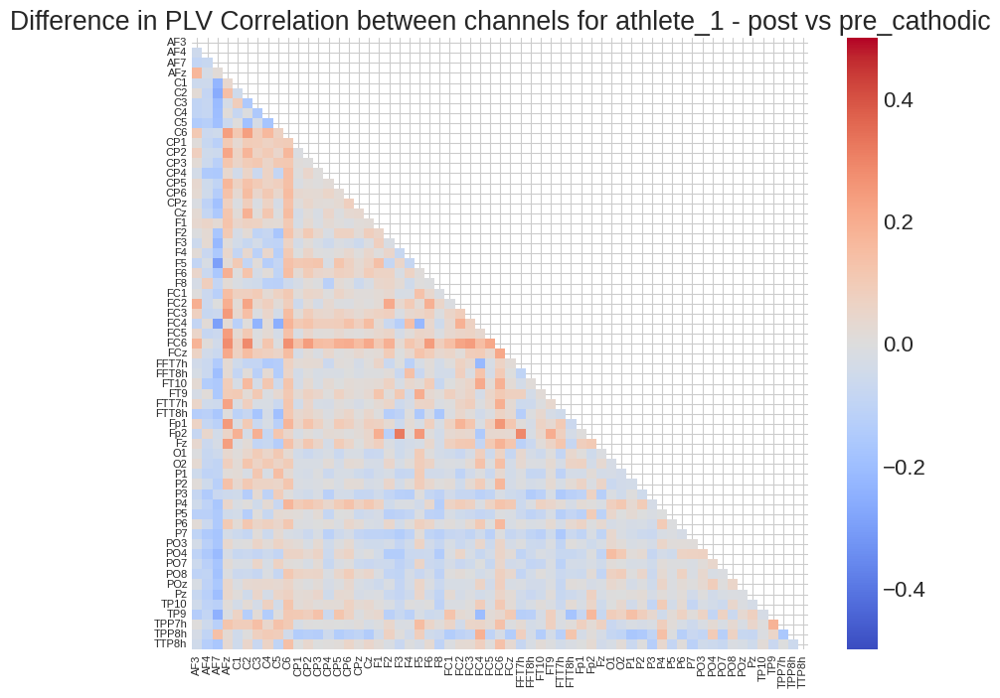

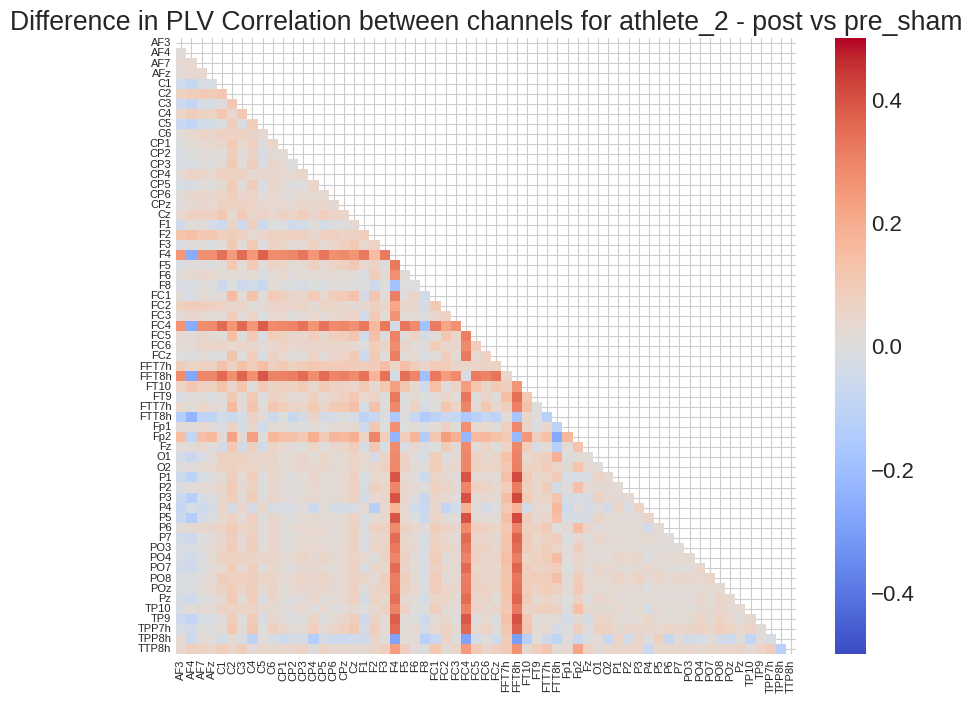

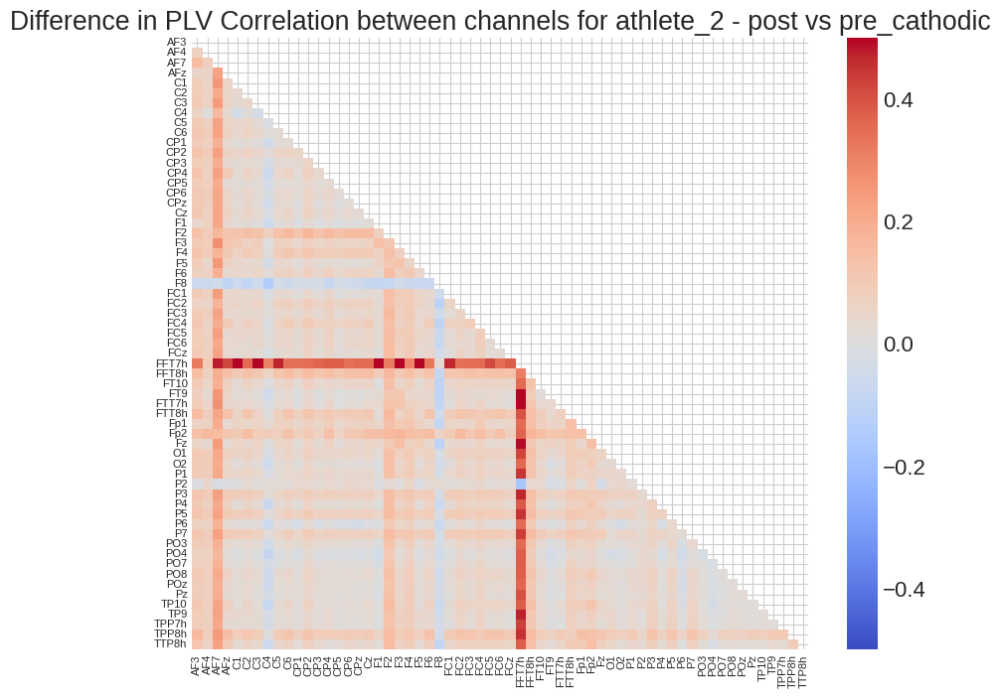

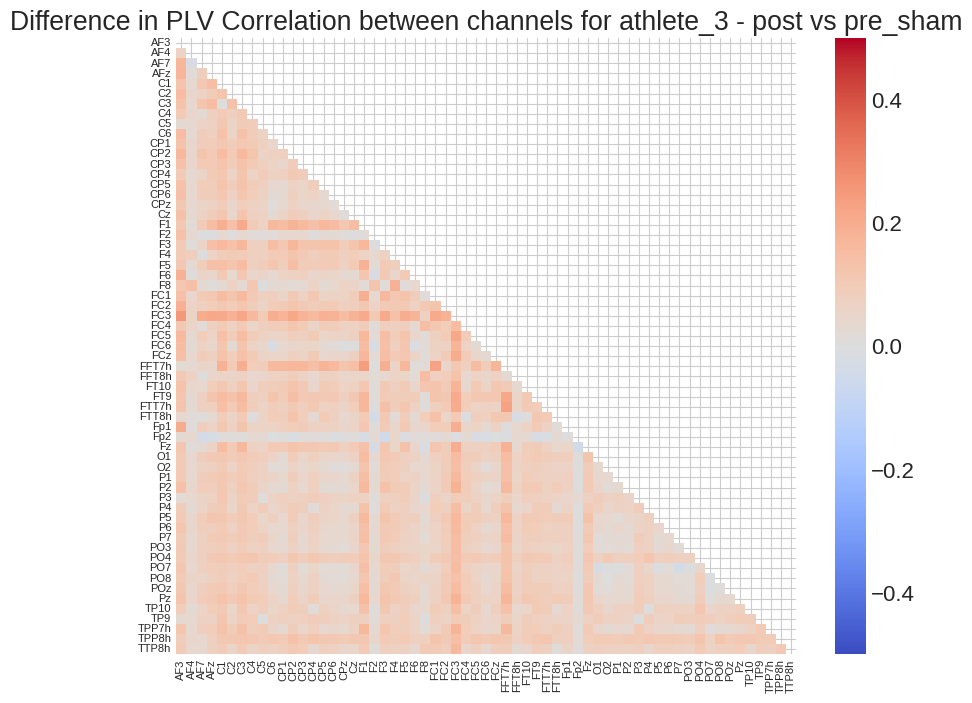

...

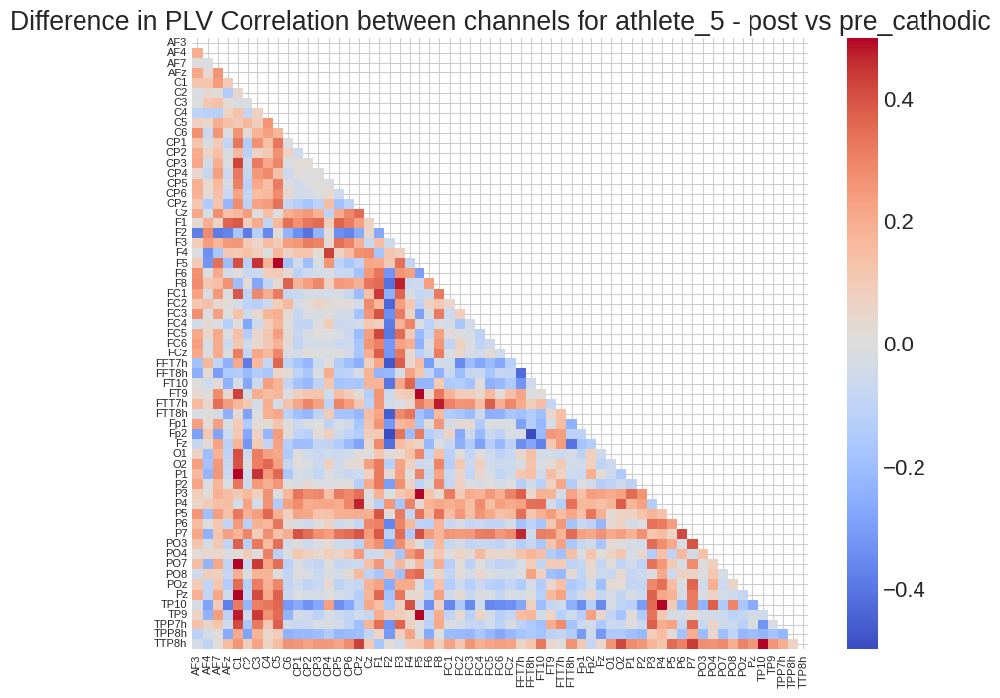

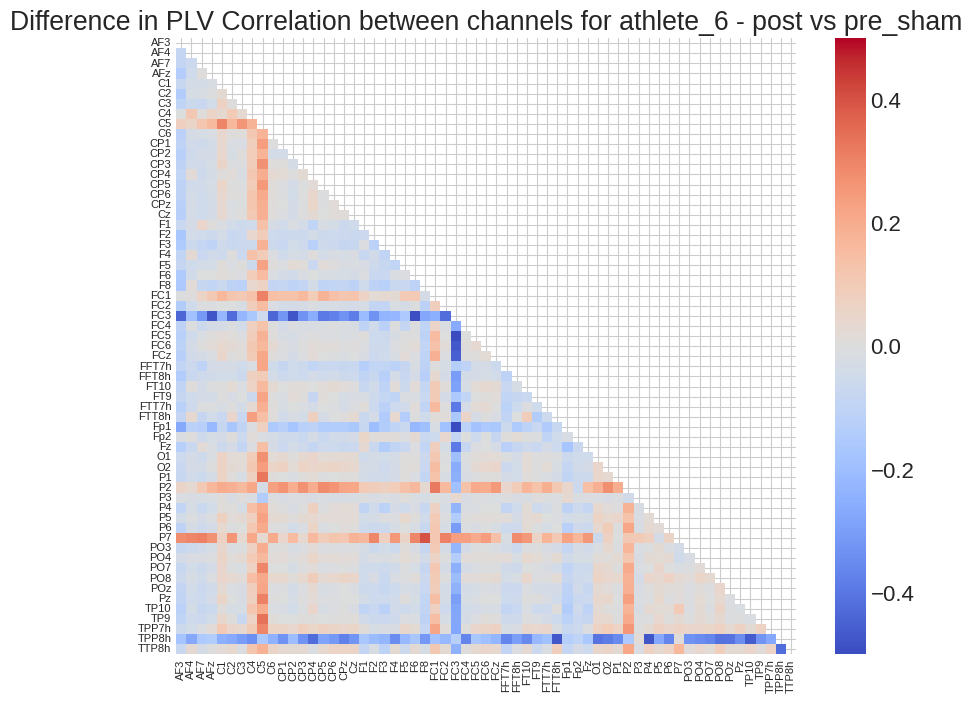

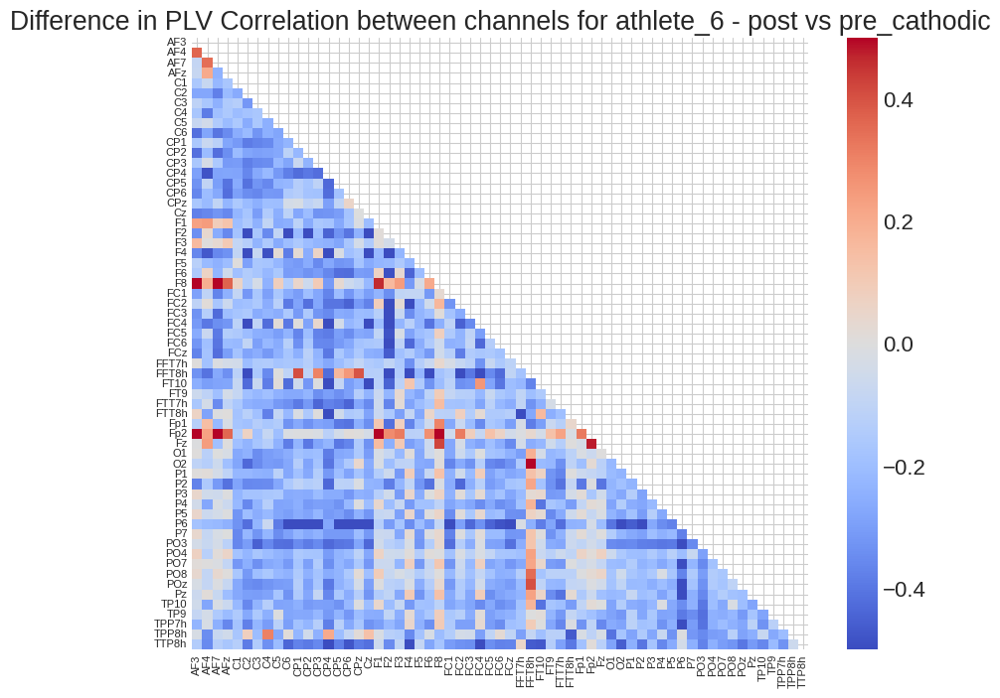

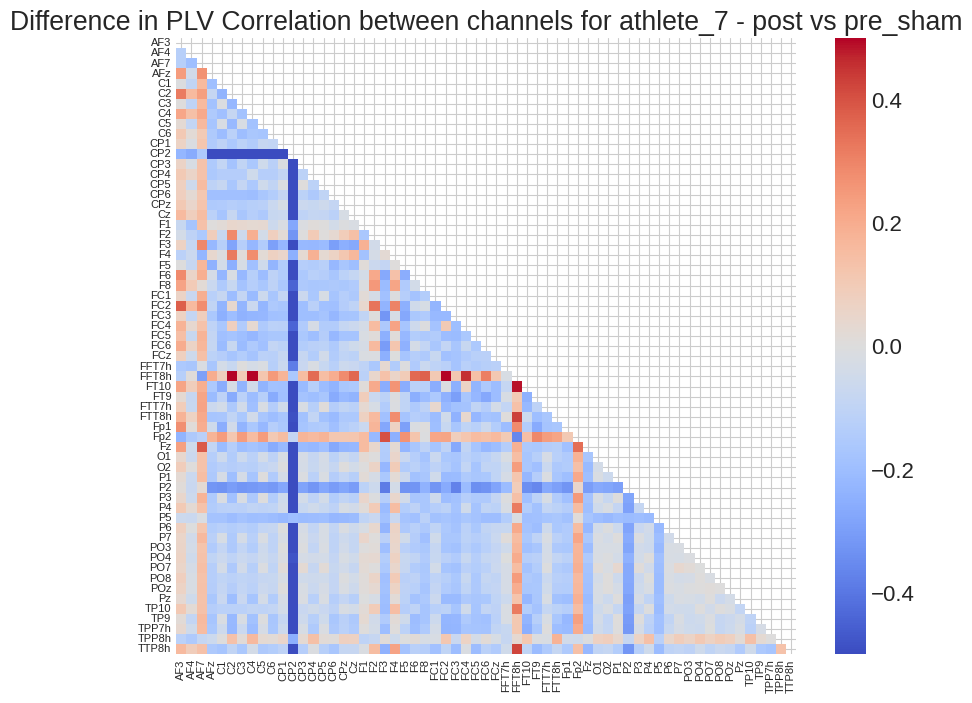

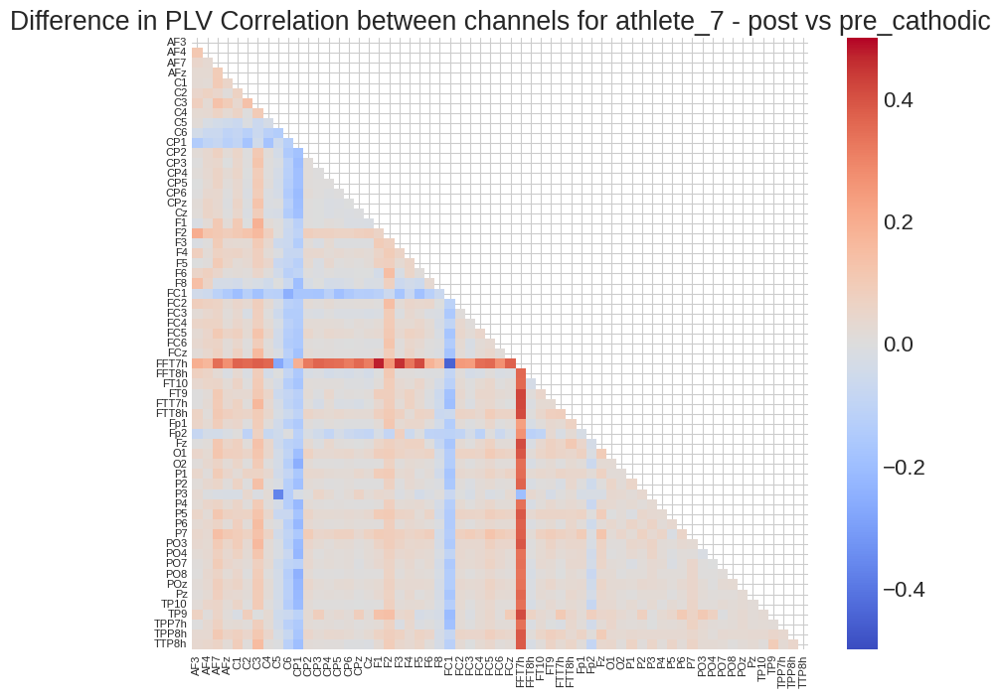

In [ ]:
two_conditions = ['sham', 'cathodic']

for athlete in athletes:
    for condition in two_conditions:
        # Filter for pre and post conditions
        athlete_pre_condition_df = df_combined[(df_combined['Athlete'] == athlete) & (df_combined['Condition'] == f'pre_{condition}')]
        athlete_post_condition_df = df_combined[(df_combined['Athlete'] == athlete) & (df_combined['Condition'] == f'post_{condition}')]

        pre_channel_plv_pivot = athlete_pre_condition_df.pivot_table(index='Channel_1', columns='Channel_2', values='PLV')
        post_channel_plv_pivot = athlete_post_condition_df.pivot_table(index='Channel_1', columns='Channel_2', values='PLV')

        # Calculate the difference between post and pre conditions
        diff_channel_plv_pivot = post_channel_plv_pivot - pre_channel_plv_pivot

        # Create a mask for the upper triangle
        mask = np.triu(np.ones_like(diff_channel_plv_pivot, dtype=bool))

        plt.figure(figsize=(10, 8))
        ax = sns.heatmap(diff_channel_plv_pivot, mask=mask, cmap='coolwarm', annot=False, annot_kws={"size": 6}, vmin=-0.5, vmax=0.5)
        plt.title(f"Difference in PLV Correlation between channels for {athlete} - post vs pre_{condition}")

        channel_labels = diff_channel_plv_pivot.columns.tolist()
        ax.set_xticks(np.arange(len(channel_labels)) + 0.5)
        ax.set_yticks(np.arange(len(channel_labels)) + 0.5)
        ax.set_xticklabels(channel_labels, rotation=90, fontsize=8)
        ax.set_yticklabels(channel_labels, rotation=0, fontsize=8)

        # Remover os rótulos x e y
        ax.set_xlabel('')
        ax.set_ylabel('')

        # Salvar o gráfico na pasta "plots"
        filename = f"plots/Difference in PLV Correlation between channels for {athlete} - post vs pre_{condition}.png"
        plt.savefig(filename, dpi=300, bbox_inches='tight')

        plt.show()

In [ ]:
import numpy as np

data_list = []
for athlete in athletes:
    for condition in two_conditions:
        athlete_pre_condition_df = df_combined[(df_combined['Athlete'] == athlete) & (df_combined['Condition'] == f'pre_{condition}')]
        athlete_post_condition_df = df_combined[(df_combined['Athlete'] == athlete) & (df_combined['Condition'] == f'post_{condition}')]

        pre_channel_plv_pivot = athlete_pre_condition_df.pivot_table(index='Channel_1', columns='Channel_2', values='PLV')
        post_channel_plv_pivot = athlete_post_condition_df.pivot_table(index='Channel_1', columns='Channel_2', values='PLV')

        diff_channel_plv_pivot = post_channel_plv_pivot - pre_channel_plv_pivot

        # Convert the pivot table to a string representation
        diff_channel_plv_str = diff_channel_plv_pivot.to_string()

        # Append the athlete, condition, and data to the list
        data_list.append((athlete, condition, diff_channel_plv_str))

# Convert the data list to a string format
data_str = ""
for athlete, condition, diff_channel_plv_str in data_list:
    data_str += f"Athlete: {athlete}\n"
    data_str += f"Condition: {condition}\n"
    data_str += f"{diff_channel_plv_str}\n\n"
print(data_str)

Athlete: athlete_1
Condition: sham
Channel_2    AF3    AF4    AF7    AFz     C1     C2     C3     C4     C5     C6    CP1    CP2    CP3    CP4    CP5    CP6    CPz     Cz     F1     F2     F3     F4     F5     F6     F8    FC1    FC2    FC3    FC4    FC5    FC6    FCz  FFT7h  FFT8h   FT10    FT9  FTT7h  FTT8h    Fp1    Fp2     Fz     O1     O2     P1     P2     P3     P4     P5     P6     P7    PO3    PO4    PO7    PO8    POz     Pz   TP10    TP9  TPP7h  TPP8h  TTP8h
Channel_1                                                                                                                                                                                                                                                                                                                                                                                                                                           
AF3          NaN -0.050 -0.175 -0.126 -0.191 -0.114 -0.148 -0.206 -0.069 -0.195 -0.144 -0.1

In [ ]:
for athlete in athletes:
    for condition in conditions:
        athlete_condition_df = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == condition)]

        # Group by regions and aggregate the PLV values using mean
        grouped_df = athlete_condition_df.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()

        region_plv_pivot = grouped_df.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')

        # Create a mask for the upper triangle
        mask = np.triu(np.ones_like(region_plv_pivot, dtype=bool))

        plt.figure(figsize=(10, 8))
        ax = sns.heatmap(region_plv_pivot, cmap='coolwarm', mask=mask, annot=True, annot_kws={"size": 10}, vmin=0, vmax=1)
        plt.title(f"PLV Correlation between regions on {athlete} - {condition}")

        region_labels = region_plv_pivot.columns.tolist()
        ax.set_xticks(np.arange(len(region_labels)) + 0.5)
        ax.set_yticks(np.arange(len(region_labels)) + 0.5)
        ax.set_xticklabels(region_labels, rotation=90, fontsize=10)
        ax.set_yticklabels(region_labels, rotation=0, fontsize=10)

        # Remover rótulos das regiões
        ax.set_xlabel('')
        ax.set_ylabel('')

        # Salvar o gráfico na pasta "plots"
        filename = f"plots/PLV Correlation between regions for {athlete} - {condition}.png"
        plt.savefig(filename, dpi=300, bbox_inches='tight')

        plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import numpy as np

data_list = []
for athlete in athletes:
    for condition in conditions:
        athlete_condition_df = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == condition)]

        # Group by regions and aggregate the PLV values using mean
        grouped_df = athlete_condition_df.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()

        region_plv_pivot = grouped_df.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')

        # Convert the pivot table to a string representation
        region_plv_str = region_plv_pivot.to_string()

        # Append the athlete, condition, and data to the list
        data_list.append((athlete, condition, region_plv_str))

# Convert the data list to a string format
data_str = ""
for athlete, condition, region_plv_str in data_list:
    data_str += f"Athlete: {athlete}\n"
    data_str += f"Condition: {condition}\n"
    data_str += f"{region_plv_str}\n\n"
print(data_str)

Athlete: athlete_1
Condition: pre_sham
channel_2_region     Central  Central-Parietal   Frontal  Frontal-Central  Frontal-Temporal  Occipital  Parietal  Parietal-Occipital  Temporal
channel_1_region                                                                                                                              
Central             0.594905          0.572800  0.482321         0.593800          0.470000   0.521429  0.559750            0.536150  0.631600
Central-Parietal    0.619289          0.633528  0.448591         0.599256          0.469889   0.655545  0.627222            0.620714  0.651765
Frontal             0.478857          0.442891  0.459782         0.538782          0.462385   0.386688  0.396058            0.368300  0.504182
Frontal-Central     0.602816          0.570690  0.505659         0.626556          0.490111   0.488917  0.517050            0.488156  0.573467
Frontal-Temporal    0.497857          0.406667  0.419000         0.446111          0.305000   0.373333 

## Non normalized

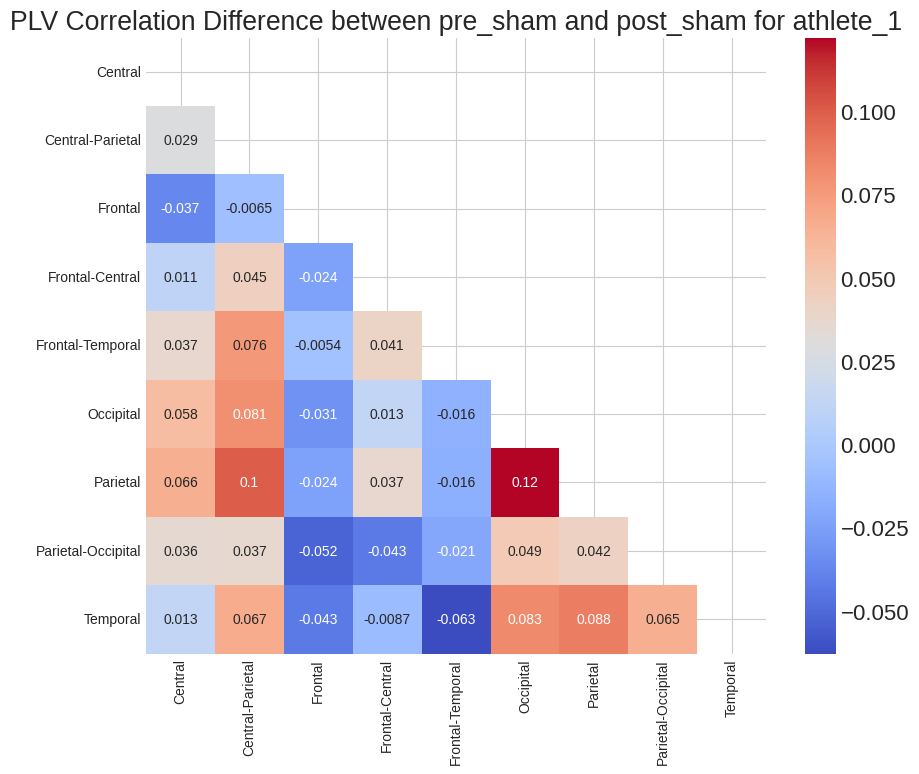

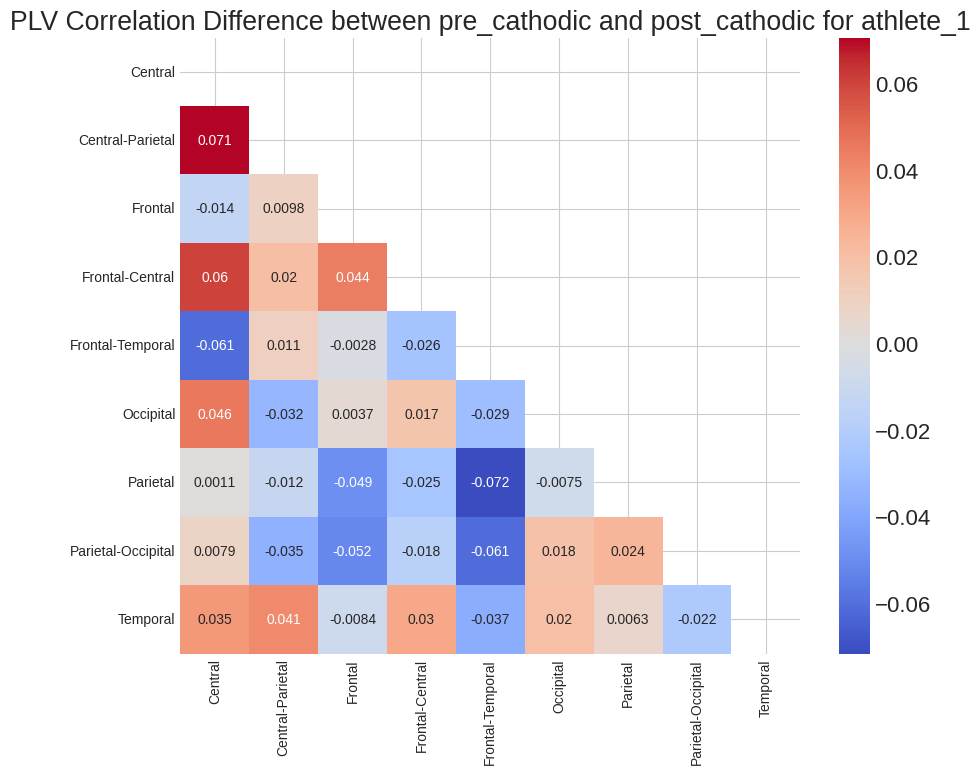

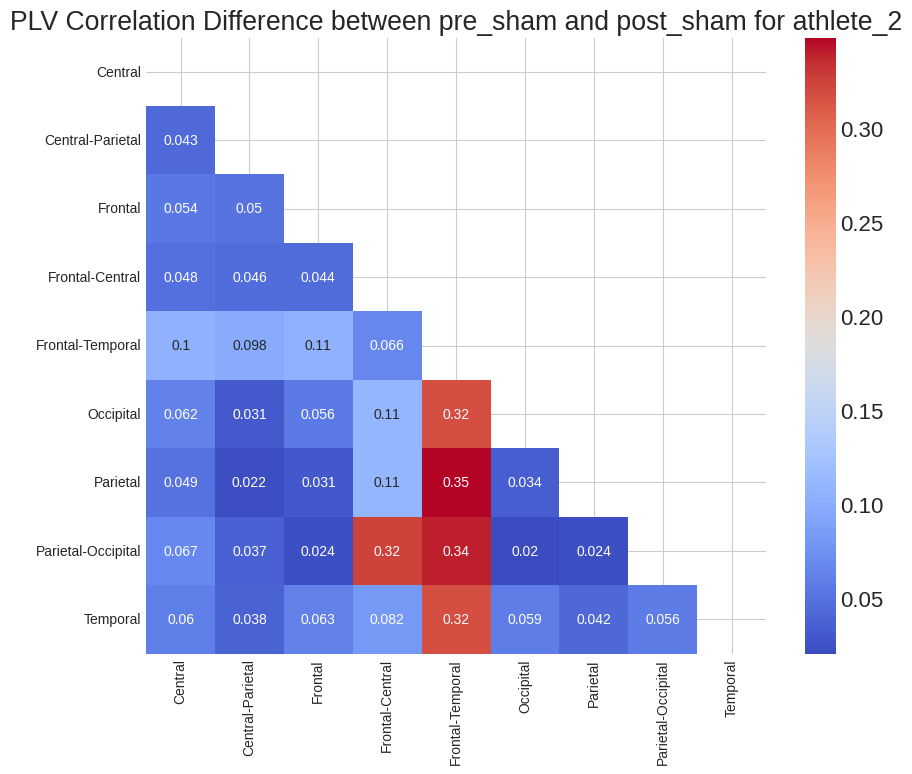

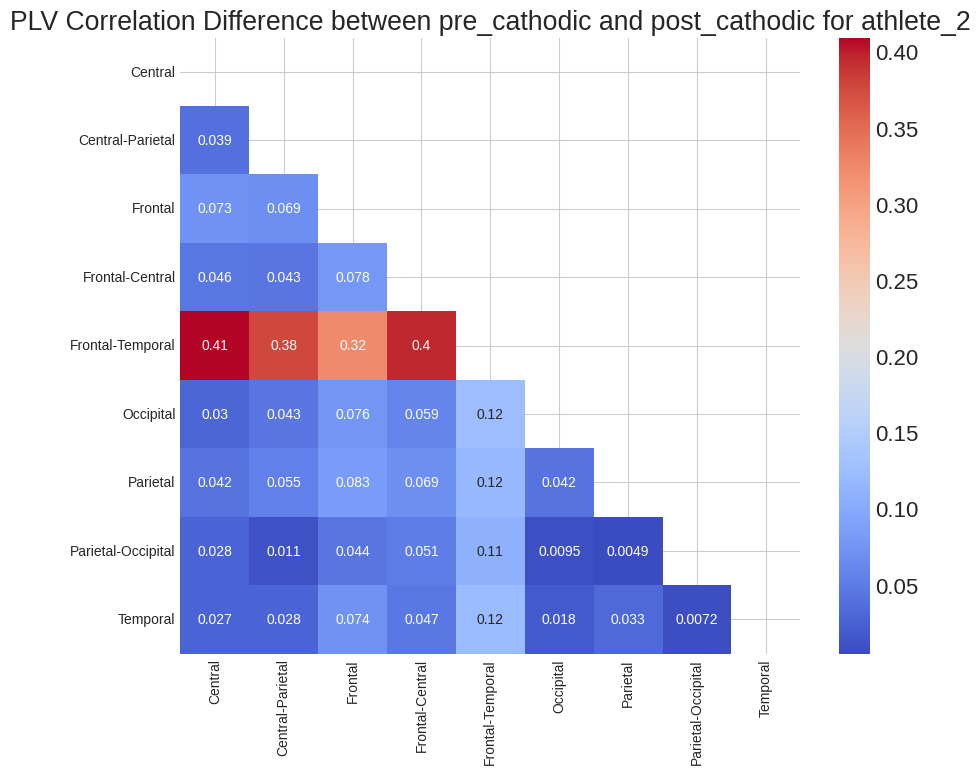

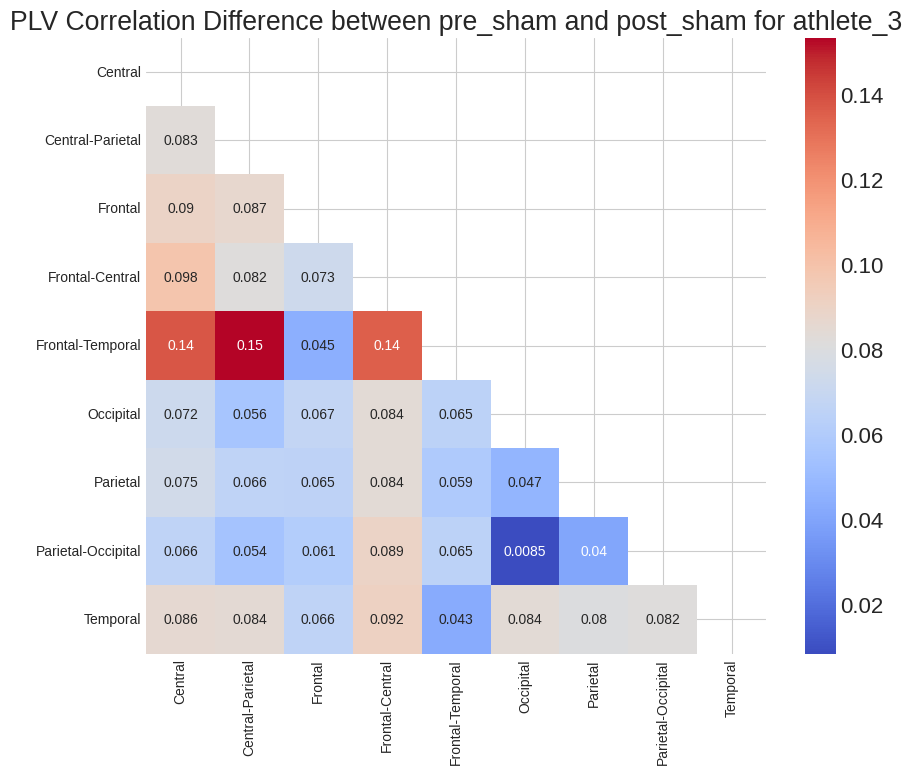

...

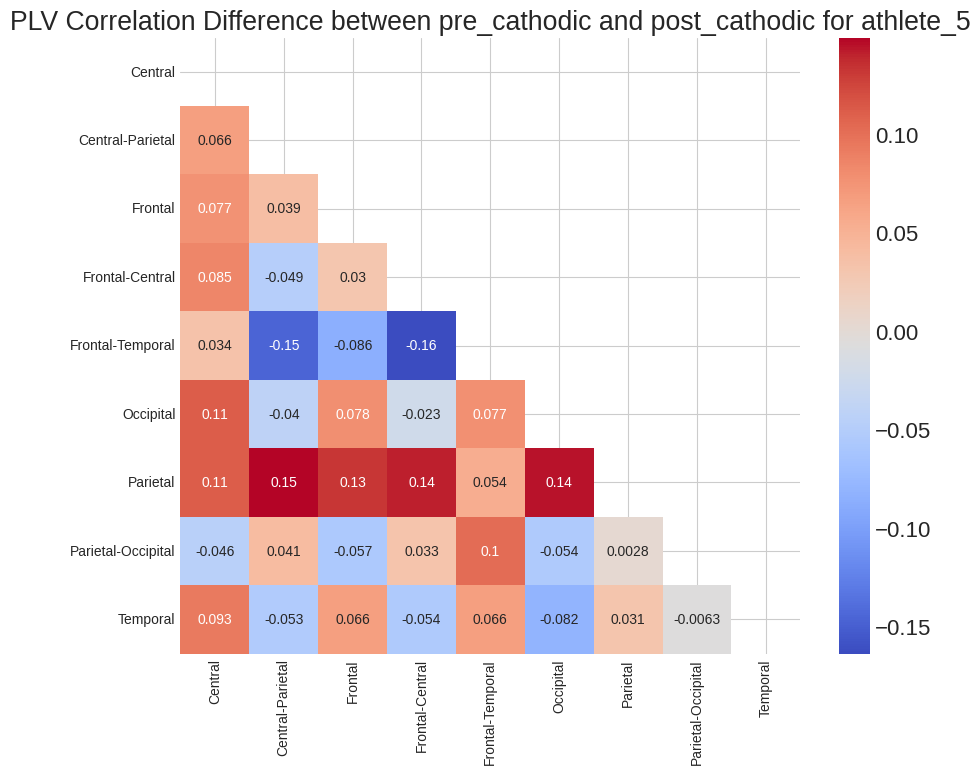

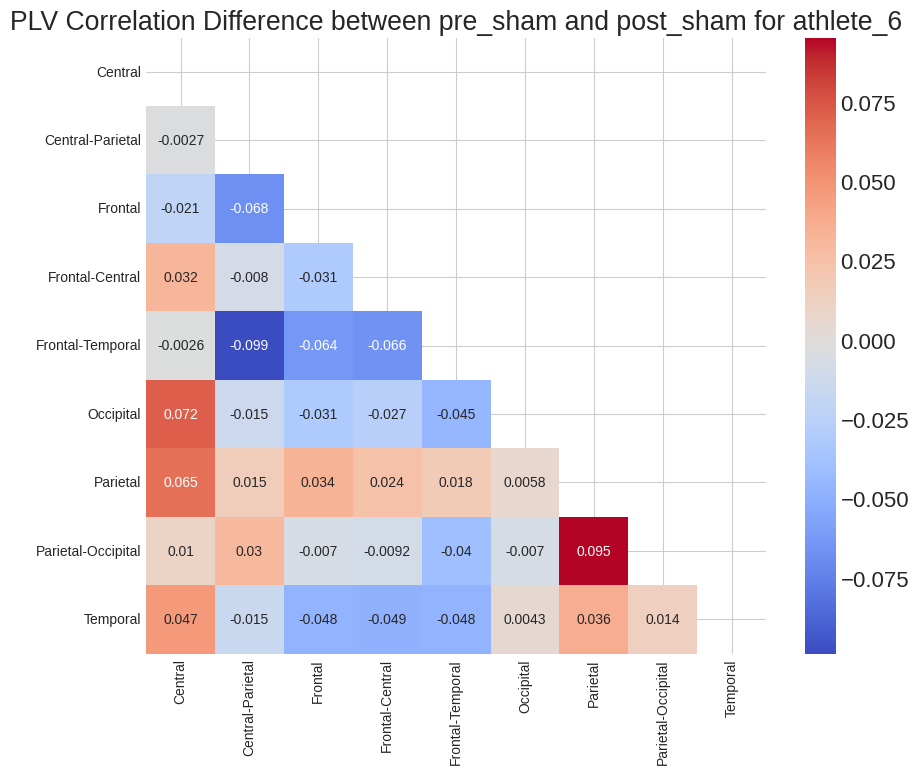

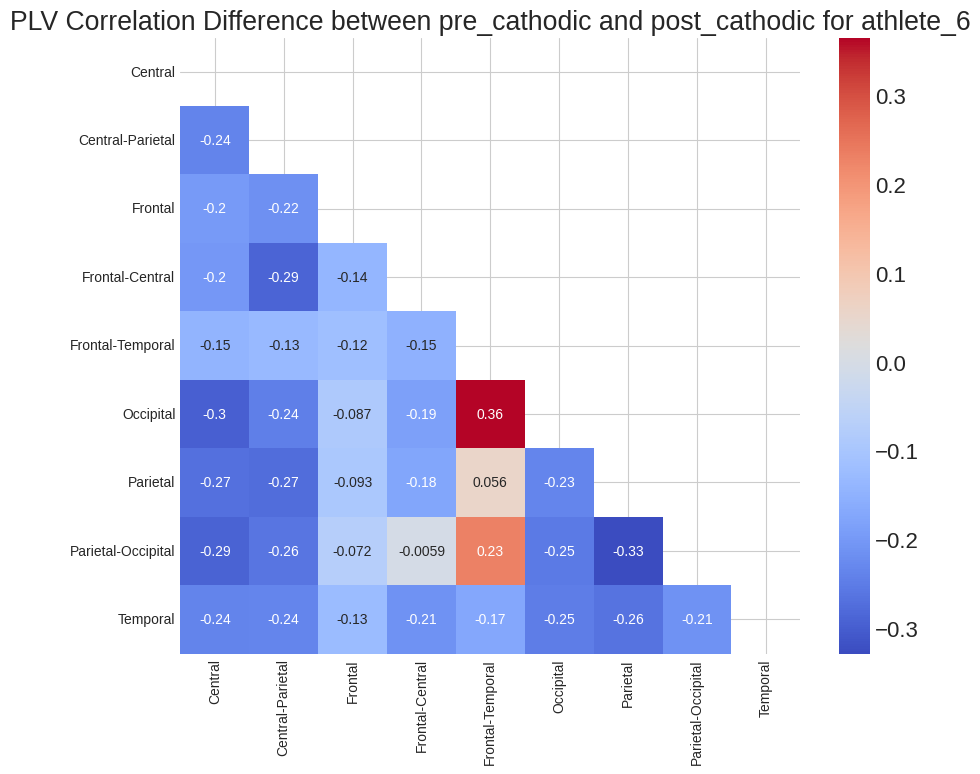

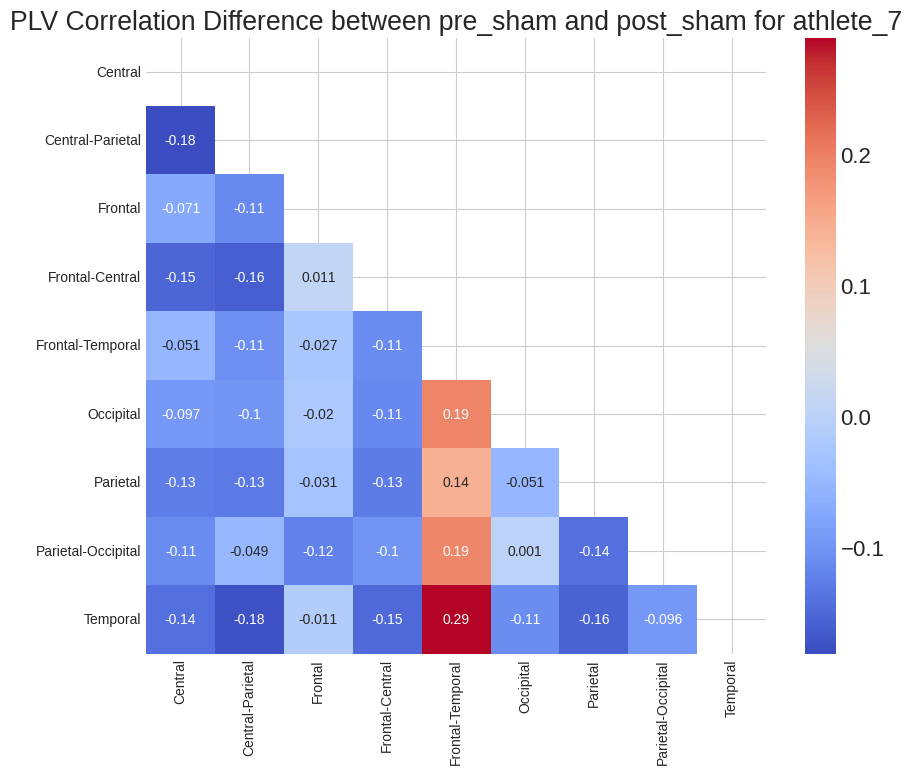

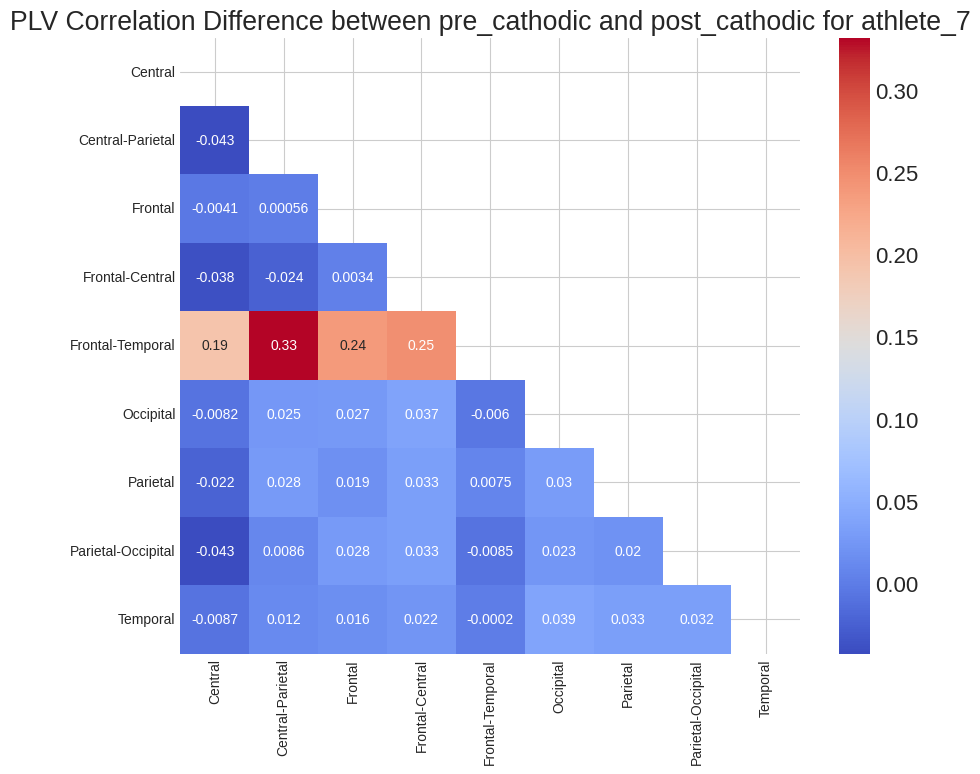

In [ ]:
def plot_heatmap_difference(plvs_processed_df, athlete, condition_1, condition_2):
    df_condition_1 = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == condition_1)]
    df_condition_2 = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == condition_2)]

    grouped_df_1 = df_condition_1.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()
    grouped_df_2 = df_condition_2.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()

    pivot_1 = grouped_df_1.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')
    pivot_2 = grouped_df_2.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')

    difference_pivot = pivot_2 - pivot_1

    # Create a mask for the upper triangle
    mask = np.triu(np.ones_like(difference_pivot, dtype=bool))

    plt.figure(figsize=(10, 8))
    ax = sns.heatmap(difference_pivot, mask=mask, cmap='coolwarm', annot=True, annot_kws={"size": 10})
    plt.title(f"PLV Correlation Difference between {condition_1} and {condition_2} for {athlete}")

    region_labels = difference_pivot.columns.tolist()
    ax.set_xticks(np.arange(len(region_labels)) + 0.5)
    ax.set_yticks(np.arange(len(region_labels)) + 0.5)
    ax.set_xticklabels(region_labels, rotation=90, fontsize=10)
    ax.set_yticklabels(region_labels, rotation=0, fontsize=10)

    # Remover rótulos das regiões
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Salvar o gráfico na pasta "plots"
    filename = f"plots/PLV Correlation Difference between {condition_1} and {condition_2} for {athlete}.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')

    plt.show()

for athlete in athletes:
    plot_heatmap_difference(plvs_processed_df, athlete, 'pre_sham', 'post_sham')
    plot_heatmap_difference(plvs_processed_df, athlete, 'pre_cathodic', 'post_cathodic')

## Normalized

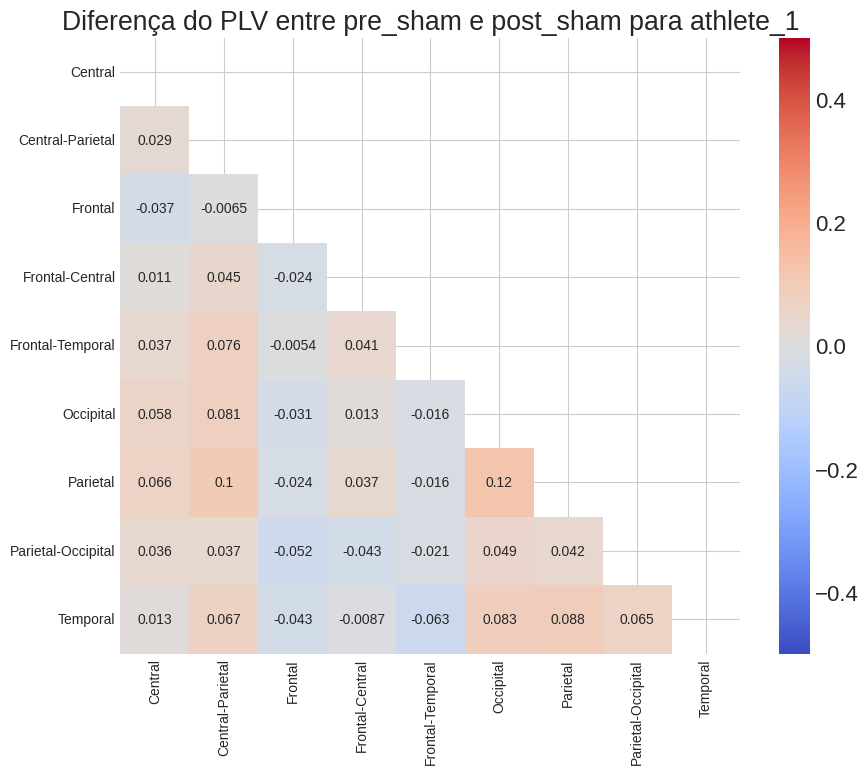

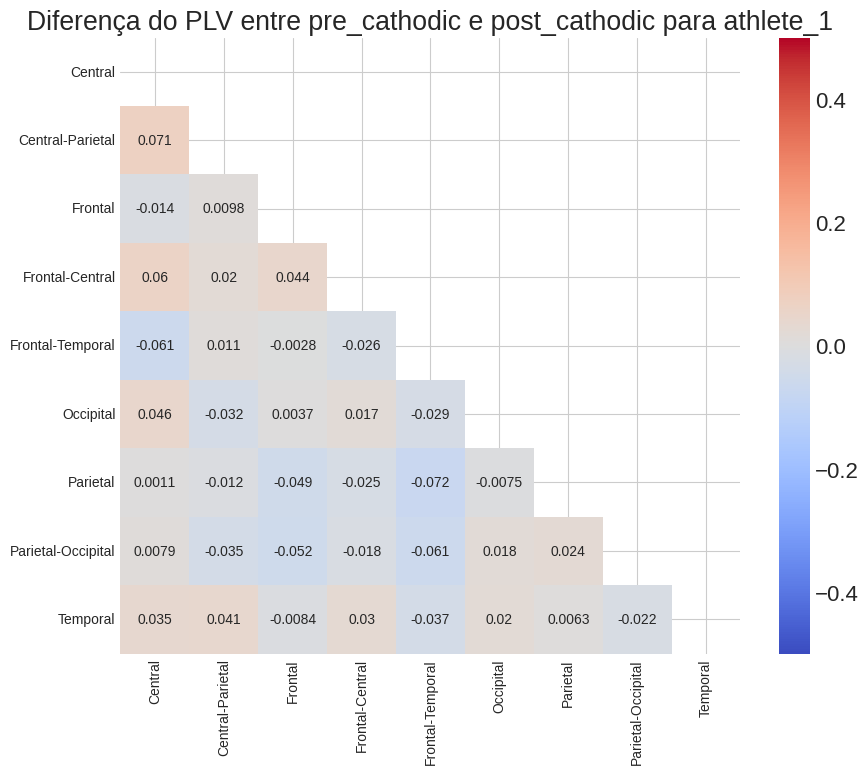

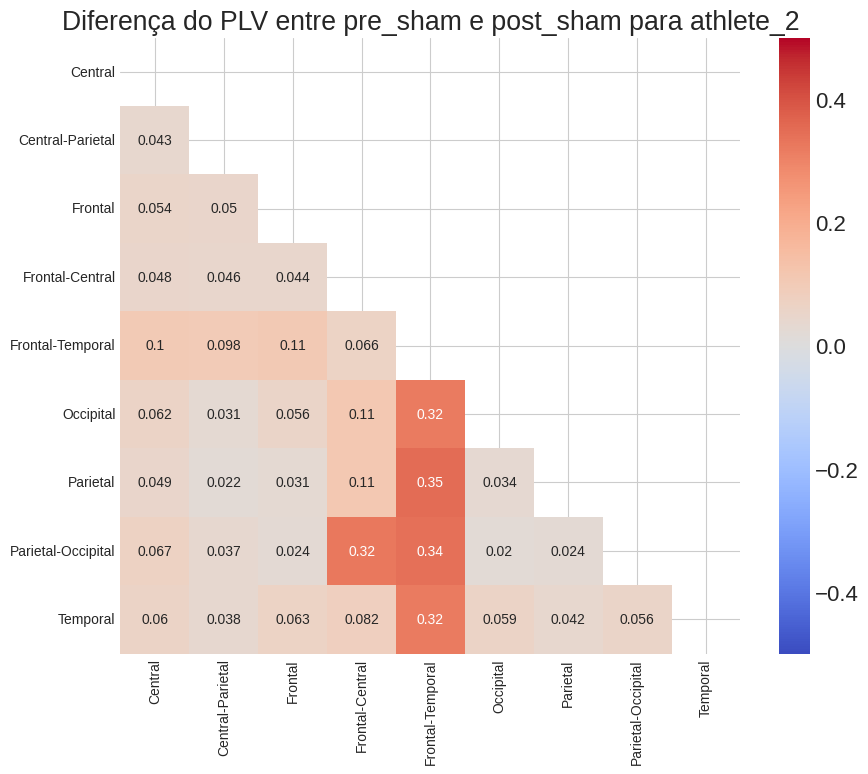

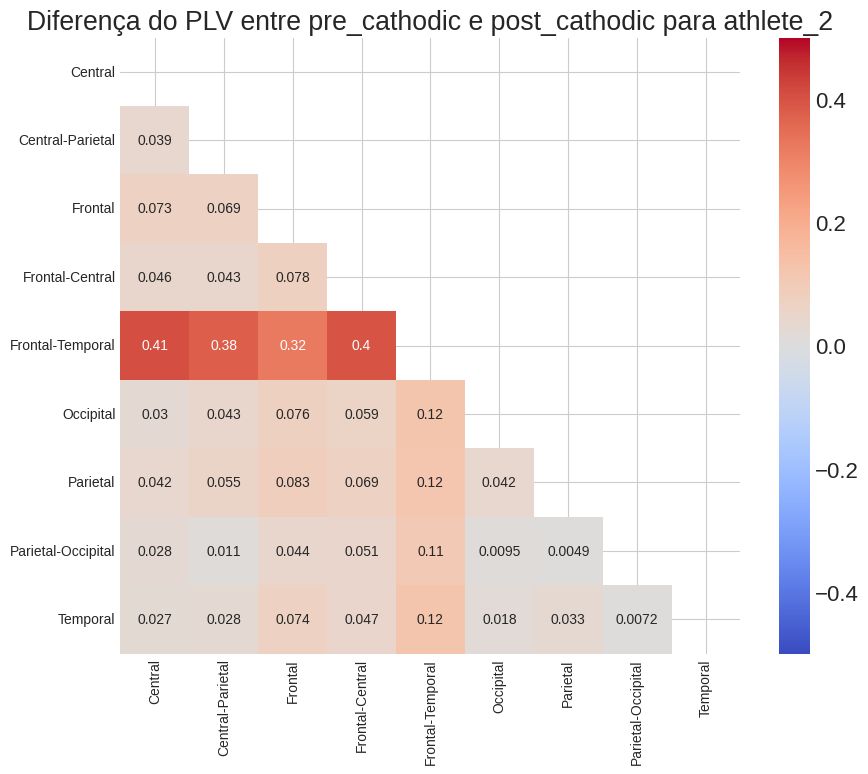

In [ ]:
def get_difference_pivot(plvs_processed_df, athlete, condition_1, condition_2):
    df_condition_1 = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == condition_1)]
    df_condition_2 = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == condition_2)]

    grouped_df_1 = df_condition_1.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()
    grouped_df_2 = df_condition_2.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()

    pivot_1 = grouped_df_1.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')
    pivot_2 = grouped_df_2.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')

    return pivot_2 - pivot_1

def plot_heatmap_difference(difference_pivot, athlete, condition_1, condition_2):
    plt.figure(figsize=(10, 8))

    # Create a mask for the upper triangle
    mask = np.triu(np.ones_like(difference_pivot, dtype=bool))

    ax = sns.heatmap(difference_pivot, mask=mask, cmap='coolwarm', annot=True, annot_kws={"size": 10}, vmin=-0.5, vmax=0.5)
    plt.title(f"Diferença do PLV entre {condition_1} e {condition_2} para {athlete}")

    region_labels = difference_pivot.columns.tolist()
    ax.set_xticks(np.arange(len(region_labels)) + 0.5)
    ax.set_yticks(np.arange(len(region_labels)) + 0.5)
    ax.set_xticklabels(region_labels, rotation=90, fontsize=10)
    ax.set_yticklabels(region_labels, rotation=0, fontsize=10)

    # rótulos das regiões
    ax.set_xlabel('')
    ax.set_ylabel('')

    filename = f"heatmap_{athlete}_{condition_1}_vs_{condition_2}.png"
    plt.show()
    plt.savefig(os.path.join('plots', filename))
    plt.close()


# Calculate the difference data for both athletes
difference_pivot_athlete1_pre_post_sham = get_difference_pivot(plvs_processed_df, athletes[0], 'pre_sham', 'post_sham')
difference_pivot_athlete2_pre_post_sham = get_difference_pivot(plvs_processed_df, athletes[1], 'pre_sham', 'post_sham')
difference_pivot_athlete1_pre_post_catodica = get_difference_pivot(plvs_processed_df, athletes[0], 'pre_cathodic', 'post_cathodic')
difference_pivot_athlete2_pre_post_catodica = get_difference_pivot(plvs_processed_df, athletes[1], 'pre_cathodic', 'post_cathodic')

# Plot the heatmaps for both athletes
for athlete, difference_pivot_pre_post_sham, difference_pivot_pre_post_catodica in zip(athletes, [difference_pivot_athlete1_pre_post_sham, difference_pivot_athlete2_pre_post_sham], [difference_pivot_athlete1_pre_post_catodica, difference_pivot_athlete2_pre_post_catodica]):
    plot_heatmap_difference(difference_pivot_pre_post_sham, athlete, 'pre_sham', 'post_sham')
    plot_heatmap_difference(difference_pivot_pre_post_catodica, athlete, 'pre_cathodic', 'post_cathodic')

In [ ]:
import numpy as np

data_list = []
for athlete, difference_pivot_pre_post_sham, difference_pivot_pre_post_catodica in zip(athletes, [difference_pivot_athlete1_pre_post_sham, difference_pivot_athlete2_pre_post_sham], [difference_pivot_athlete1_pre_post_catodica, difference_pivot_athlete2_pre_post_catodica]):
    difference_pivot_str_sham = difference_pivot_pre_post_sham.to_string()
    difference_pivot_str_catodica = difference_pivot_pre_post_catodica.to_string()

    data_list.append((athlete, 'pre_sham', 'post_sham', difference_pivot_str_sham))
    data_list.append((athlete, 'pre_cathodic', 'post_cathodic', difference_pivot_str_catodica))

# Convert the data list to a string format
data_str = ""
for athlete, condition_1, condition_2, difference_pivot_str in data_list:
    data_str += f"Athlete: {athlete}\n"
    data_str += f"Condition 1: {condition_1}\n"
    data_str += f"Condition 2: {condition_2}\n"
    data_str += f"{difference_pivot_str}\n\n"

print(data_str)

NameError: name 'difference_pivot_athlete1_pre_post_sham' is not defined

In the heatmap generated by the plot_heatmap_difference function, the values represent the difference in phase-locking value (PLV) correlation between the sham and catodica conditions after accounting for their respective pre-condition changes. Specifically, the values are calculated as follows:

- Calculate the PLV correlation difference between the post-sham and pre-sham conditions (difference_sham = pivot_post_sham - pivot_pre_sham).
- Calculate the PLV correlation difference between the post-catodica and pre-catodica conditions (difference_catodica = pivot_post_catodica - pivot_pre_catodica).
- Compute the difference between the catodica and sham conditions by subtracting the difference_sham from difference_catodica (difference_pivot = difference_catodica - difference_sham).

The values in the resulting heatmap (difference_pivot) indicate the difference in PLV correlation between the sham and catodica conditions after considering their changes from the pre-conditions.

Here's how to interpret the values:

- Positive values (warm colors) indicate that the PLV correlation is stronger in the catodica condition compared to the sham condition after accounting for their respective pre-condition changes.
- Negative values (cool colors) indicate that the PLV correlation is weaker in the catodica condition compared to the sham condition after accounting for their respective pre-condition changes.
- Values close to zero (colors close to white) indicate that there is little difference in PLV correlation between the sham and catodica conditions after accounting for their respective pre-condition changes.

By analyzing the heatmap, you can understand the specific effects of the catodica treatment on the synchronization between brain regions compared to the sham condition.

## Non normalized

In [ ]:
def plot_heatmap_difference(plvs_processed_df, athlete, pre_sham, post_sham, pre_catodica, post_catodica):
    df_pre_sham = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == pre_sham)]
    df_post_sham = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == post_sham)]
    df_pre_catodica = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == pre_catodica)]
    df_post_catodica = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == post_catodica)]

    grouped_pre_sham = df_pre_sham.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()
    grouped_post_sham = df_post_sham.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()
    grouped_pre_catodica = df_pre_catodica.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()
    grouped_post_catodica = df_post_catodica.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()

    pivot_pre_sham = grouped_pre_sham.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')
    pivot_post_sham = grouped_post_sham.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')
    pivot_pre_catodica = grouped_pre_catodica.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')
    pivot_post_catodica = grouped_post_catodica.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')

    difference_sham = pivot_post_sham - pivot_pre_sham
    difference_catodica = pivot_post_catodica - pivot_pre_catodica

    difference_pivot = difference_catodica - difference_sham

    # Create a mask for the upper triangle
    mask = np.triu(np.ones_like(difference_pivot, dtype=bool))
    plt.figure(figsize=(10, 8))
    ax = sns.heatmap(difference_pivot, mask=mask, cmap='coolwarm', annot=True, annot_kws={"size": 10})
    plt.title(f"PLV Correlation Difference between Sham and Catodica Conditions for {athlete}")

    region_labels = difference_pivot.columns.tolist()
    ax.set_xticks(np.arange(len(region_labels)) + 0.5)
    ax.set_yticks(np.arange(len(region_labels)) + 0.5)
    ax.set_xticklabels(region_labels, rotation=90, fontsize=10)
    ax.set_yticklabels(region_labels, rotation=0, fontsize=10)

    # rótulos das regiões
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Salva o gráfico no diretório "plots" com um nome específico
    plt.savefig(f'plots/heatmap_difference_{athlete}.png')
    plt.close()  # Fecha a figura para não mostrá-la
    plt.show()

for athlete in athletes:
    plot_heatmap_difference(plvs_processed_df, athlete, 'pre_sham', 'post_sham', 'pre_cathodic', 'post_cathodic')

## Normalized

This code first calculates the difference pivots for both athletes and then finds the global minimum and maximum values. Next, it normalizes the difference pivots using these global values. Finally, it plots the normalized heatmaps for both athletes, allowing you to compare their PLV between regions more easily.

In [ ]:
!pip install mne --quiet

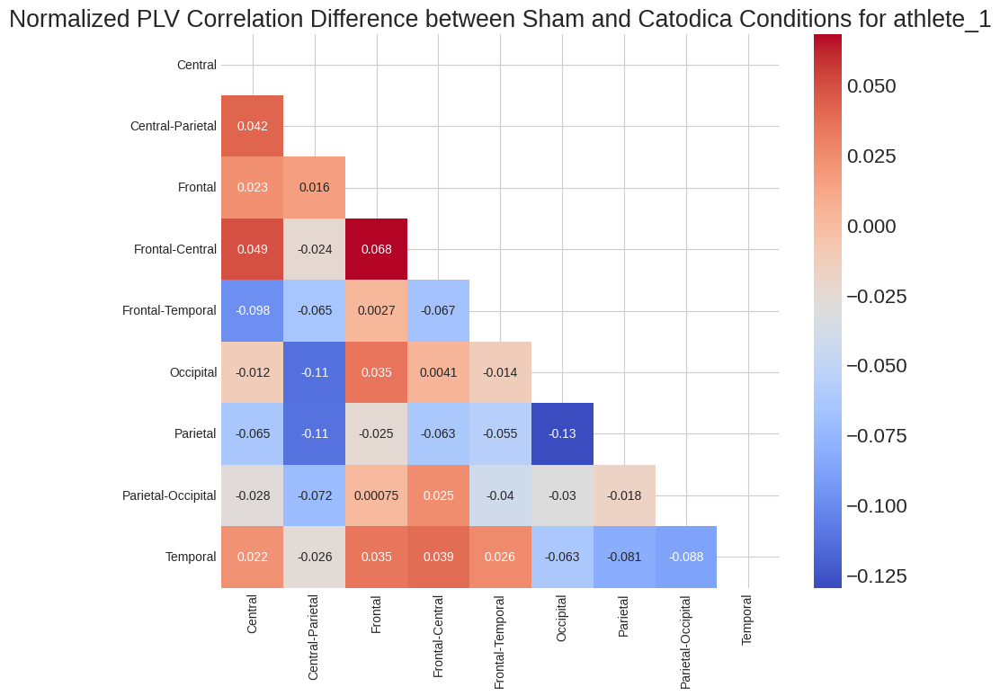

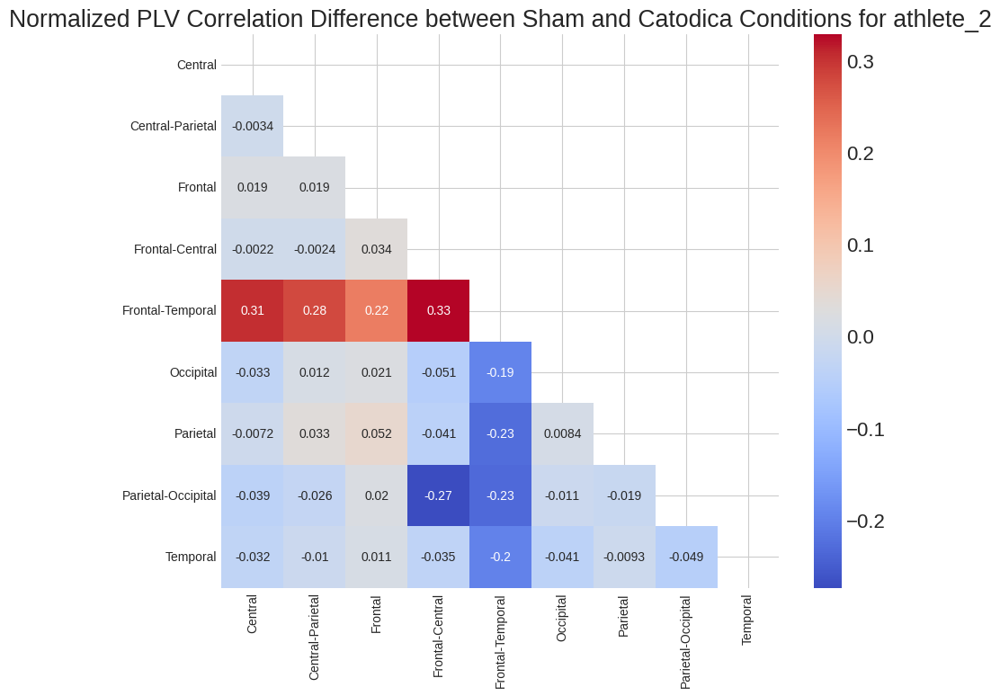

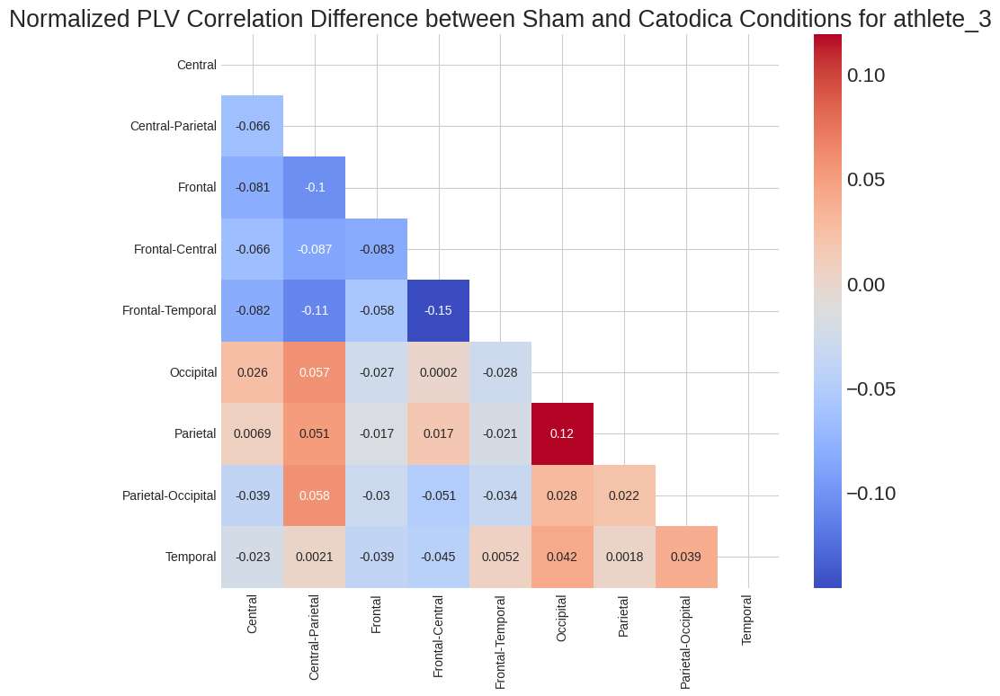

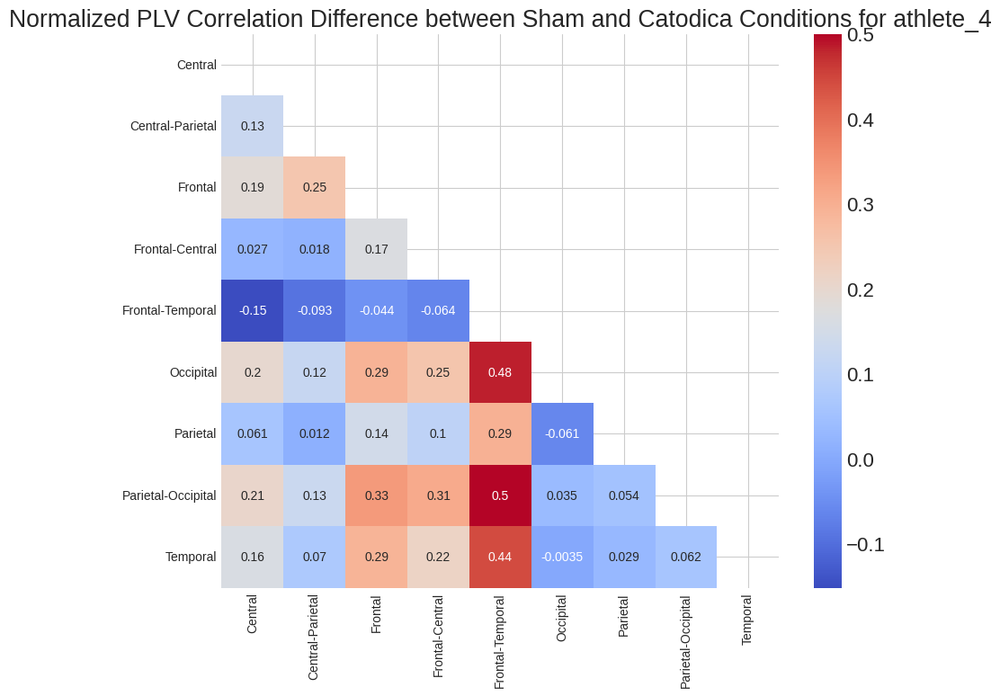

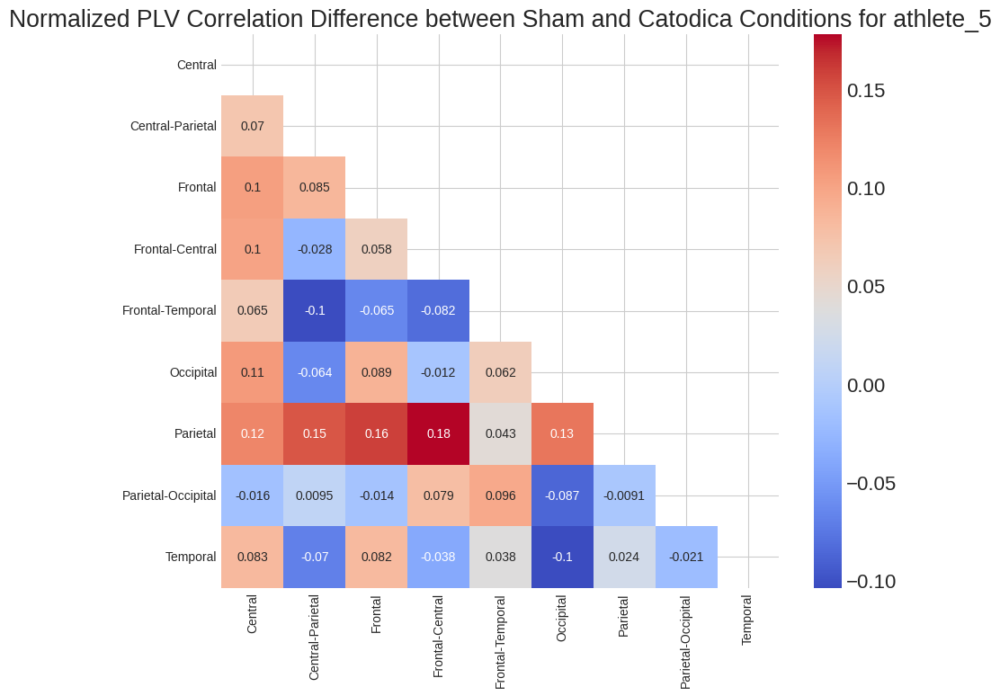

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


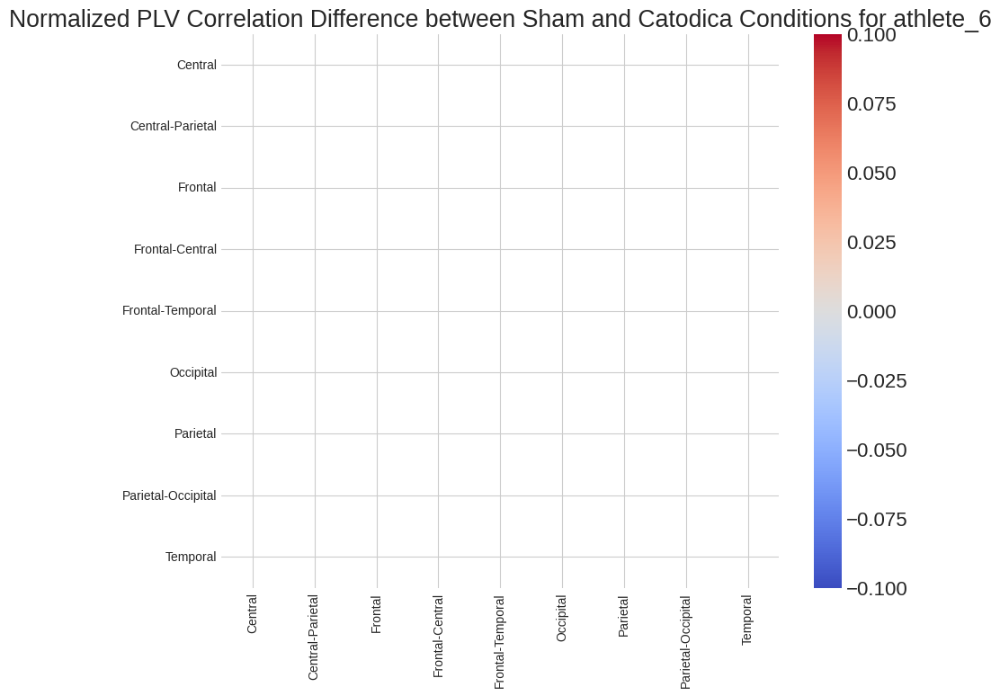

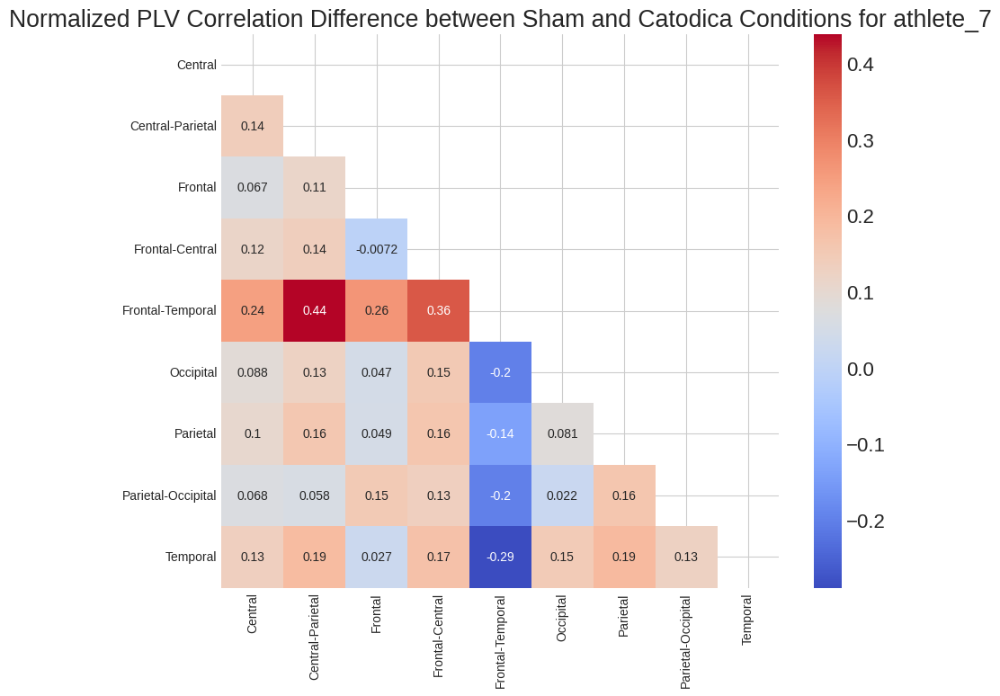

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mne

def normalize_data(data, lower_bound=-1, upper_bound=1):
    min_data = data.min().min()  # Using pandas' min function
    max_data = data.max().max()  # Using pandas' max function
    return lower_bound + (data - min_data) * (upper_bound - lower_bound) / (max_data - min_data)

def get_difference_pivot(plvs_processed_df, athlete, pre_sham, post_sham, pre_catodica, post_catodica):
    df_pre_sham = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == pre_sham)]
    df_post_sham = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == post_sham)]
    df_pre_catodica = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == pre_catodica)]
    df_post_catodica = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == post_catodica)]

    grouped_pre_sham = df_pre_sham.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()
    grouped_post_sham = df_post_sham.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()
    grouped_pre_catodica = df_pre_catodica.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()
    grouped_post_catodica = df_post_catodica.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()

    pivot_pre_sham = grouped_pre_sham.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')
    pivot_post_sham = grouped_post_sham.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')
    pivot_pre_catodica = grouped_pre_catodica.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')
    pivot_post_catodica = grouped_post_catodica.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')

    difference_sham = pivot_post_sham - pivot_pre_sham
    difference_catodica = pivot_post_catodica - pivot_pre_catodica

    difference_pivot = difference_catodica - difference_sham
    return difference_pivot


def plot_heatmap_difference(normalized_difference_pivot, athlete):
    plt.figure(figsize=(10, 8))

    # Create a mask for the upper triangle
    mask = np.triu(np.ones_like(normalized_difference_pivot, dtype=bool))

    ax = sns.heatmap(normalized_difference_pivot, mask=mask, cmap='coolwarm', annot=True, annot_kws={"size": 10})
    plt.title(f"Normalized PLV Correlation Difference between Sham and Catodica Conditions for {athlete}")

    region_labels = normalized_difference_pivot.columns.tolist()
    ax.set_xticks(np.arange(len(region_labels)) + 0.5)
    ax.set_yticks(np.arange(len(region_labels)) + 0.5)
    ax.set_xticklabels(region_labels, rotation=90, fontsize=10)
    ax.set_yticklabels(region_labels, rotation=0, fontsize=10)

    # rótulos das regiões
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Save the plot in the "plots" folder
    file_name = f"Normalized_PLV_Correlation_Difference_{athlete}.png"
    file_path = os.path.join("plots", file_name)
    plt.savefig(file_path, bbox_inches='tight', dpi=300)

    plt.show()


# Loop through all athletes to get the difference pivots, normalize and plot them
for athlete in athletes:
    difference_pivot = get_difference_pivot(plvs_processed_df, athlete, 'pre_sham', 'post_sham', 'pre_cathodic', 'post_cathodic')

    # Flatten the DataFrame to a 1D array
    flattened_data = difference_pivot.values.flatten()

    # Find global minimum and maximum values for normalization
    global_min = flattened_data.min()
    global_max = flattened_data.max()

    # Normalize the difference pivot using global minimum and maximum values
    normalized_difference_pivot = normalize_data(difference_pivot, global_min, global_max)

    # Plot the normalized heatmap for the athlete
    plot_heatmap_difference(normalized_difference_pivot, athlete)

## Normalized between -1 and 1

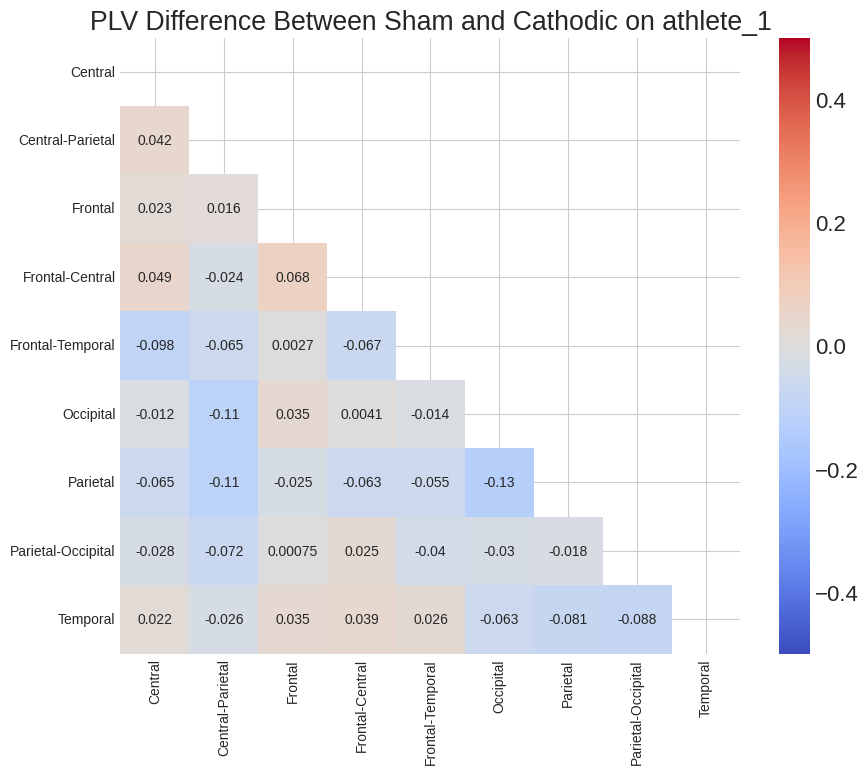

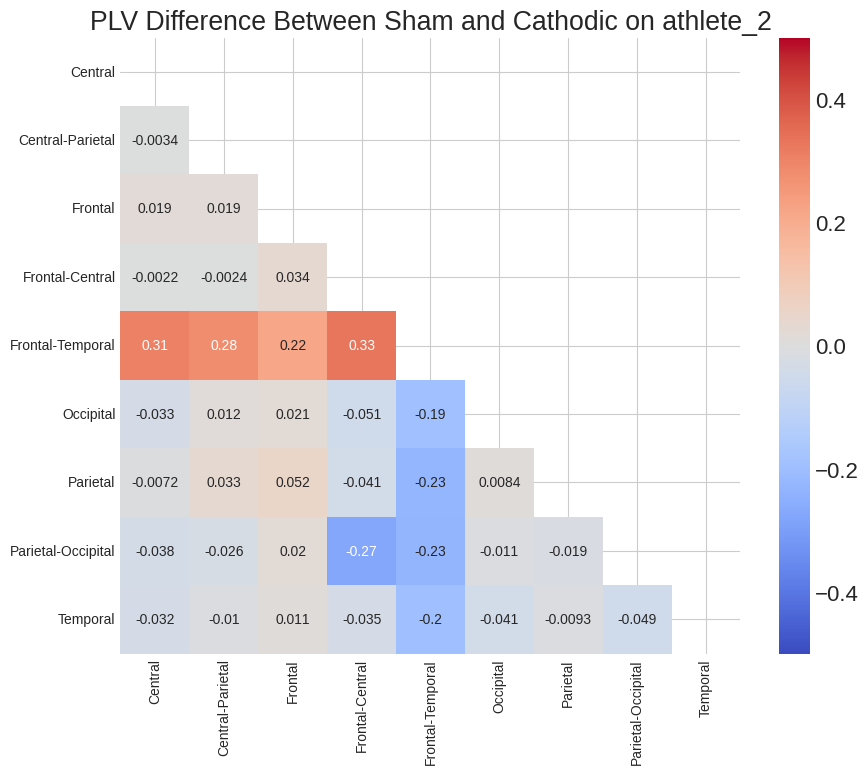

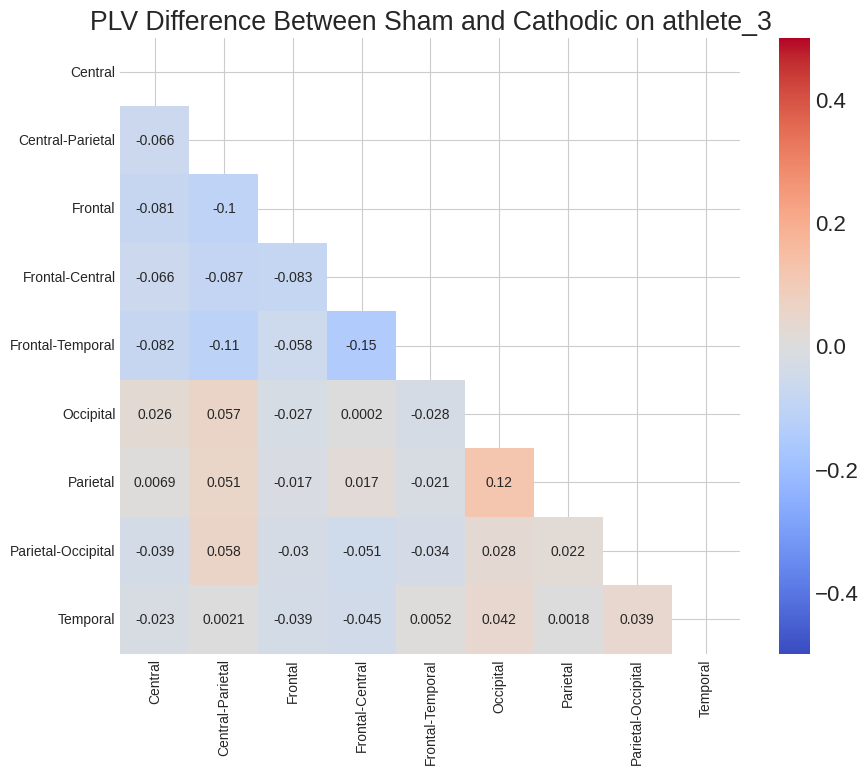

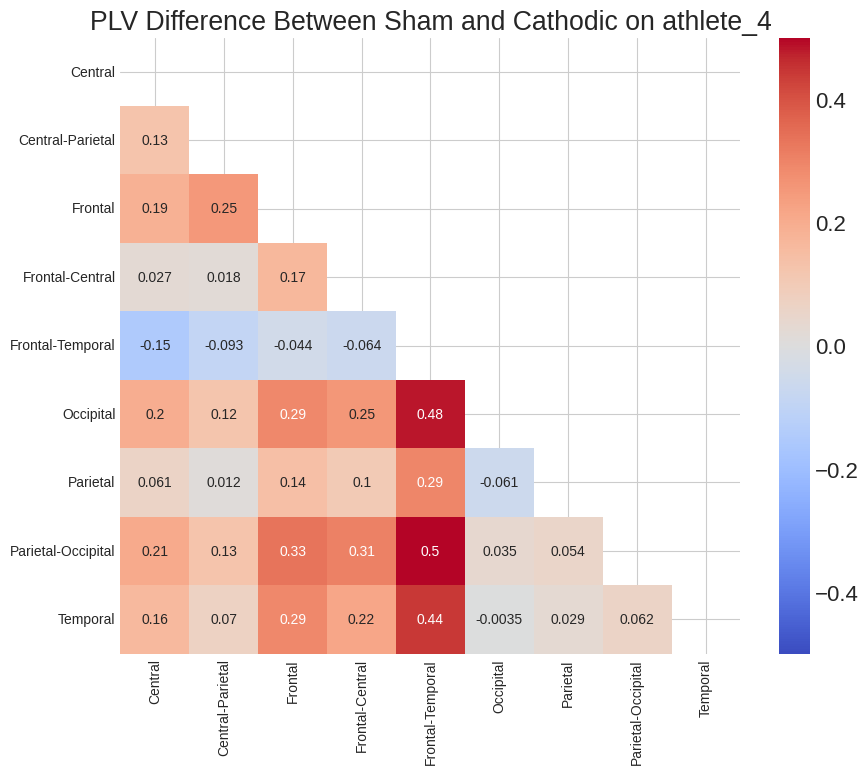

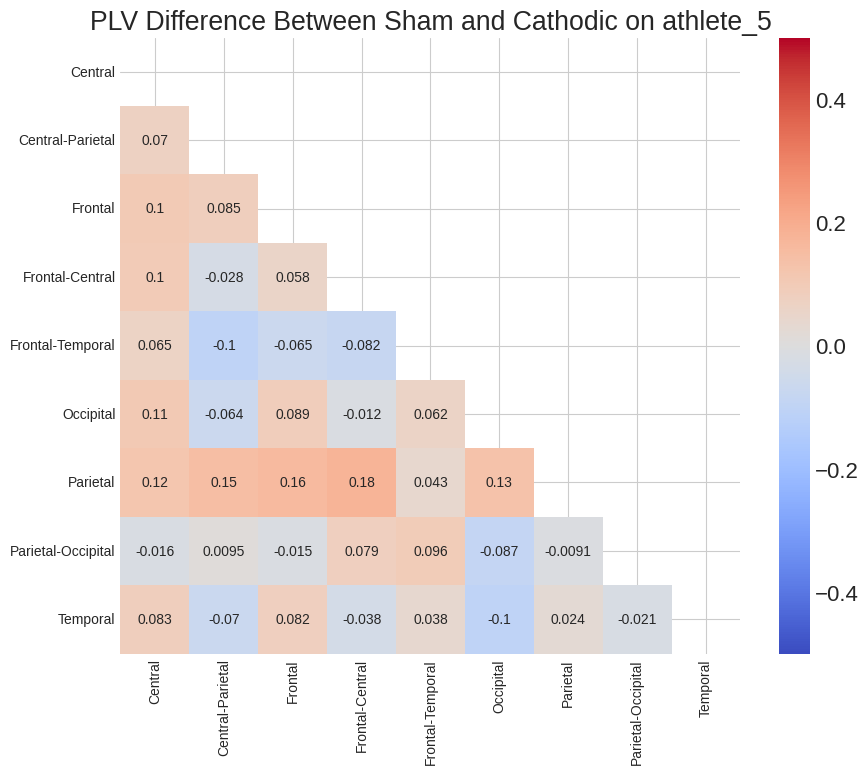

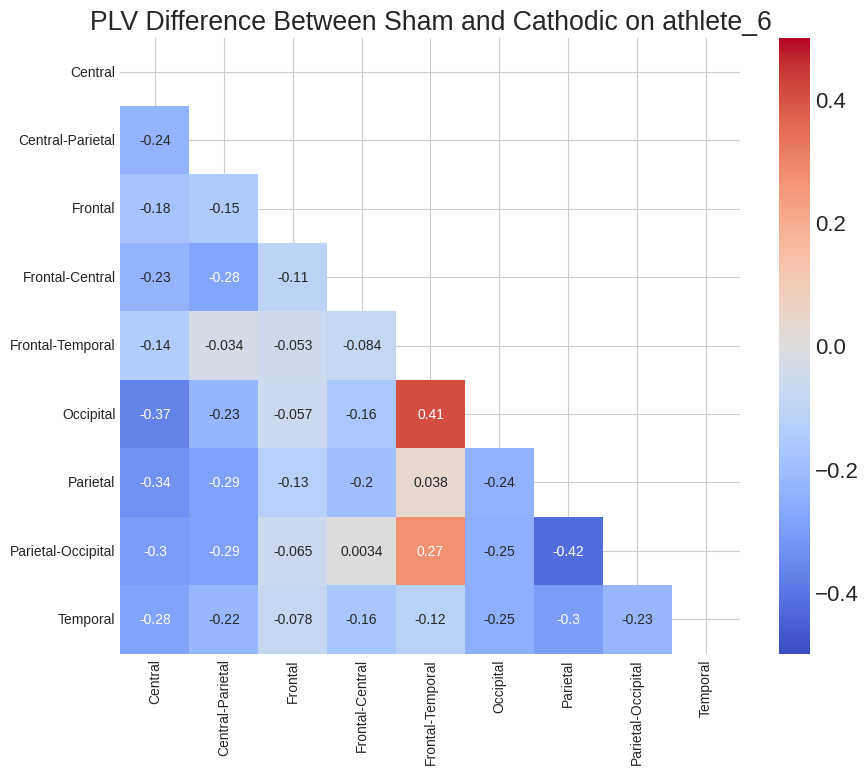

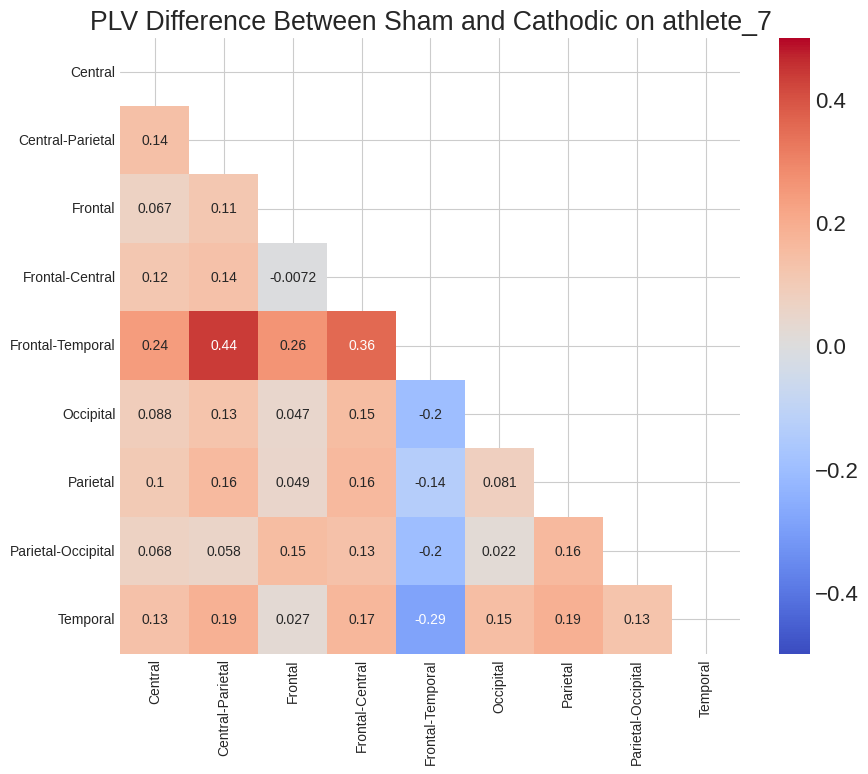

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mne

def get_difference_pivot(plvs_processed_df, athlete, pre_sham, post_sham, pre_catodica, post_catodica):
    df_pre_sham = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == pre_sham)]
    df_post_sham = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == post_sham)]
    df_pre_catodica = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == pre_catodica)]
    df_post_catodica = plvs_processed_df[(plvs_processed_df['Athlete'] == athlete) & (plvs_processed_df['Condition'] == post_catodica)]

    grouped_pre_sham = df_pre_sham.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()
    grouped_post_sham = df_post_sham.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()
    grouped_pre_catodica = df_pre_catodica.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()
    grouped_post_catodica = df_post_catodica.groupby(['channel_1_region', 'channel_2_region', 'Condition']).agg({'PLV': 'mean'}).reset_index()

    pivot_pre_sham = grouped_pre_sham.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')
    pivot_post_sham = grouped_post_sham.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')
    pivot_pre_catodica = grouped_pre_catodica.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')
    pivot_post_catodica = grouped_post_catodica.pivot_table(index='channel_1_region', columns='channel_2_region', values='PLV')

    difference_sham = pivot_post_sham - pivot_pre_sham
    difference_catodica = pivot_post_catodica - pivot_pre_catodica

    difference_pivot = difference_catodica - difference_sham
    return difference_pivot

def plot_heatmap_difference(difference_pivot, athlete):
    plt.figure(figsize=(10, 8))

    # Create a mask for the upper triangle
    mask = np.triu(np.ones_like(difference_pivot, dtype=bool))

    ax = sns.heatmap(difference_pivot, mask=mask, cmap='coolwarm', annot=True, annot_kws={"size": 10}, vmin=-0.5, vmax=0.5)
    plt.title(f"PLV Difference Between Sham and Cathodic on {athlete}")

    region_labels = difference_pivot.columns.tolist()
    ax.set_xticks(np.arange(len(region_labels)) + 0.5)
    ax.set_yticks(np.arange(len(region_labels)) + 0.5)
    ax.set_xticklabels(region_labels, rotation=90, fontsize=10)
    ax.set_yticklabels(region_labels, rotation=0, fontsize=10)

    # rótulos das regiões
    ax.set_xlabel('')
    ax.set_ylabel('')

    file_name = f"Diferença_no_PLV_entre_Sham_e_Catódica_para_{athlete}.png"
    plt.savefig(f'plots/{file_name}', bbox_inches='tight')
    plt.show()


# Store the difference_pivot values for each athlete in a list
difference_pivots_list = []

for athlete in athletes:
    difference_pivot = get_difference_pivot(plvs_processed_df, athlete, 'pre_sham', 'post_sham', 'pre_cathodic', 'post_cathodic')
    plot_heatmap_difference(difference_pivot, athlete)
    difference_pivots_list.append(difference_pivot)

In [ ]:
def matrix_to_string(matrix):
    matrix_str = ""
    for row_index, row in matrix.iterrows():
        row_str = " ".join([f"{value:.2f}" for value in row])
        matrix_str += f"{row_str}\n"
    return matrix_str

data_list = []

for athlete, difference_pivot in zip(athletes, difference_pivots_list):
    matrix_str = matrix_to_string(difference_pivot)
    data_list.append((athlete, matrix_str))

# Convert the data list to a string format
data_str = ""
for athlete, matrix_str in data_list:
    data_str += f"Athlete: {athlete}\n"
    data_str += matrix_str
    data_str += "\n"

# Print or use the data_str variable as needed
print(data_str)

Athlete: athlete_1
-0.00 -0.04 0.02 0.02 0.02 -0.05 -0.07 -0.10 -0.04
0.04 -0.08 0.08 0.05 0.03 -0.09 -0.11 -0.07 -0.02
0.02 0.02 0.04 0.05 0.03 0.02 -0.03 -0.04 -0.01
0.05 -0.02 0.07 0.07 0.09 -0.06 -0.08 -0.06 -0.00
-0.10 -0.06 0.00 -0.07 0.01 -0.04 -0.12 -0.12 -0.09
-0.01 -0.11 0.04 0.00 -0.01 -0.08 -0.08 -0.02 -0.04
-0.06 -0.11 -0.03 -0.06 -0.06 -0.13 -0.13 -0.13 -0.10
-0.03 -0.07 0.00 0.02 -0.04 -0.03 -0.02 -0.04 -0.07
0.02 -0.03 0.03 0.04 0.03 -0.06 -0.08 -0.09 -0.01

Athlete: athlete_2
-0.04 -0.03 -0.01 -0.08 -0.20 -0.05 -0.02 -0.06 -0.03
-0.00 0.03 0.04 -0.01 -0.12 0.00 0.02 -0.00 0.02
0.02 0.02 0.03 0.01 0.05 0.01 0.03 -0.00 0.02
-0.00 -0.00 0.03 -0.01 -0.08 -0.03 0.00 -0.03 -0.01
0.31 0.28 0.22 0.33 0.27 0.25 0.22 0.24 0.32
-0.03 0.01 0.02 -0.05 -0.19 0.00 0.00 -0.03 -0.00
-0.01 0.03 0.05 -0.04 -0.23 0.01 0.02 -0.01 0.01
-0.04 -0.03 0.02 -0.27 -0.23 -0.01 -0.02 -0.04 -0.03
-0.03 -0.01 0.01 -0.03 -0.20 -0.04 -0.01 -0.05 -0.04

Athlete: athlete_3
-0.03 0.02 -0.04 -0.04 -0.03 0.

## Topo map

In [ ]:
!pip install mne --quiet

In [ ]:
avg_plv_corr = athlete_condition_df.groupby('Channel_1')['PLV'].mean().reset_index()
len(avg_plv_corr['PLV'].to_numpy())

60

## non normalized

In [ ]:
import numpy as np
from scipy.spatial import distance
from scipy.optimize import minimize


# Define the channel names and their corresponding positions in the standard 10-20 system
montage = mne.channels.make_standard_montage('standard_1005')
channel_list = list(set(df_combined['Channel_1'].unique()).union(df_combined['Channel_2'].unique()))


# Define the position of FTT7h by interpolating the positions of neighboring channels
pos_T7 = montage.get_positions()['ch_pos']['T7']
pos_P7 = montage.get_positions()['ch_pos']['P7']
pos_F9 = montage.get_positions()['ch_pos']['F9']
pos_FTT7h = pos_T7 + (pos_P7 - pos_T7) * distance.euclidean(pos_T7, pos_F9) / distance.euclidean(pos_T7, pos_P7)

# Get the 2D positions of the channels from the 1020 montage
channel_positions = {ch_name: montage.get_positions()['ch_pos'][ch_name] for ch_name in channel_list}
channel_positions['FTT7h'] = pos_FTT7h
channel_positions_2d = np.array([pos[:2] for pos in channel_positions.values()])



def plot_topomap_average(df_combined, athlete, condition):
    athlete_condition_df = df_combined[(df_combined['Athlete'] == athlete) & (df_combined['Condition'] == condition)]

    # Calculate the average PLV correlation for each channel with all other channels
    avg_plv_corr = athlete_condition_df.groupby('Channel_1')['PLV'].mean().reset_index()

    data = avg_plv_corr['PLV'].to_numpy()

    fig, ax = plt.subplots()
    fig.suptitle(f"Average PLV Correlation for {athlete} - {condition}")
    im, _ = mne.viz.plot_topomap(data, channel_positions_2d, axes=ax, names=channel_list, cmap='coolwarm')

    # Add channel names to the topomap
    for idx, ch_name in enumerate(channel_list):
        x, y = channel_positions_2d[idx]
        ax.text(x, y, ch_name, fontsize=8, ha='center', va='center', color='black')

    # Define the filename and path to save the figure
    filename = f"{athlete}_{condition}_topomap.png"
    filepath = os.path.join('plots', filename)
    fig.savefig(filepath, dpi=300)  # Save the figure to the specified path with 300 dpi resolution
    plt.close(fig)  # Close the figure after saving



for athlete in athletes:
    for condition in conditions:
        plot_topomap_average(df_combined, athlete, condition)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import mne

def get_avg_plv_corr(df_combined, athlete, condition):
    athlete_condition_df = df_combined[(df_combined['Athlete'] == athlete) & (df_combined['Condition'] == condition)]
    avg_plv_corr = athlete_condition_df.groupby('Channel_1')['PLV'].mean().reset_index()
    return avg_plv_corr['PLV'].to_numpy()

def get_difference_data(df_combined, athlete, pre_sham, post_sham, pre_catodica, post_catodica):
    data_pre_sham = get_avg_plv_corr(df_combined, athlete, pre_sham)
    data_post_sham = get_avg_plv_corr(df_combined, athlete, post_sham)
    data_pre_catodica = get_avg_plv_corr(df_combined, athlete, pre_catodica)
    data_post_catodica = get_avg_plv_corr(df_combined, athlete, post_catodica)

    difference_sham = data_post_sham - data_pre_sham
    difference_catodica = data_post_catodica - data_pre_catodica
    return difference_catodica - difference_sham

# Calculate the difference data for all athletes using a loop
difference_data_athletes = [get_difference_data(df_combined, athlete, 'pre_sham', 'post_sham', 'pre_cathodic', 'post_cathodic') for athlete in athletes]

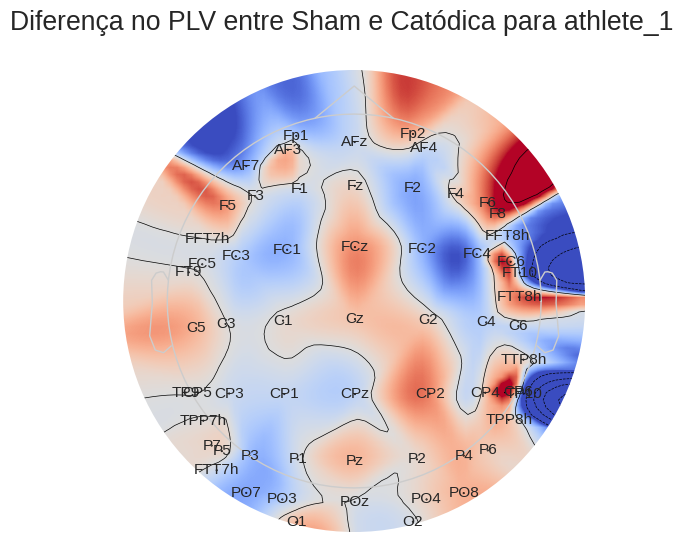

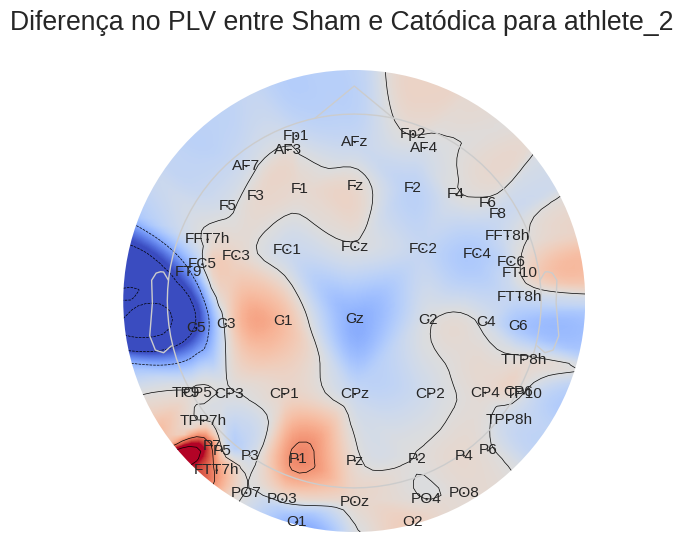

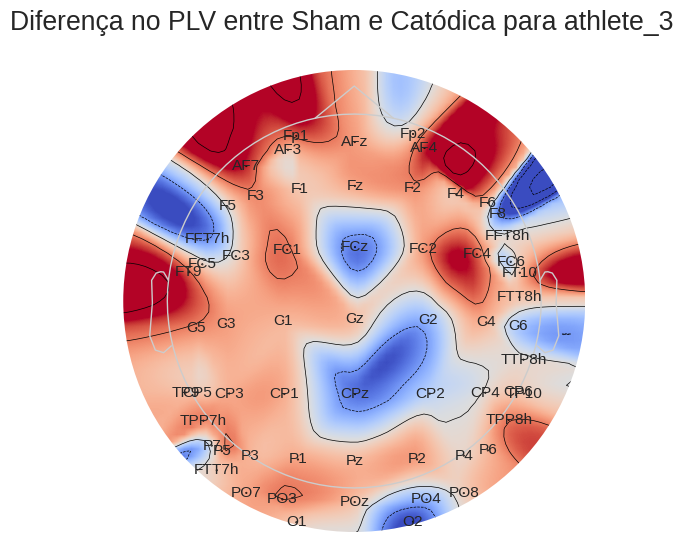

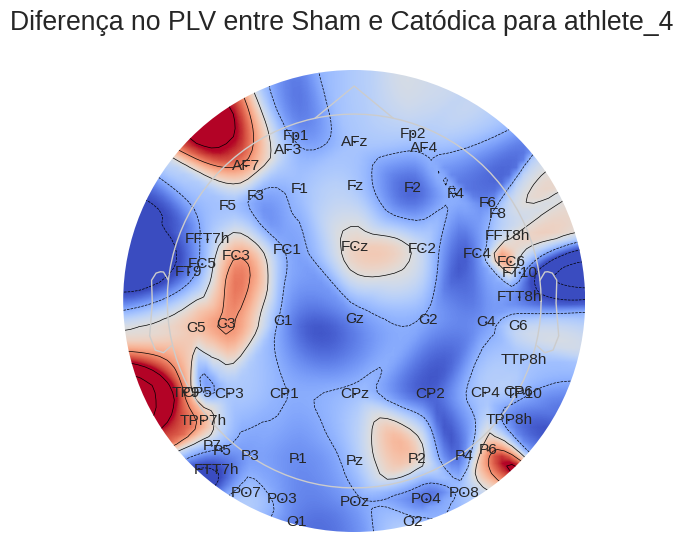

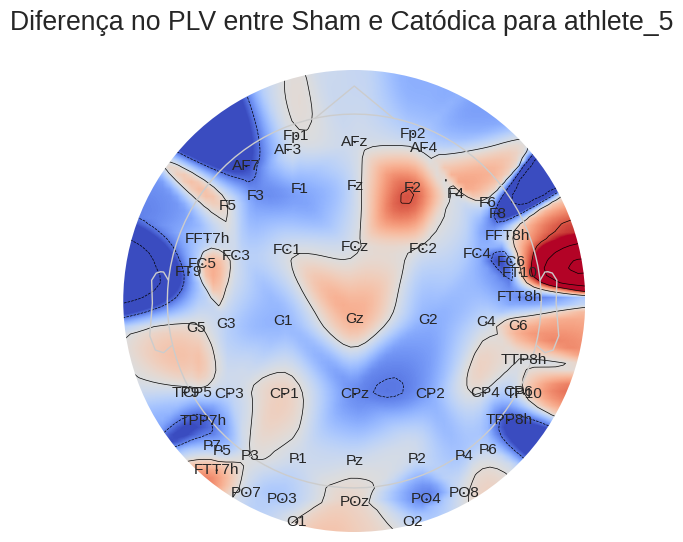

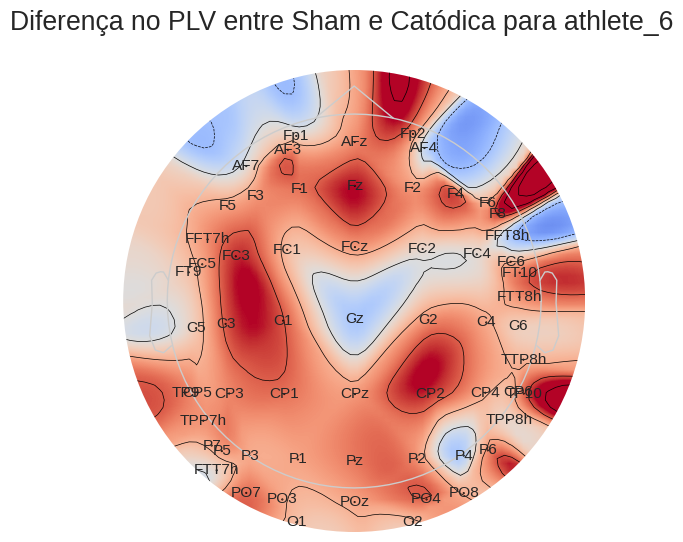

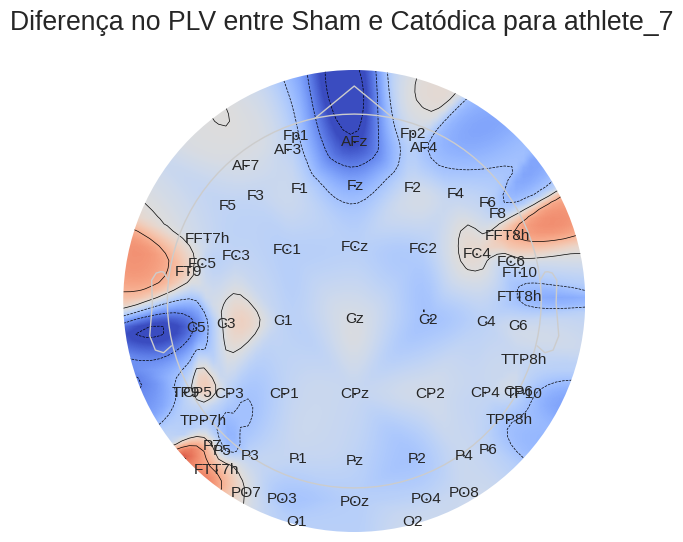

In [ ]:
def plot_topomap_difference(difference_data, athlete):
    fig, ax = plt.subplots()
    fig.suptitle(f"Diferença no PLV entre Sham e Catódica para {athlete}")

    im, _ = mne.viz.plot_topomap(difference_data, channel_positions_2d, axes=ax, names=channel_list, cmap='coolwarm')

    # Add channel names and original values to the topomap
    for idx, ch_name in enumerate(channel_list):
        x, y = channel_positions_2d[idx]
        ax.text(x, y, f"{ch_name}\n{difference_data[idx]:.2f}", fontsize=8, ha='center', va='center', color='black')

    # Ensure the 'plots' directory exists
    if not os.path.exists('plots'):
        os.makedirs('plots')

    # Save the figure to the 'plots' directory
    fig.savefig(os.path.join('plots', f'difference_topomap_{athlete}.png'))
    plt.close(fig)  # Close the figure to free up memory

# Loop through each athlete to plot and save the topomaps
for athlete in athletes:
    difference_data = get_difference_data(df_combined, athlete, 'pre_cathodic', 'post_cathodic', 'pre_sham', 'post_sham')
    plot_topomap_difference(difference_data, athlete)

## normalized (between -1 and 1)

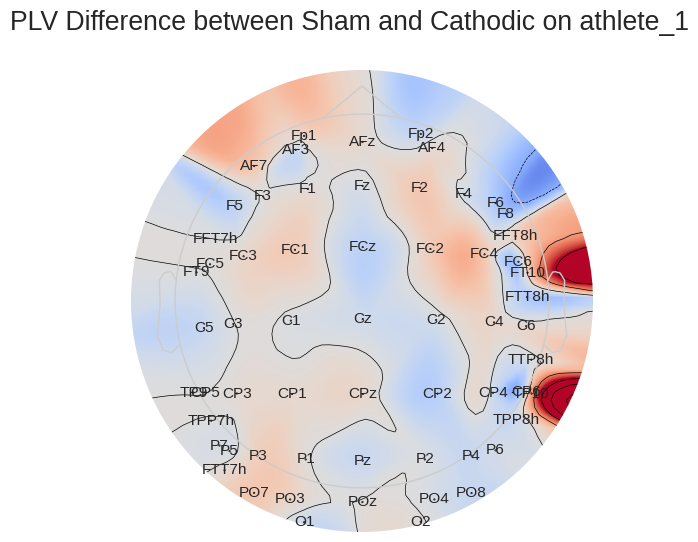

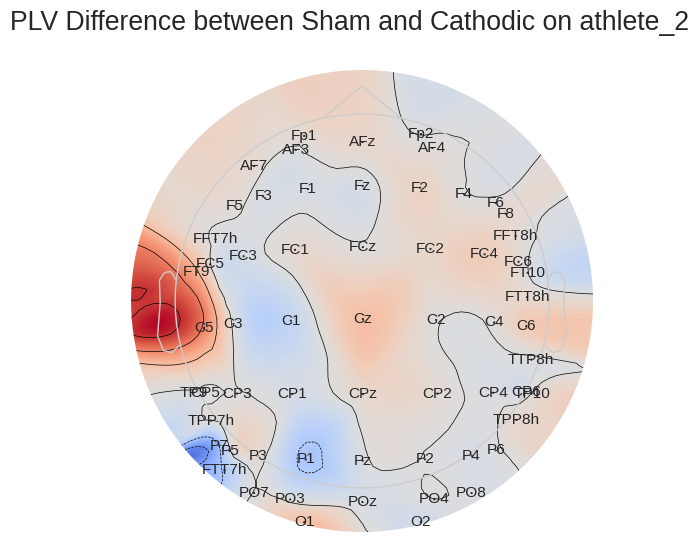

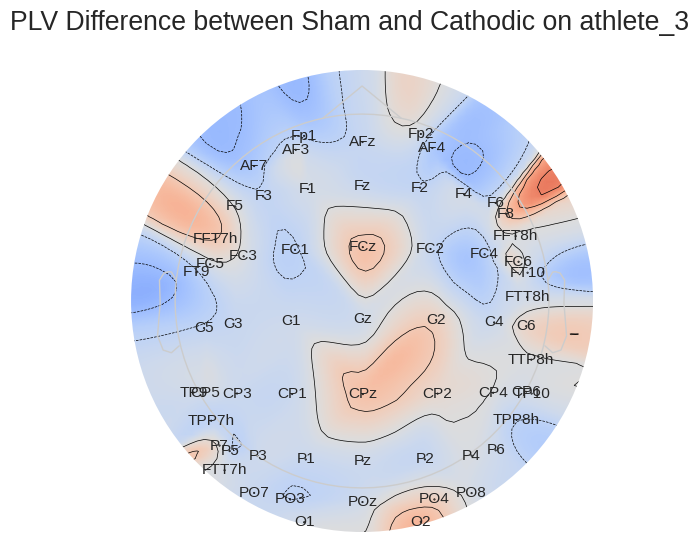

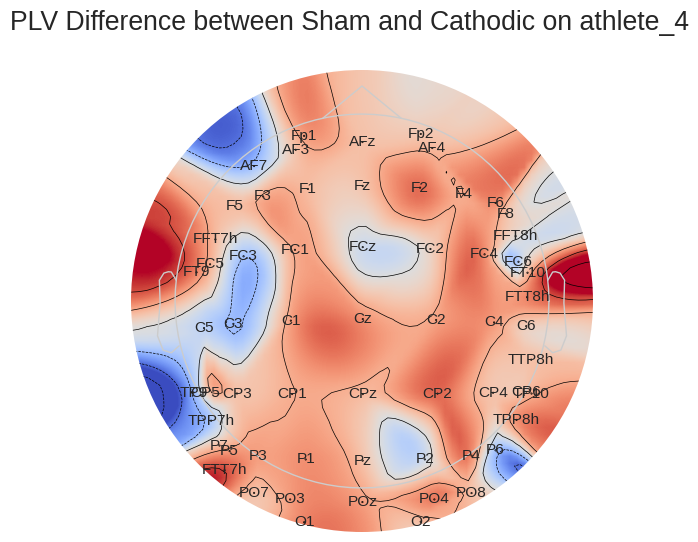

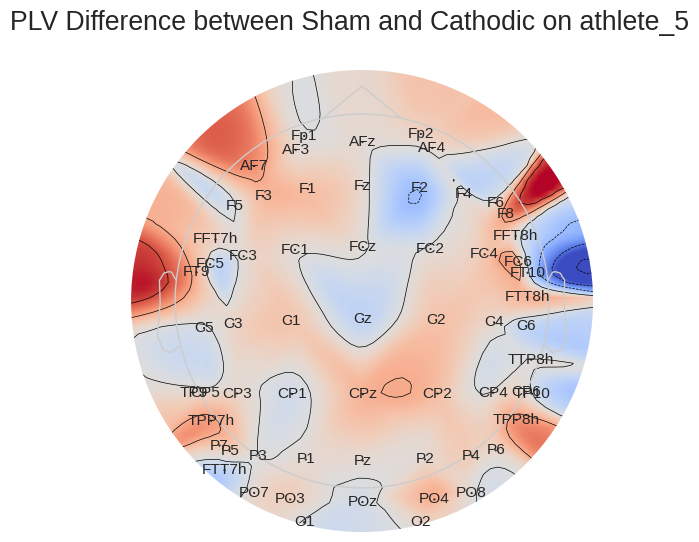

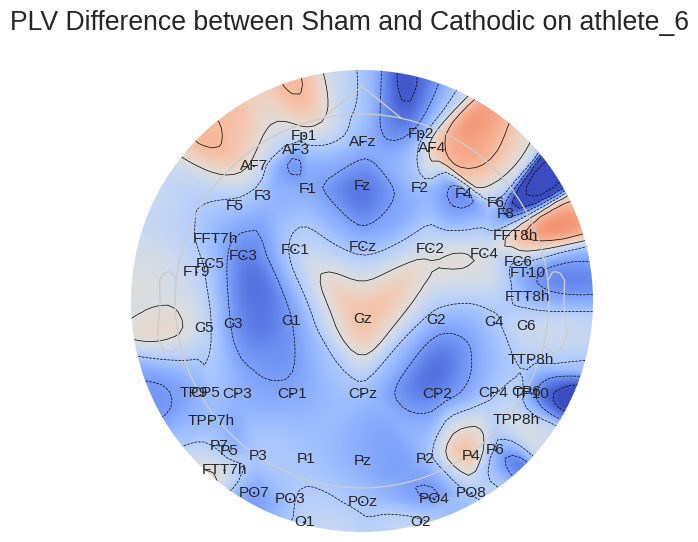

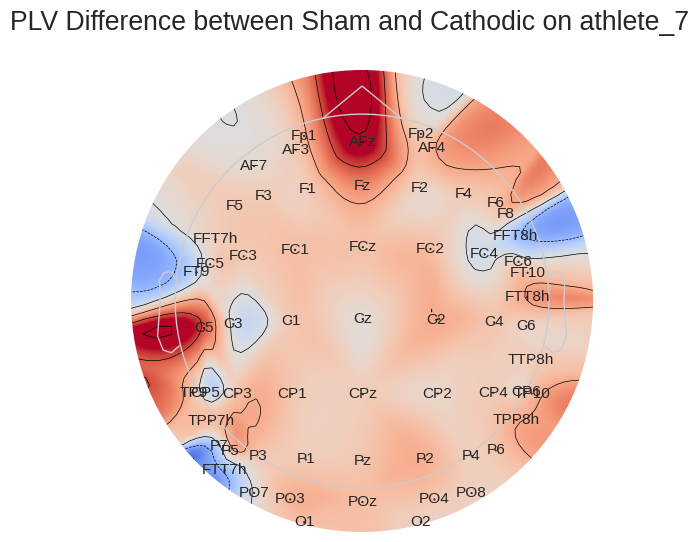

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import mne
import os

def get_avg_plv_corr(df_combined, athlete, condition):
    athlete_condition_df = df_combined[(df_combined['Athlete'] == athlete) & (df_combined['Condition'] == condition)]
    avg_plv_corr = athlete_condition_df.groupby('Channel_1')['PLV'].mean().reset_index()
    return avg_plv_corr['PLV'].to_numpy()

def get_difference_data(df_combined, athlete, pre_sham, post_sham, pre_catodica, post_catodica):
    data_pre_sham = get_avg_plv_corr(df_combined, athlete, pre_sham)
    data_post_sham = get_avg_plv_corr(df_combined, athlete, post_sham)
    data_pre_catodica = get_avg_plv_corr(df_combined, athlete, pre_catodica)
    data_post_catodica = get_avg_plv_corr(df_combined, athlete, post_catodica)

    difference_sham = data_post_sham - data_pre_sham
    difference_catodica = data_post_catodica - data_pre_catodica
    return difference_catodica - difference_sham

def plot_topomap_difference(difference_data, athlete):
    fig, ax = plt.subplots()
    fig.suptitle(f"PLV Difference between Sham and Cathodic on {athlete}")

    im, _ = mne.viz.plot_topomap(difference_data, channel_positions_2d, axes=ax, names=channel_list, cmap='coolwarm', vlim=(-0.5, 0.5))

    # Add channel names and original values to the topomap
    for idx, ch_name in enumerate(channel_list):
        x, y = channel_positions_2d[idx]
        ax.text(x, y, f"{ch_name}\n{difference_data[idx]:.2f}", fontsize=8, ha='center', va='center', color='black')

    # Ensure the 'plots' directory exists
    if not os.path.exists('plots'):
        os.makedirs('plots')

    # Save the figure to the 'plots' directory
    fig.savefig(os.path.join('plots', f'difference_topomap_{athlete}.png'))
    plt.close(fig)  # Close the figure to free up memory

# Loop through each athlete to calculate the difference data and plot and save the topomaps
for athlete in athletes:
    difference_data = get_difference_data(df_combined, athlete, 'pre_sham', 'post_sham', 'pre_cathodic', 'post_cathodic')
    plot_topomap_difference(difference_data, athlete)

In [ ]:
import shutil
from google.colab import files

# Compactar a pasta "plots" em "plots.zip"
shutil.make_archive('plots', 'zip', 'plots')

# Disponibilizar o arquivo ZIP para download
files.download('plots.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import os
import zipfile
from google.colab import files

# Function to check if a file is an image
def is_image_file(filename):
    for ext in ['.png', '.jpg', '.jpeg', '.gif', '.bmp']:
        if filename.lower().endswith(ext):
            return True
    return False

# Create a ZIP file
zip_filename = "selected_files.zip"
with zipfile.ZipFile(zip_filename, 'w') as zipf:
    # Add files from 'plots' subfolder
    if os.path.exists('plots'):
        for foldername, subfolders, filenames in os.walk('plots'):
            for filename in filenames:
                file_path = os.path.join(foldername, filename)
                zipf.write(file_path)

    # Add image files from the main folder
    for filename in os.listdir('.'):
        if is_image_file(filename):
            zipf.write(filename)

# Download the created ZIP file
files.download(zip_filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>